# ROI 1900

In [1]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi1900"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=1900)
        
        
    

In [2]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1900/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1900/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




Using TensorFlow backend.


Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 10s 3ms/step - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.0709 - val_mean_squared_error: 0.0709
Epoch 2/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 3/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0556 - mean_squared_error: 0.0556 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 4/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0495 - mean_squared_error: 0.0495 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 5/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0384 - val_mean_squared_error: 0.0384
Epoch 6/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0401 - mean_squared_error: 0.040

3600/3600 [==============================] - 1s 378us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0100 - val_mean_squared_error: 0.0100
Epoch 98/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0097 - val_mean_squared_error: 0.0097
Epoch 99/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0100 - val_mean_squared_error: 0.0100
Epoch 100/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0094 - val_mean_squared_error: 0.0094
Epoch 101/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0089 - val_mean_squared_error: 0.0089
Epoch 102/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0092 - val_mean_squared_error: 0.00

3600/3600 [==============================] - 1s 406us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 194/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 195/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 196/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 197/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 198/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0055 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 372us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 290/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 291/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 292/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0053 - val_mean_squared_error: 0.0053
Epoch 293/2000
3600/3600 [==============================] - 1s 374us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 294/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0045 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 370us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 386/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 387/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 388/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 389/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 390/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0036 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 382us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 482/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 483/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 484/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 485/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 486/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0041 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 383us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 578/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 579/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 580/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 581/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 582/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0038 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 384us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 674/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 675/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 676/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 677/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 678/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0032 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 405us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 770/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 771/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 772/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 773/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 774/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0036 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 372us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 866/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 867/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 868/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 869/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 870/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0029 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 369us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 962/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 963/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 964/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 965/2000
3600/3600 [==============================] - 1s 404us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 966/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 375us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1058/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1059/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1060/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1061/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1062/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 363us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1106/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1107/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1108/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1109/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1110/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 400us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1154/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1155/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1156/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1157/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1158/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 361us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1202/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1203/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1204/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1205/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1206/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 380us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1250/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1251/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1252/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1253/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1254/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 390us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1298/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1299/2000
3600/3600 [==============================] - 1s 413us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1300/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1301/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1302/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_erro

3600/3600 [==============================] - 1s 368us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1346/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1347/2000
3600/3600 [==============================] - 1s 348us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1348/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1349/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1350/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_erro

3600/3600 [==============================] - 1s 373us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1394/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1395/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1396/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1397/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1398/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0028 - val_mean_squared_erro

3600/3600 [==============================] - 1s 369us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1442/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1443/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1444/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1445/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1446/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_erro

3600/3600 [==============================] - 1s 377us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1490/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1491/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1492/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1493/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1494/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 380us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1538/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1539/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1540/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1541/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1542/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_erro

3600/3600 [==============================] - 1s 367us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1586/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1587/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1588/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1589/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1590/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0024 - val_mean_squared_erro

3600/3600 [==============================] - 1s 362us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1634/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1635/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1636/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1637/2000
3600/3600 [==============================] - 1s 404us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1638/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_erro

3600/3600 [==============================] - 1s 362us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1682/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1683/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1684/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1685/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1686/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0024 - val_mean_squared_erro

3600/3600 [==============================] - 1s 379us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1730/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1731/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1732/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1733/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1734/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0021 - val_mean_squared_erro

3600/3600 [==============================] - 1s 363us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1778/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1779/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1780/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1781/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1782/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_erro

3600/3600 [==============================] - 1s 386us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1826/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1827/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1828/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1829/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1830/2000
3600/3600 [==============================] - 1s 405us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 366us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1874/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1875/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1876/2000
3600/3600 [==============================] - 1s 405us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1877/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1878/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 371us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1922/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1923/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1924/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1925/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1926/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_erro

3600/3600 [==============================] - 1s 372us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1970/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1971/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1972/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1973/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1974/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_erro

<Figure size 640x480 with 1 Axes>

save the model


(500, 9)


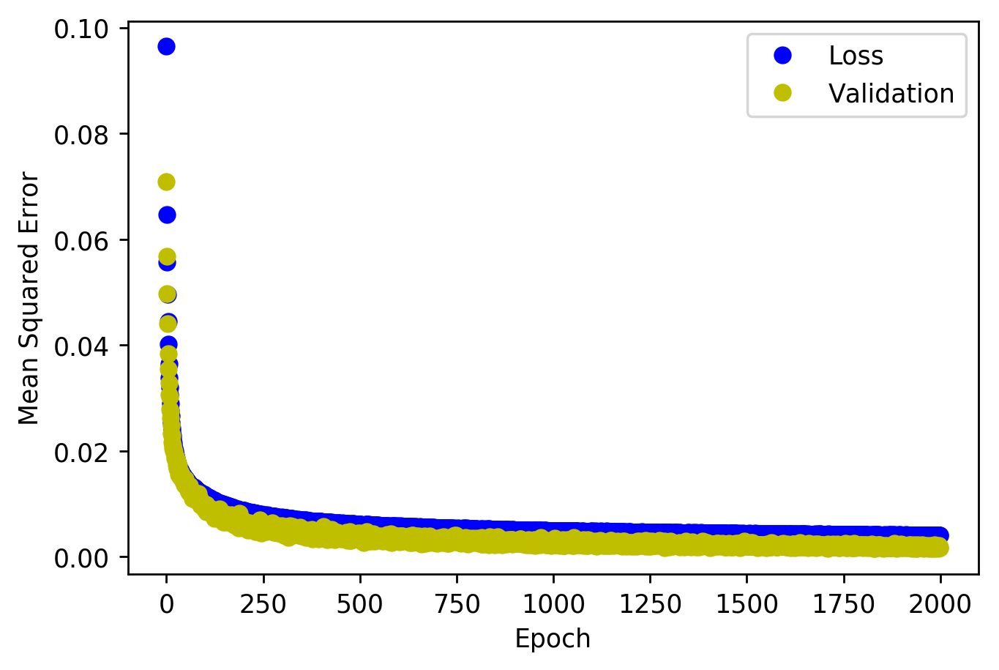

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


<Figure size 432x288 with 0 Axes>

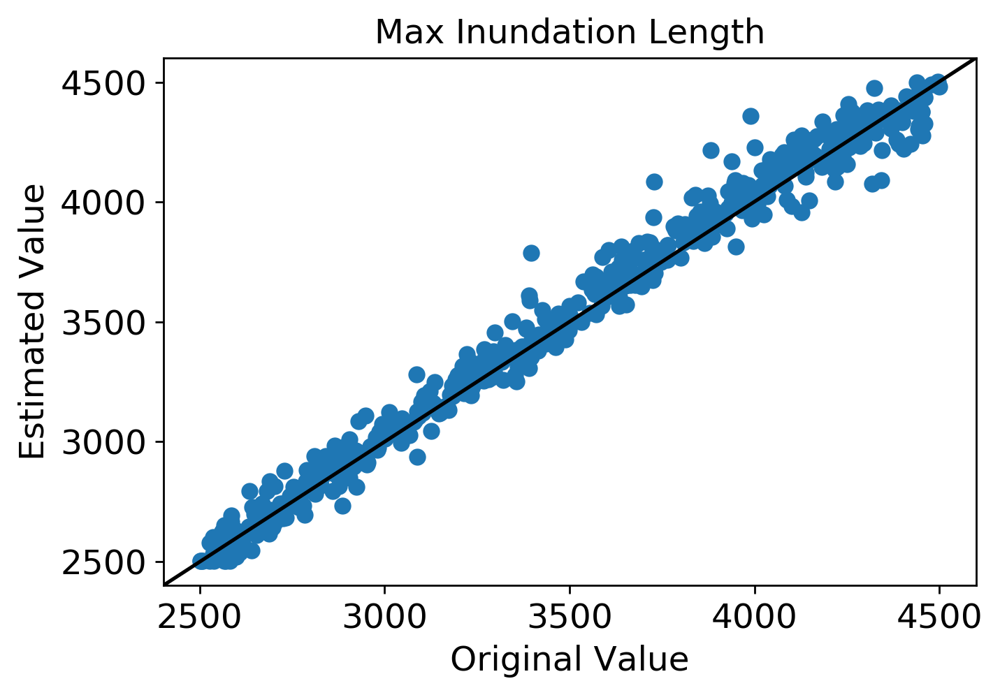

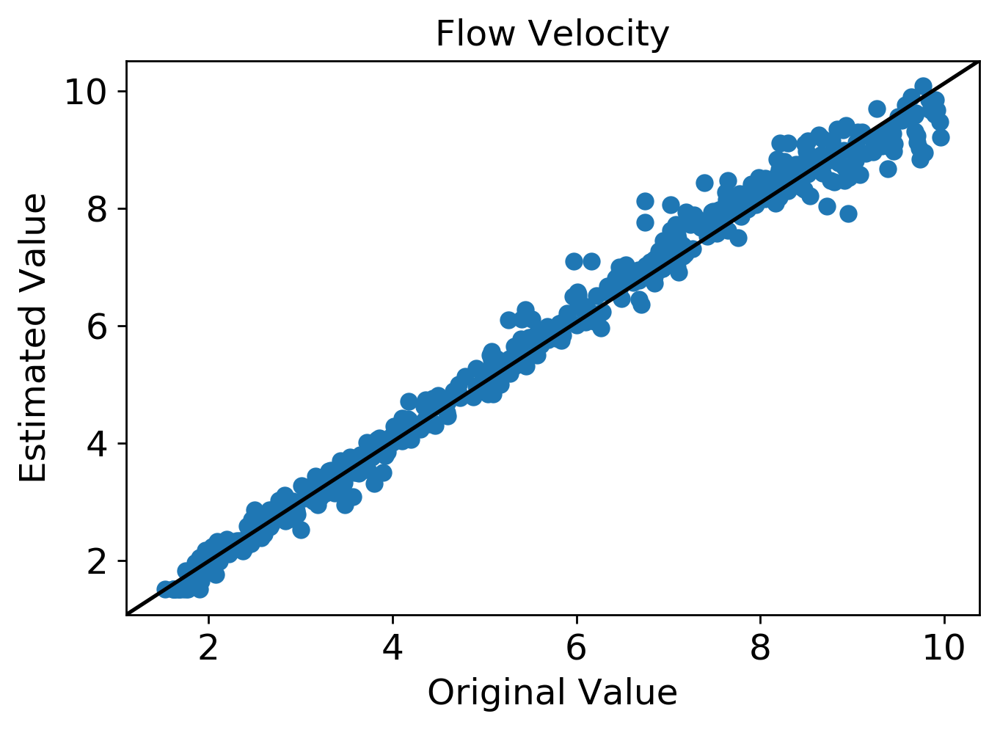

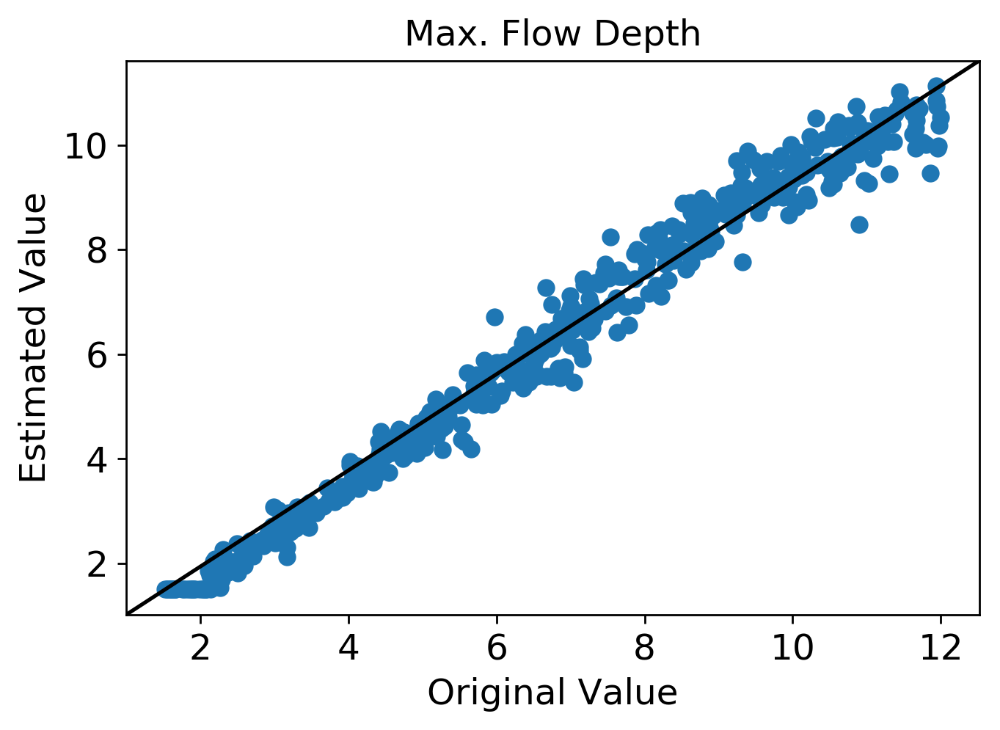

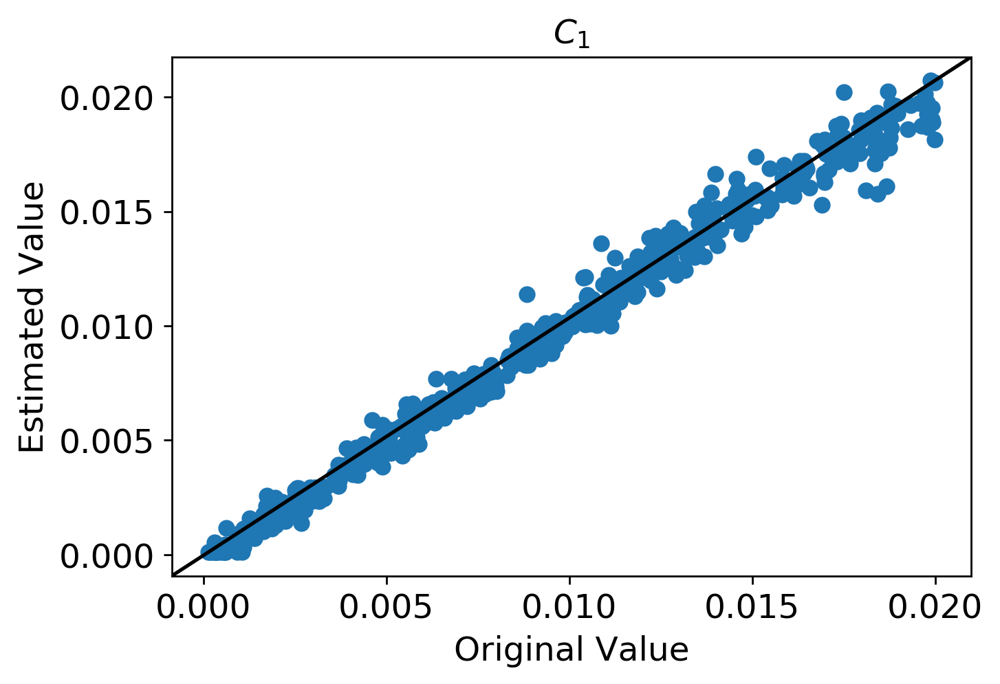

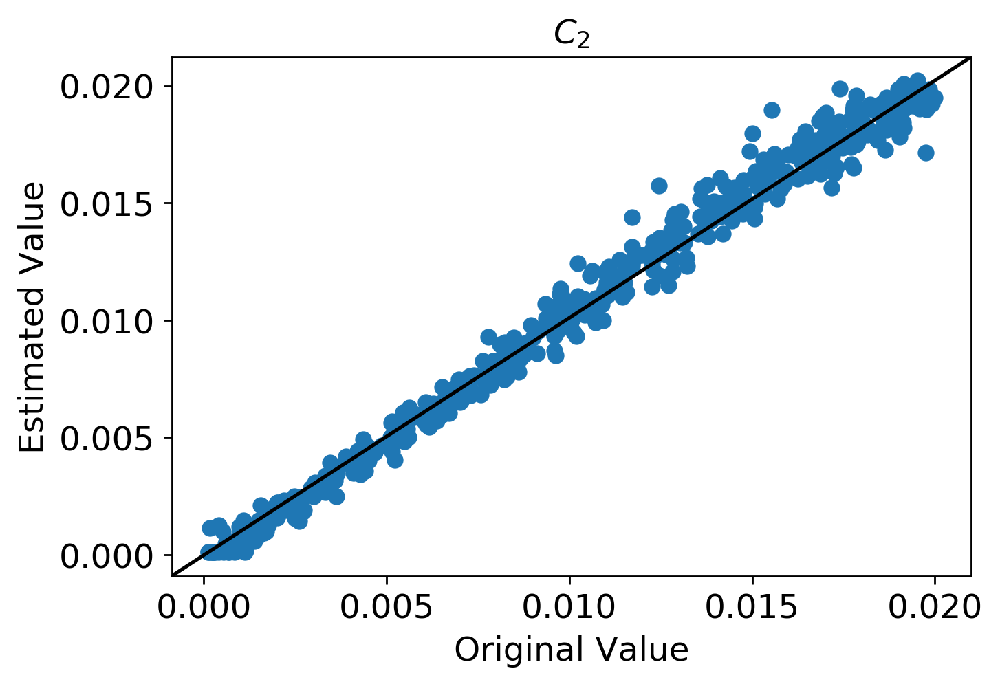

...

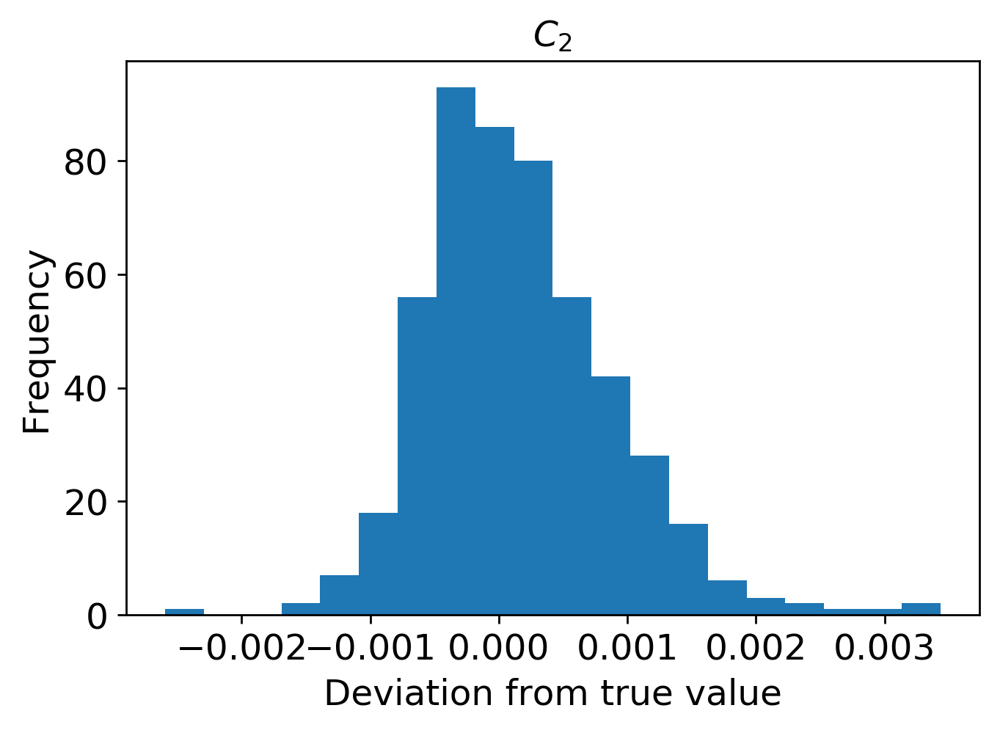

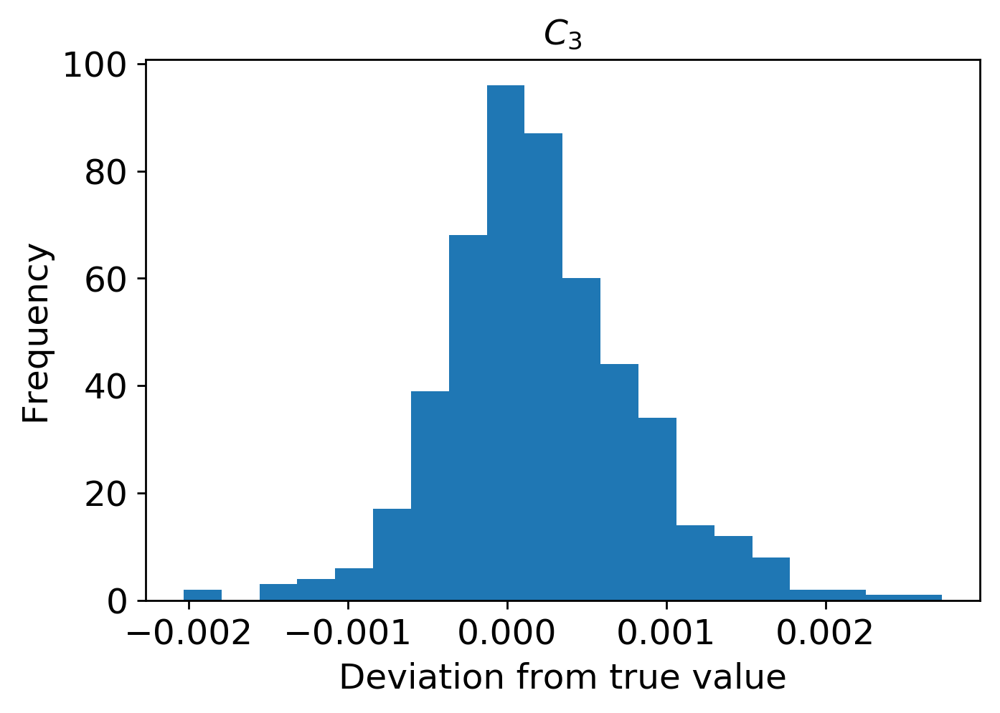

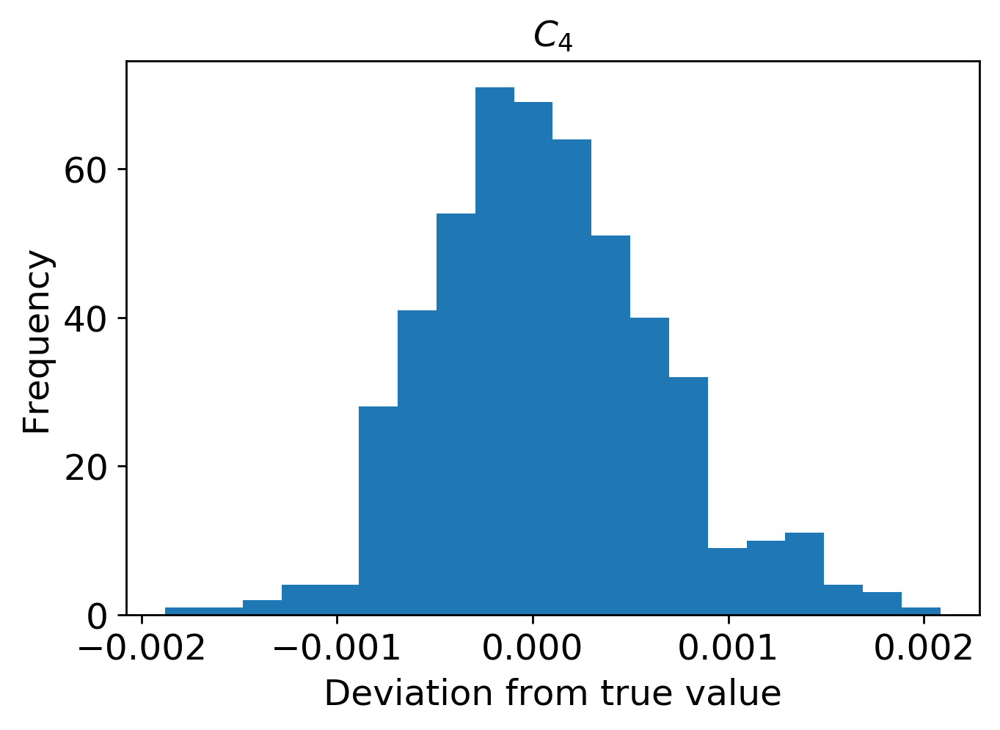

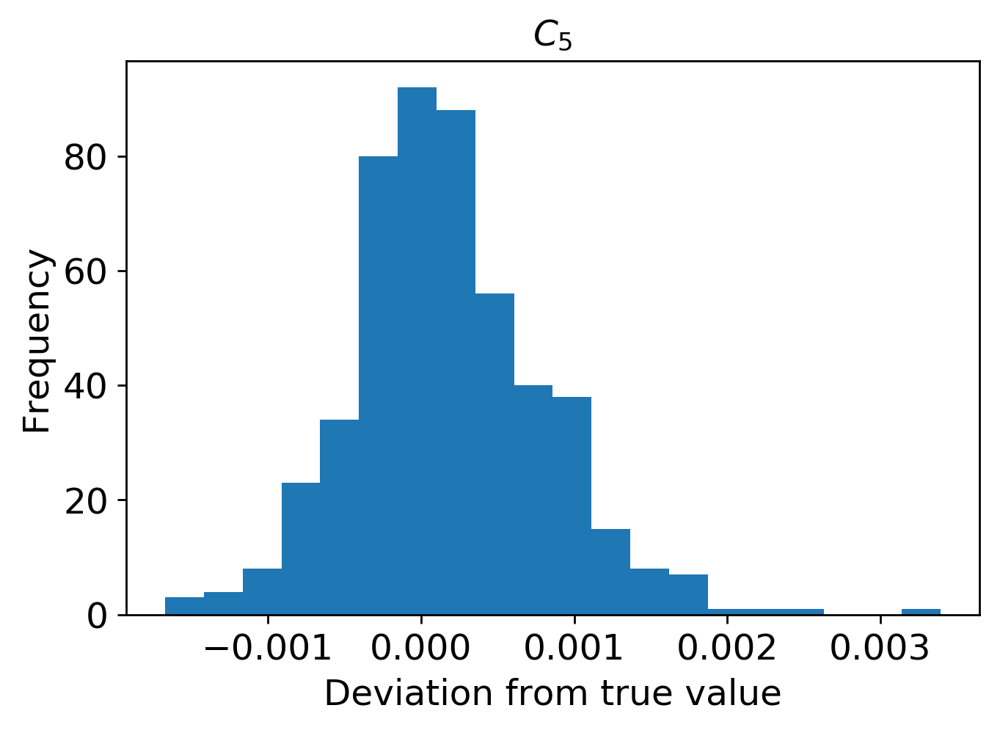

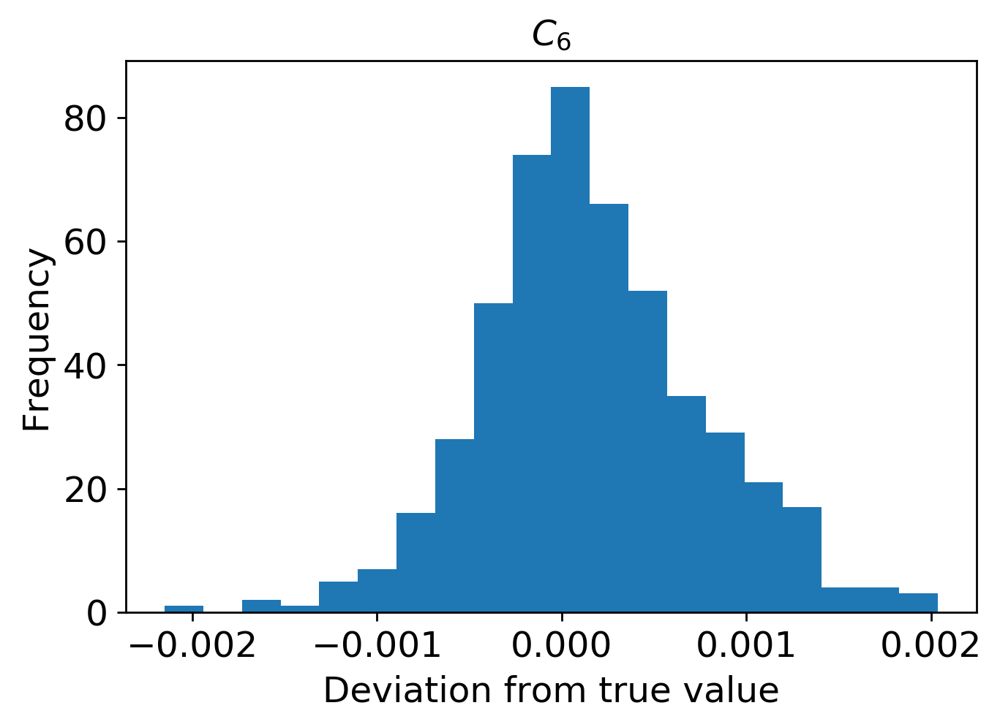

In [3]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1900/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1900/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

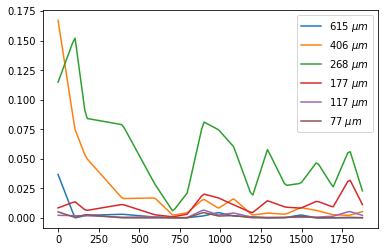

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1900/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1900/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='power',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi1900.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



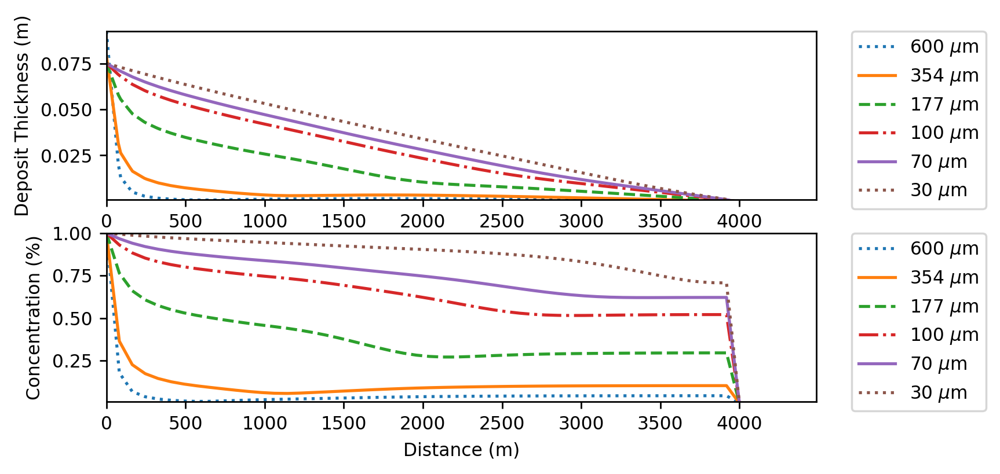

(5000, 9)
(5000, 1800)


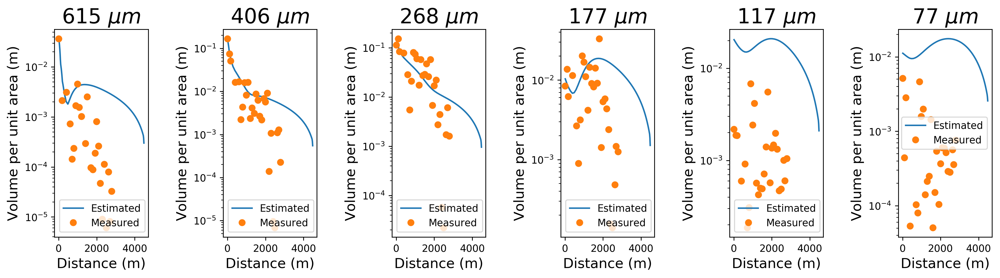

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi1900.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1900.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1900.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1900.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1900.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1900.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi1900.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi1900.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


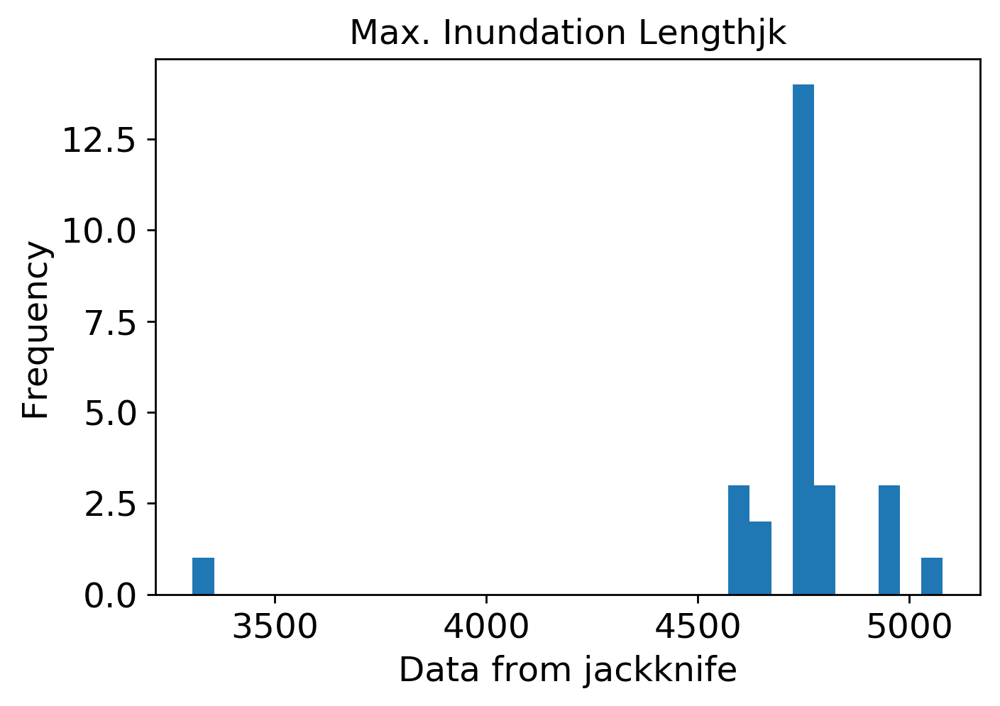

mean: 5.19654944501514
jk_e: 0.06205784375679083
CI 0.12163337376331003


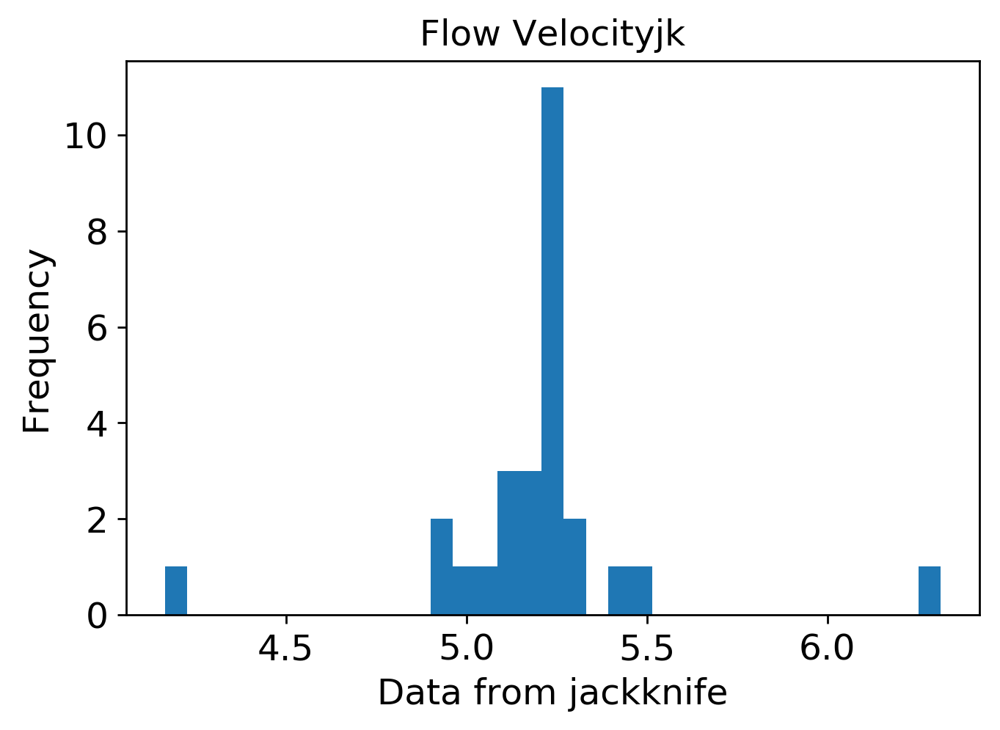

mean: 4.524469258493531
jk_e: 0.05082251778849516
CI 0.09961213486545052


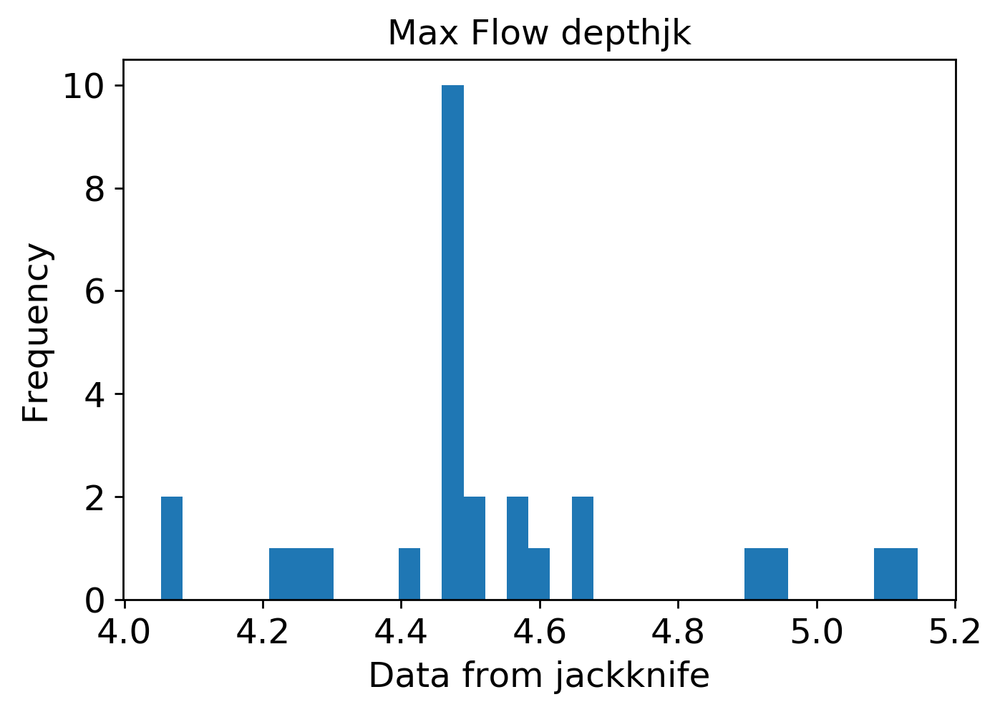

mean: 0.004963448815257737
jk_e: 0.0001679027467529808
CI 0.00032908938363584235


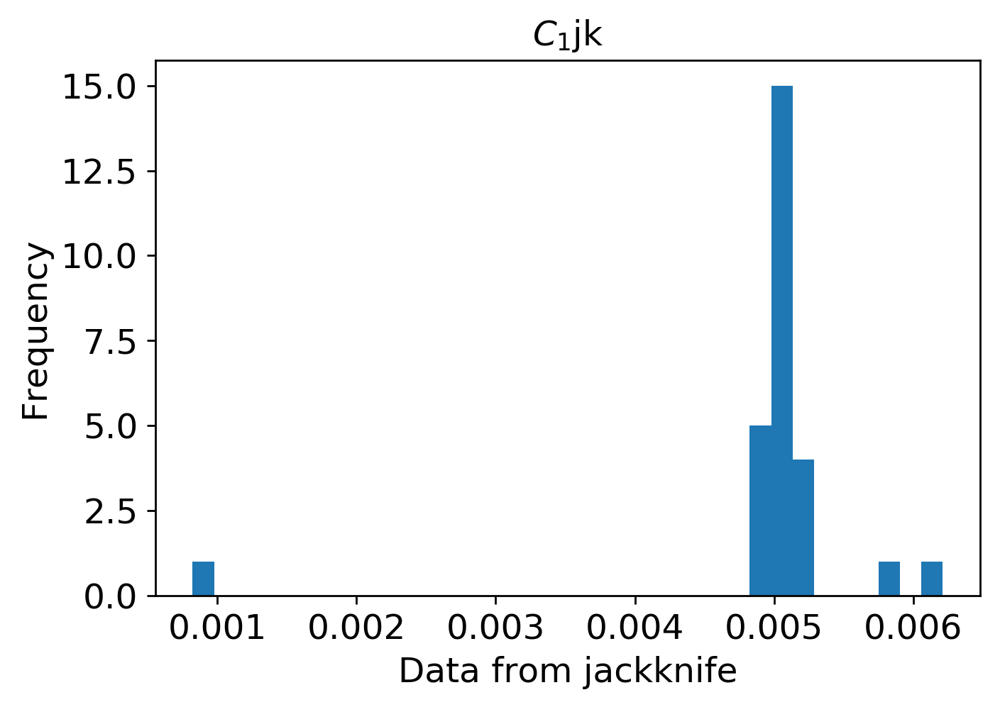

mean: 0.02147184462176091
jk_e: 0.00021389118053811835
CI 0.00041922671385471197


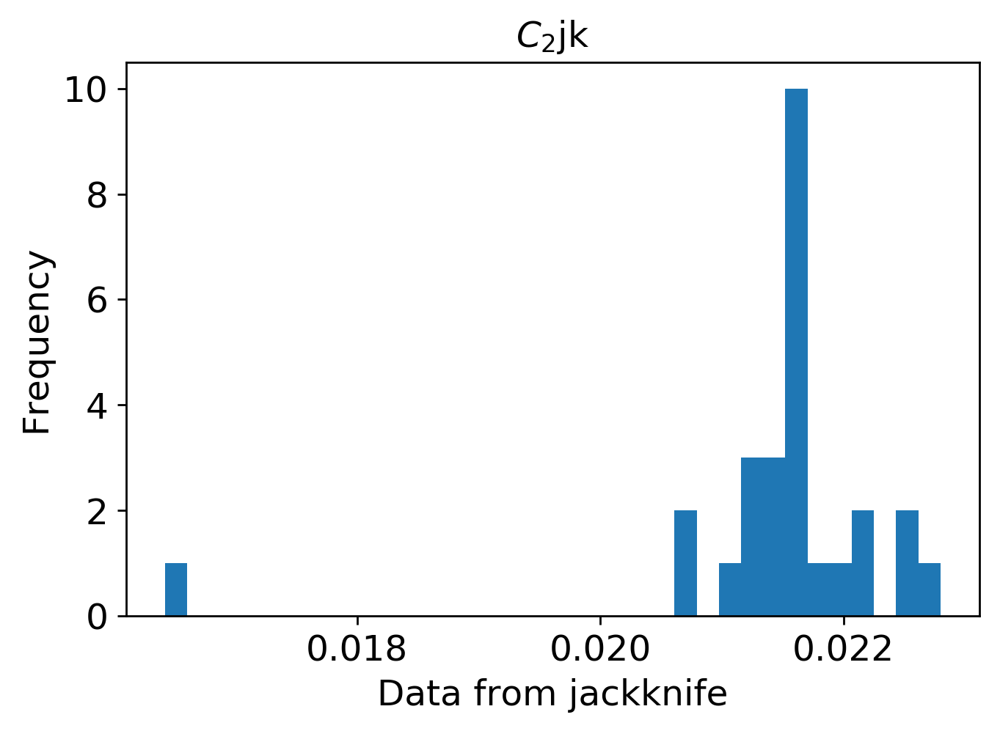

mean: 0.020240650480448704
jk_e: 0.00026812261613449247
CI 0.0005255203276236052


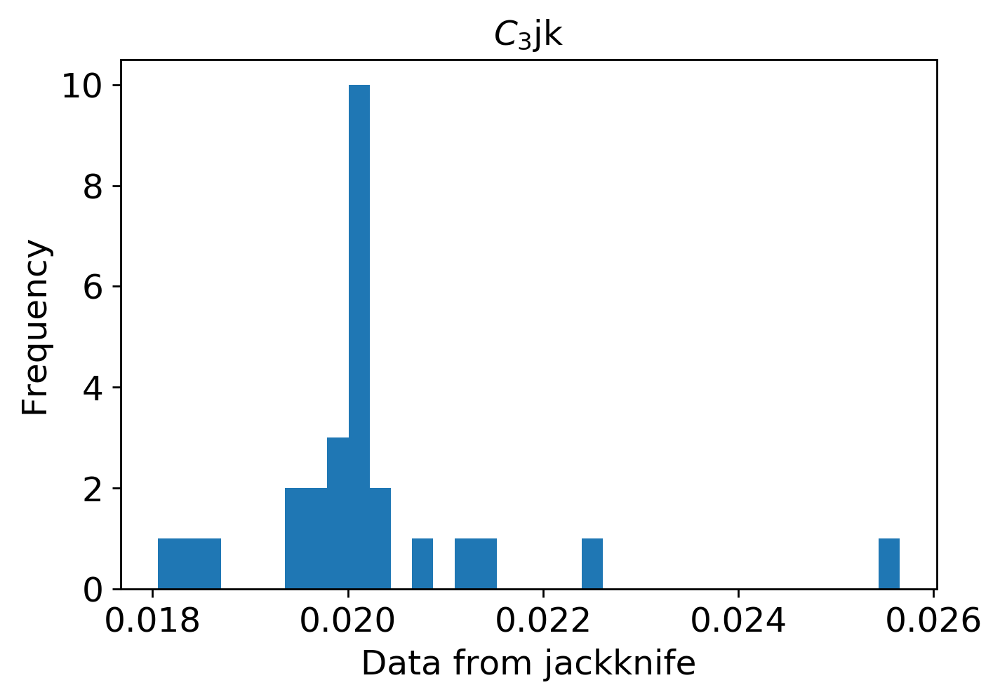

mean: 0.0015109582251181834
jk_e: 7.648883632457961e-05
CI 0.00014991811919617604


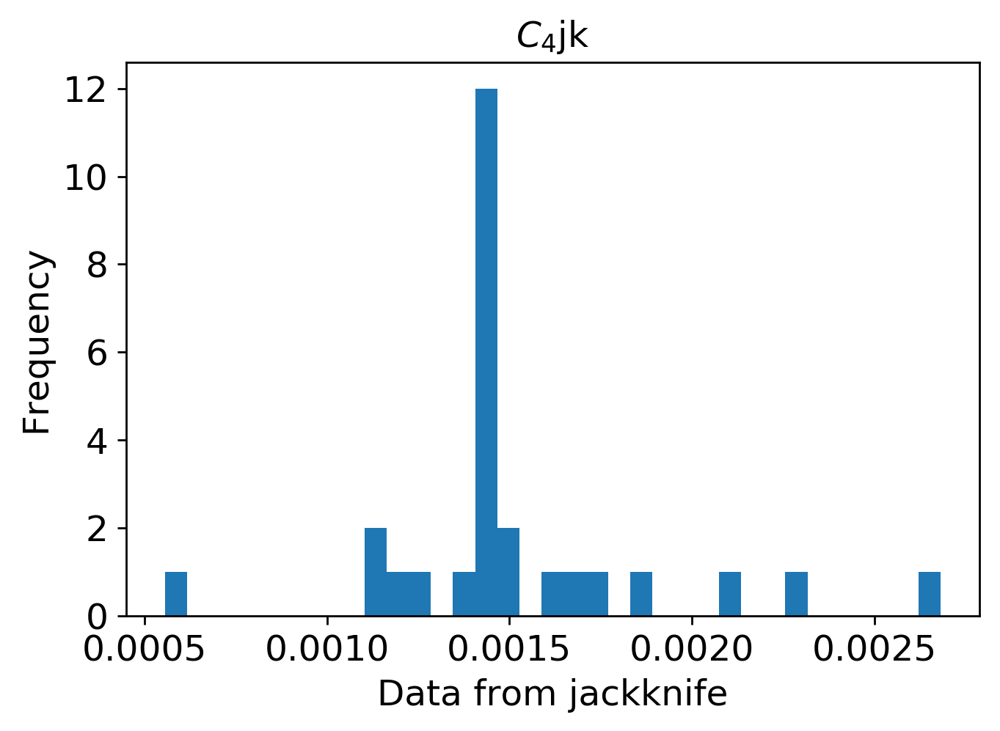

mean: 0.0027395421494118936
jk_e: 7.308211765219613e-05
CI 0.0001432409505983044


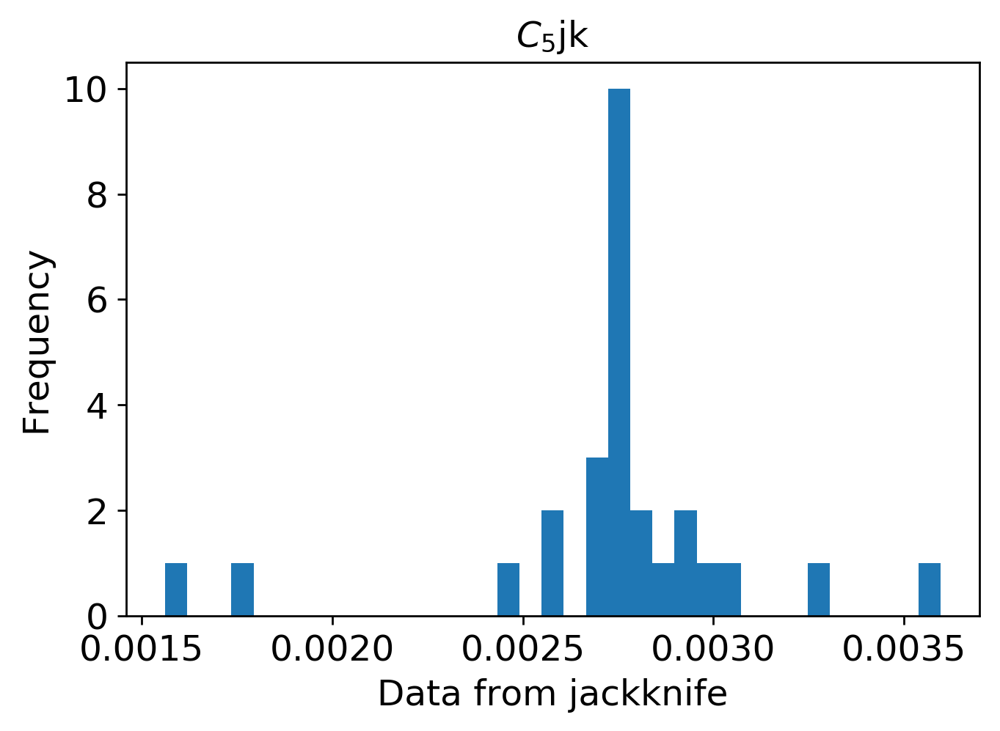

mean: 0.0015031617761447644
jk_e: 7.043999699678734e-05
CI 0.00013806239411370317


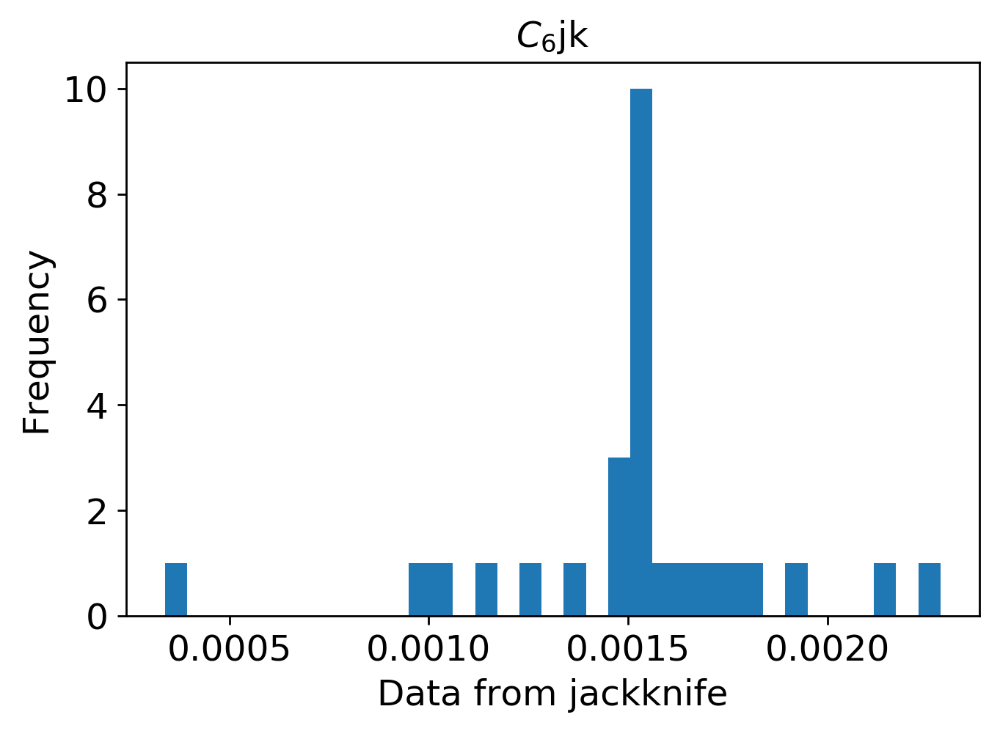

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1900/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1900/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi1900.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi1900.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi1900.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        #ci_u=mean+(1.96*jk_e)
        #ci_l=mean-(1.96*jk_e)
        CI=(1.96*jk_e)
        print("jk_e:",jk_e)
        #print("CI_u", ci_u)
        #print("CI_l",ci_l)
        print("CI",CI)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.pdf')
        plt.show()


# ROI 2500

In [7]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi2500"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=2500)
        
        
    

Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 451us/step - loss: 0.0943 - mean_squared_error: 0.0943 - val_loss: 0.0694 - val_mean_squared_error: 0.0694
Epoch 2/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0637 - mean_squared_error: 0.0637 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 3/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0546 - mean_squared_error: 0.0546 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 4/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0485 - mean_squared_error: 0.0485 - val_loss: 0.0413 - val_mean_squared_error: 0.0413
Epoch 5/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0431 - mean_squared_error: 0.0431 - val_loss: 0.0361 - val_mean_squared_error: 0.0361
Epoch 6/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0389 - mean_squared_error: 0.03

3600/3600 [==============================] - 1s 379us/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 98/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 99/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0070 - val_mean_squared_error: 0.0070
Epoch 100/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0068 - val_mean_squared_error: 0.0068
Epoch 101/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 102/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0074 - val_mean_squared_error: 0.00

3600/3600 [==============================] - 1s 384us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 194/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0052 - val_mean_squared_error: 0.0052
Epoch 195/2000
3600/3600 [==============================] - 2s 417us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 196/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 197/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 198/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0038 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 384us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 290/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 291/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 292/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 293/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 294/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0034 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 360us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 386/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 387/2000
3600/3600 [==============================] - 2s 417us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 388/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 389/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 390/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0035 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 397us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 482/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 483/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 484/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 485/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 486/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0028 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 385us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 578/2000
3600/3600 [==============================] - 1s 412us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 579/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 580/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 581/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 582/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0024 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 380us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 674/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 675/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 676/2000
3600/3600 [==============================] - 1s 405us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 677/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 678/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0023 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 383us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 770/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 771/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 772/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 773/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 774/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0021 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 369us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 866/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 867/2000
3600/3600 [==============================] - 2s 418us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 868/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 869/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 870/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 383us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 962/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 963/2000
3600/3600 [==============================] - 1s 414us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 964/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 965/2000
3600/3600 [==============================] - 1s 374us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 966/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 395us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1058/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1059/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1060/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1061/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1062/2000
3600/3600 [==============================] - 1s 397us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 366us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1106/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1107/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1108/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1109/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1110/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 390us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1154/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1155/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1156/2000
3600/3600 [==============================] - 1s 409us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1157/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1158/2000
3600/3600 [==============================] - 1s 411us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_erro

3600/3600 [==============================] - 1s 378us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1202/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1203/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1204/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1205/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1206/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 384us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1250/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1251/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1252/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1253/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1254/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 375us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1298/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1299/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1300/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1301/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1302/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 379us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1346/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1347/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1348/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1349/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1350/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_erro

3600/3600 [==============================] - 1s 381us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1394/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1395/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1396/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1397/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1398/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 378us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1442/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1443/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1444/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1445/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1446/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 389us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1490/2000
3600/3600 [==============================] - 1s 412us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1491/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1492/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1493/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1494/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 396us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1538/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1539/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1540/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1541/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1542/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 395us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1586/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1587/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1588/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1589/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1590/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 397us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1634/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1635/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1636/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1637/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1638/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 353us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1682/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1683/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1684/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1685/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1686/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 383us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1730/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1731/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1732/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1733/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1734/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 397us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1778/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1779/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1780/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1781/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1782/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 389us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1826/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1827/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1828/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1829/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1830/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 375us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1874/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1875/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1876/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1877/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1878/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 373us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1922/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1923/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1924/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1925/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1926/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 377us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1970/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1971/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1972/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1973/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1974/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_erro

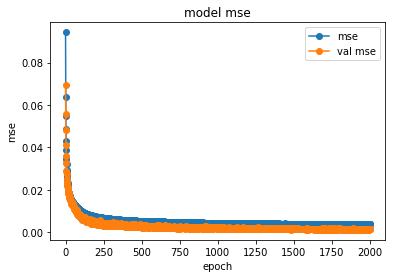

save the model


In [8]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2500/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2500/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




(500, 9)


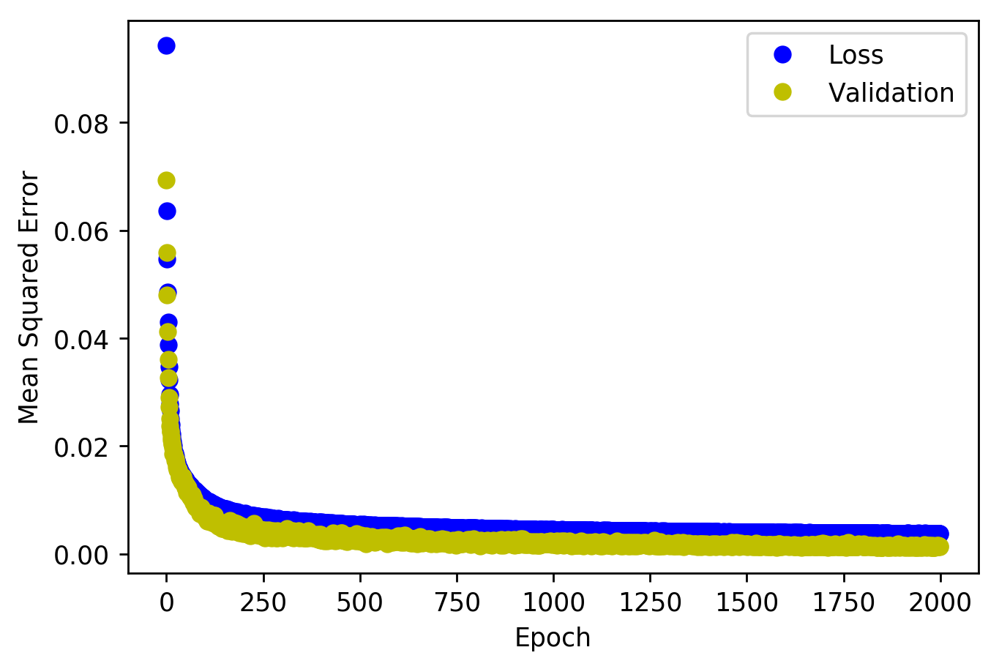

<Figure size 432x288 with 0 Axes>

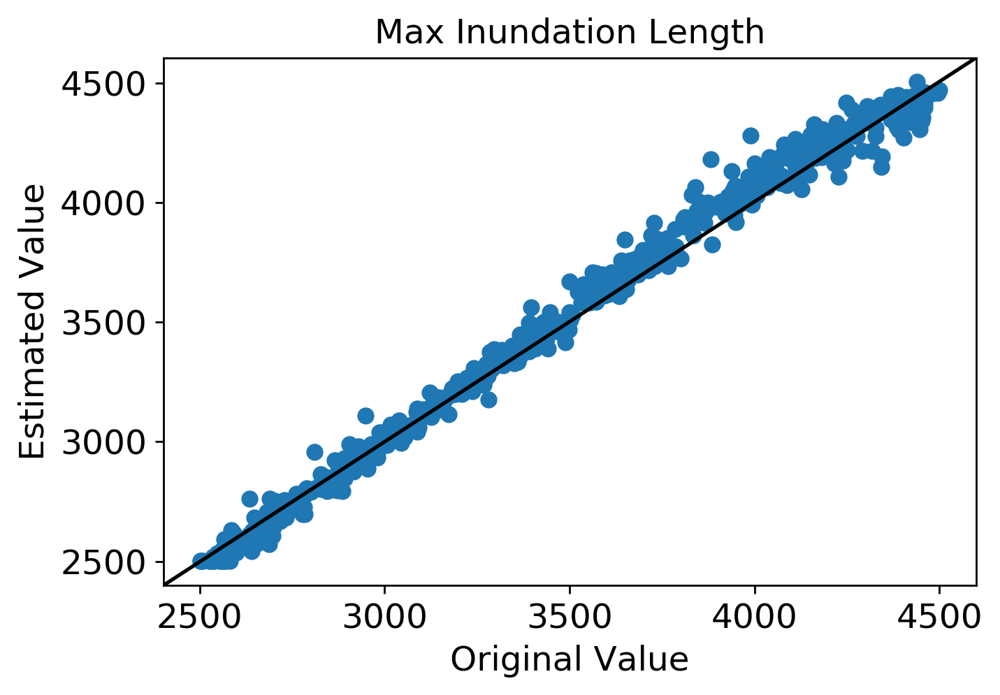

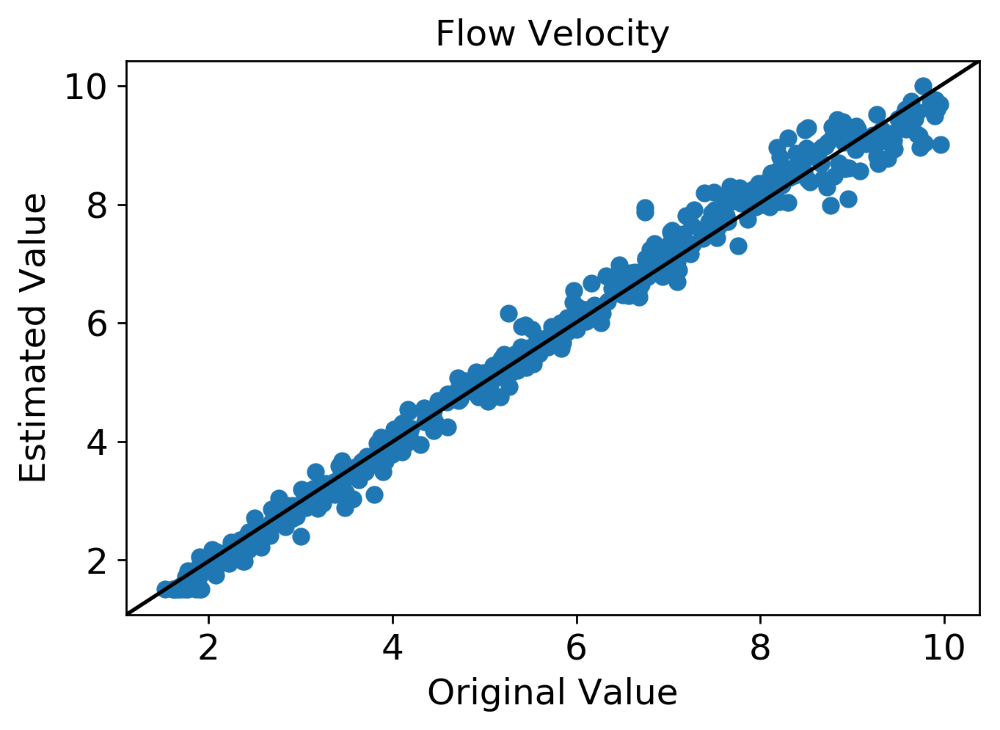

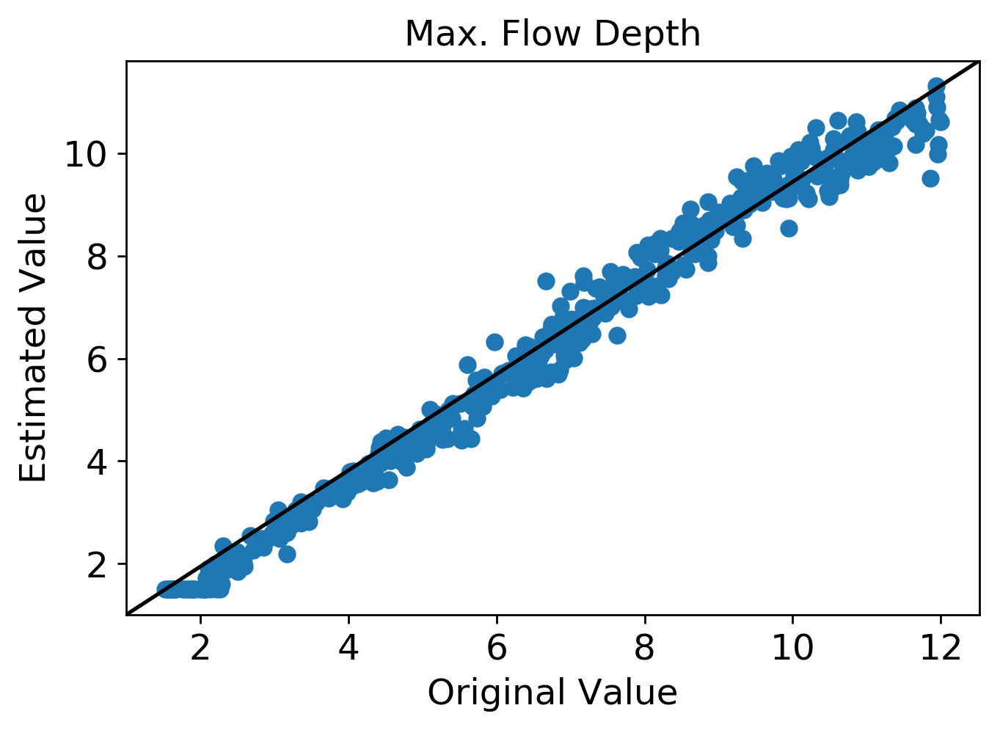

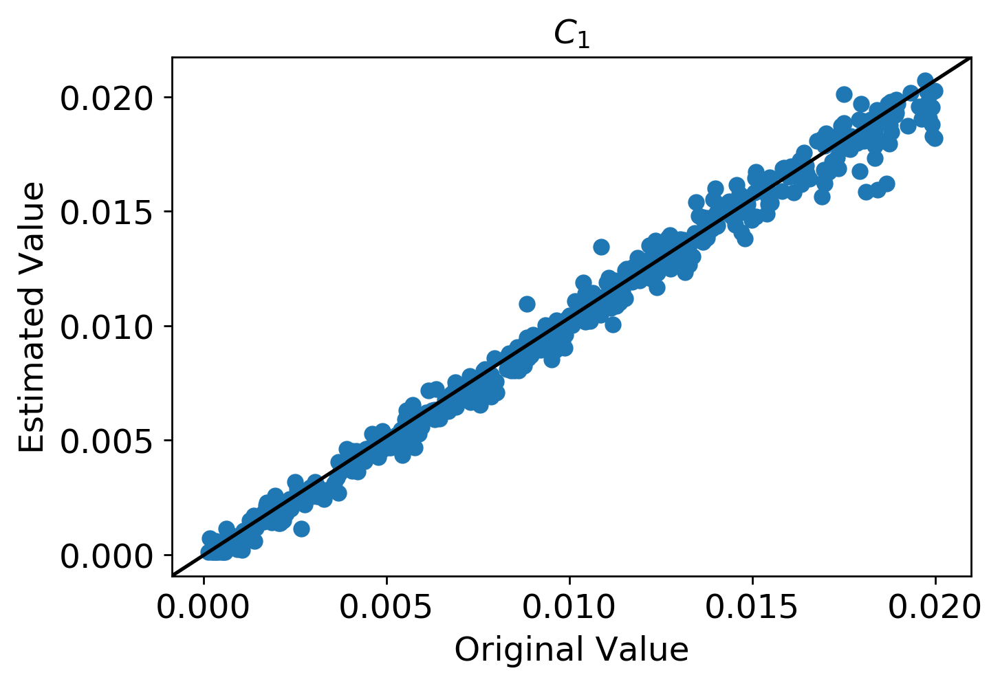

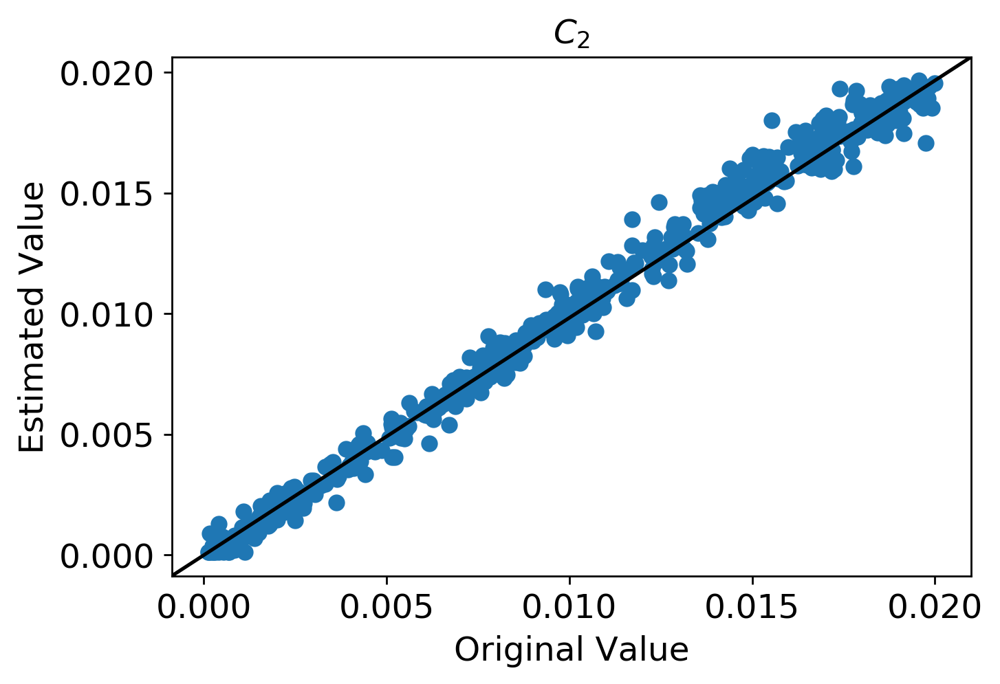

...

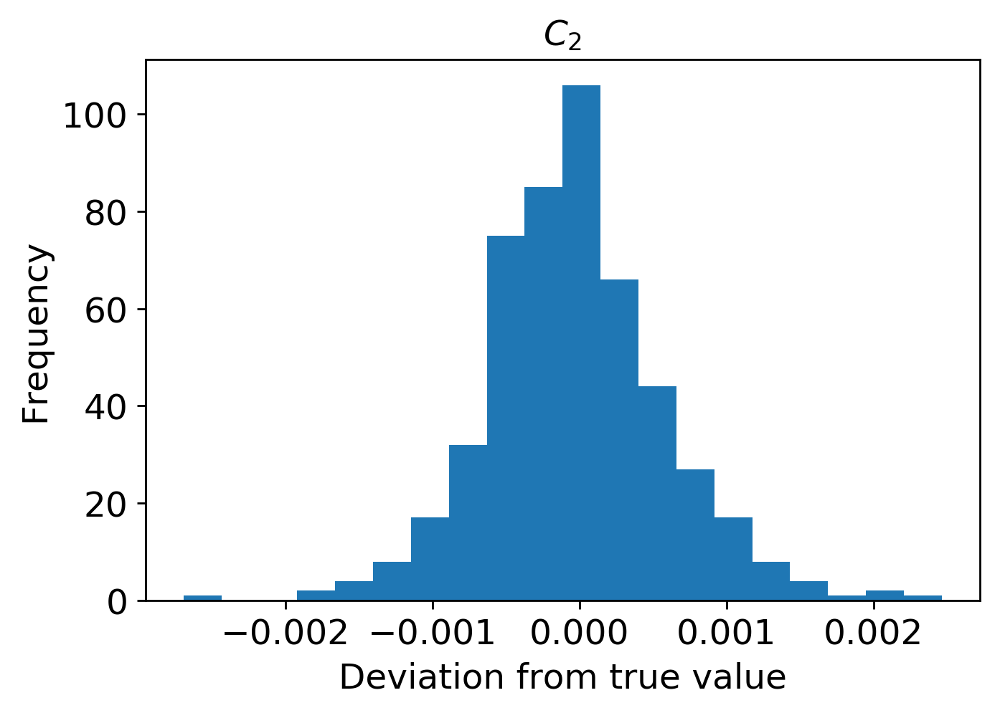

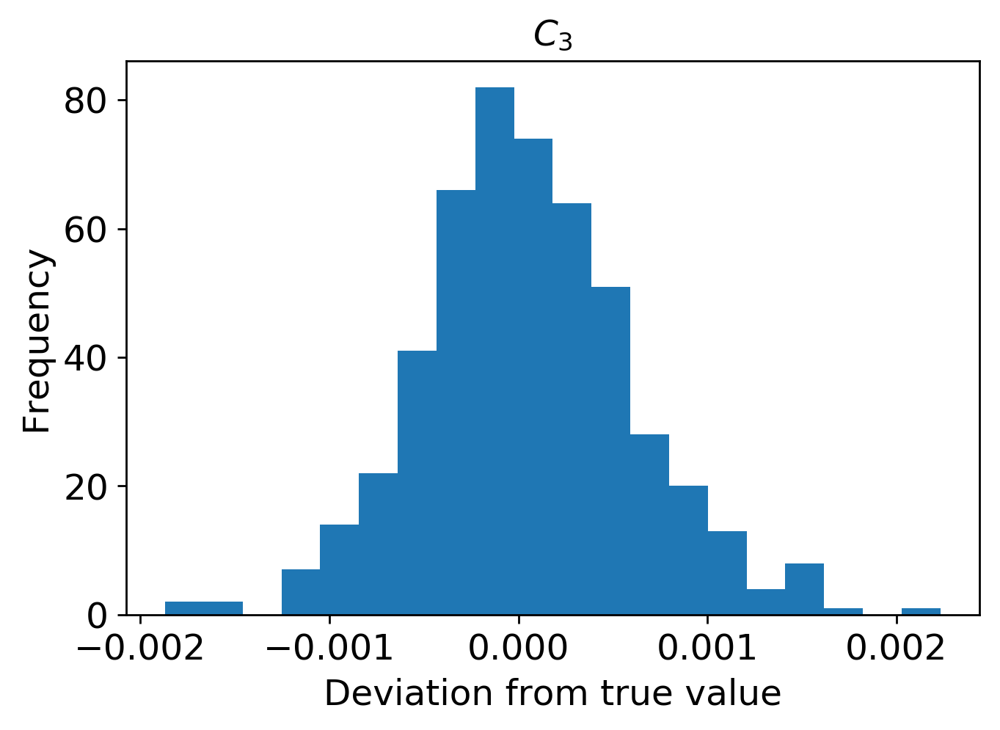

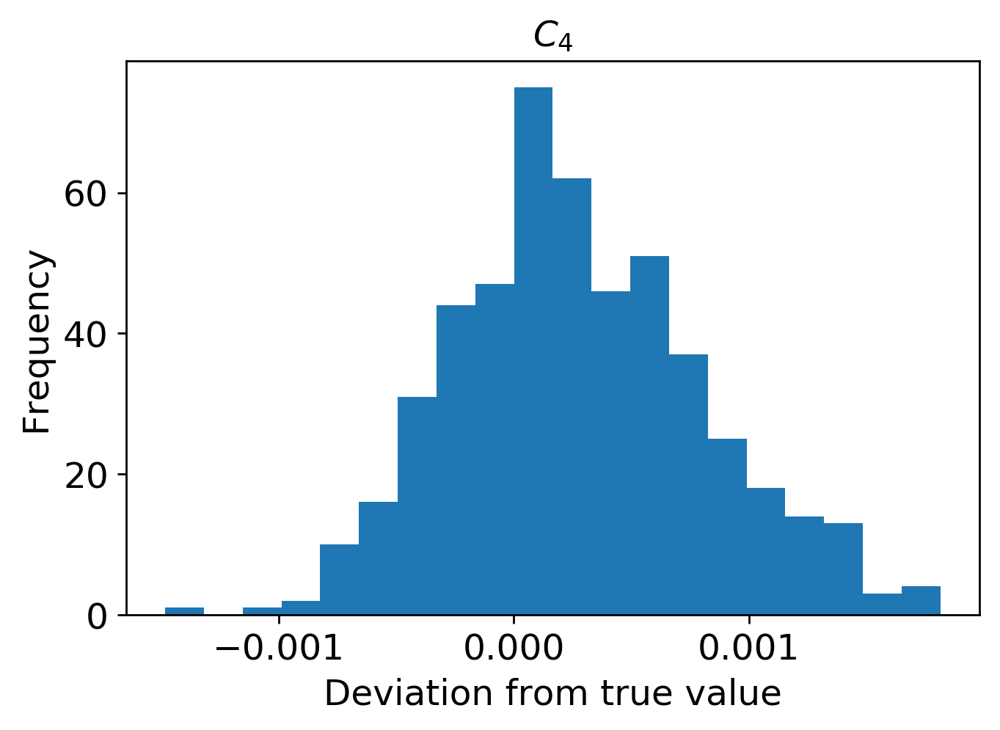

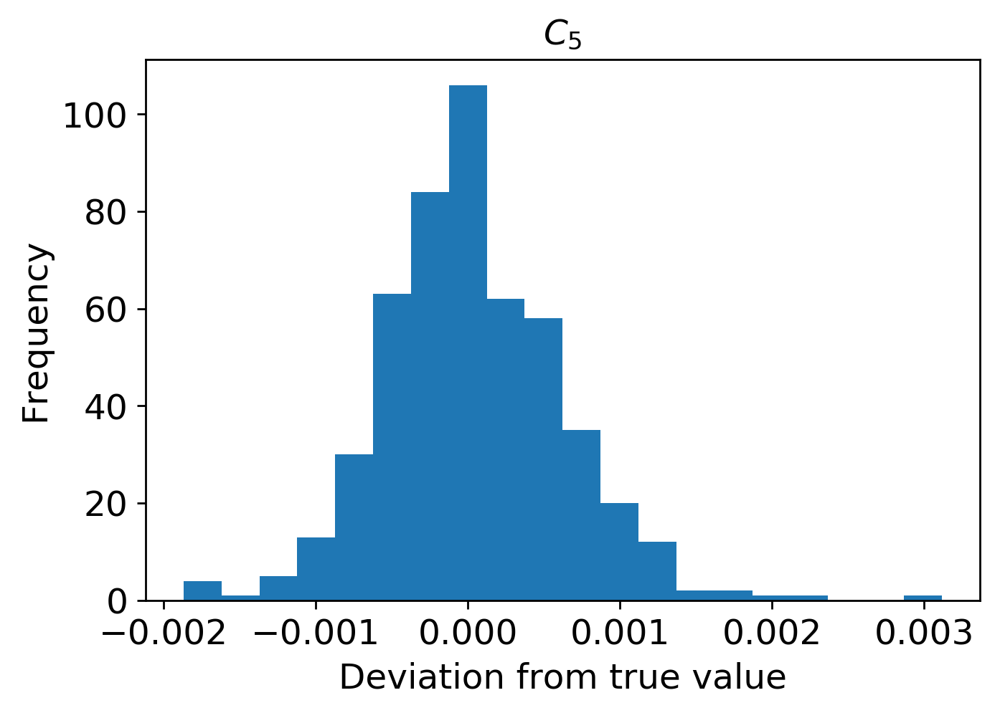

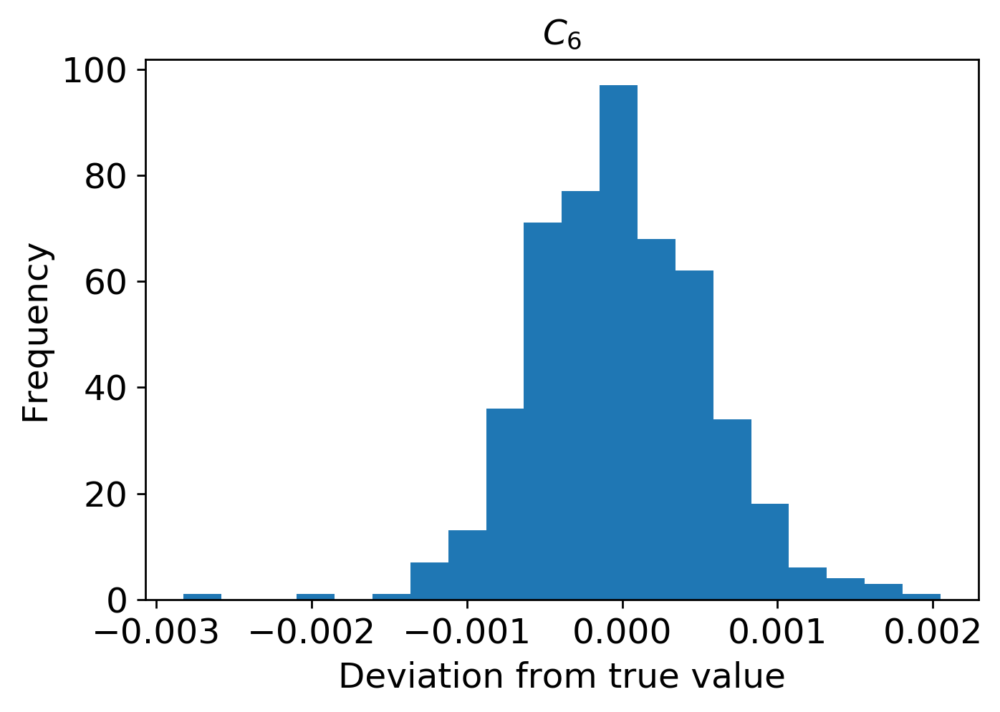

In [9]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2500/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2500/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

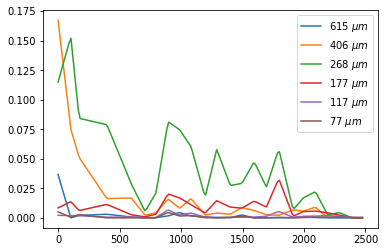

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2500/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2500/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='linear',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi2500.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



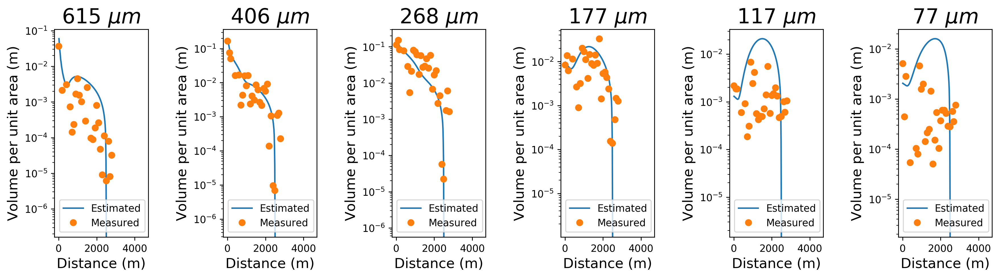

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi2500.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2500.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2500.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2500.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2500.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2500.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2500.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2500.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


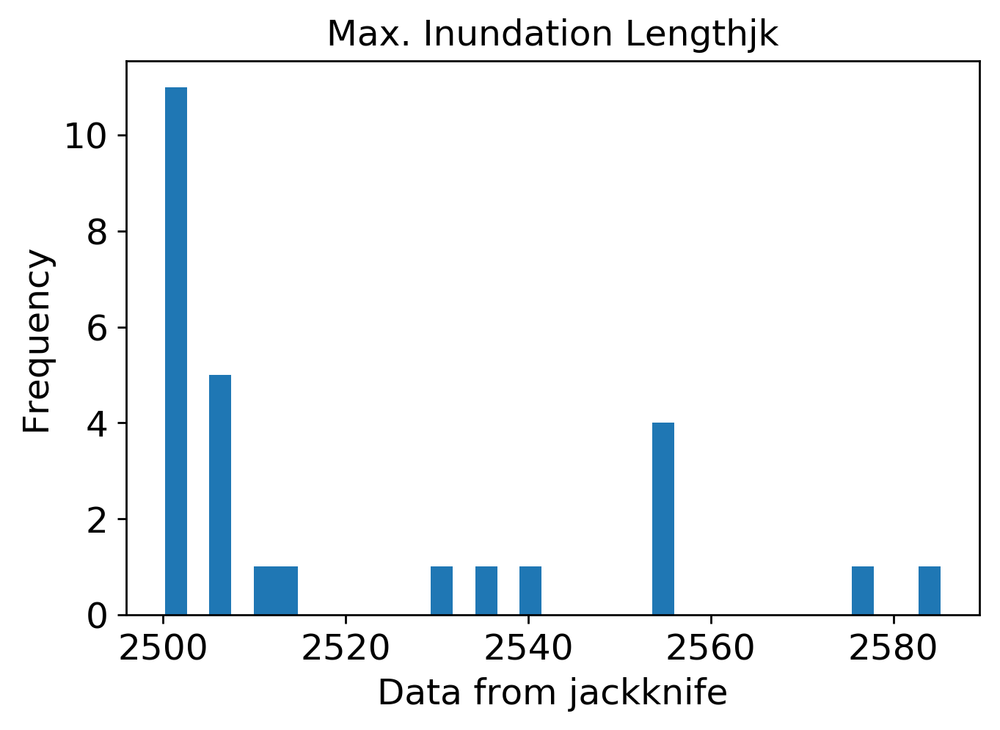

mean: 4.364468422308194
jk_e: 0.06252057900276668


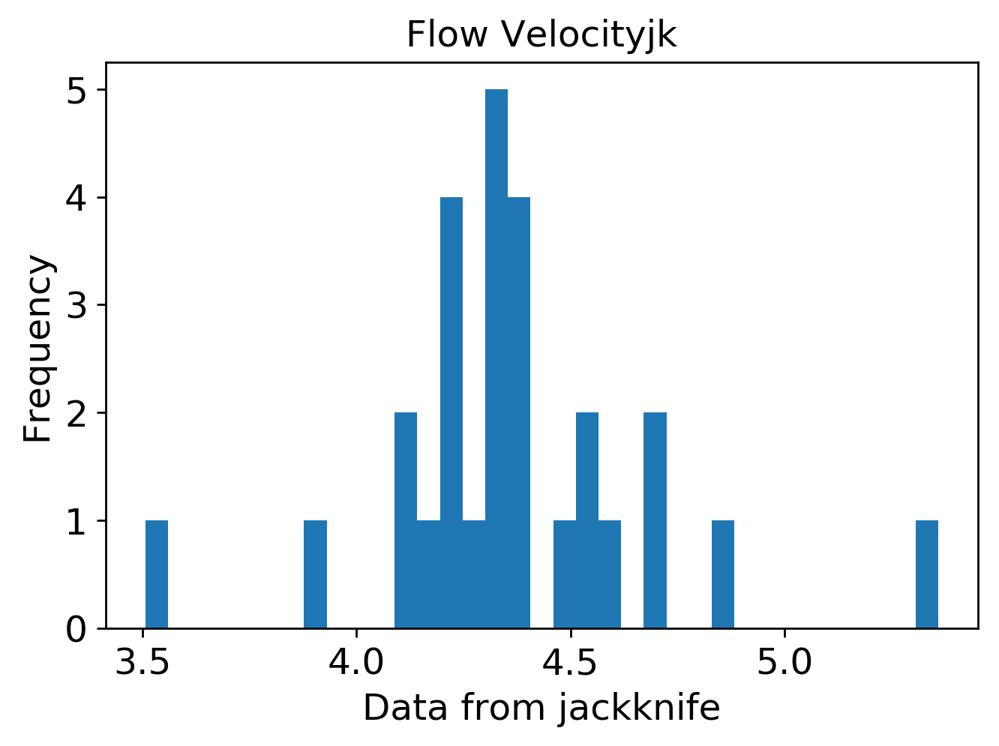

mean: 7.794800168426135
jk_e: 0.13073919236677273


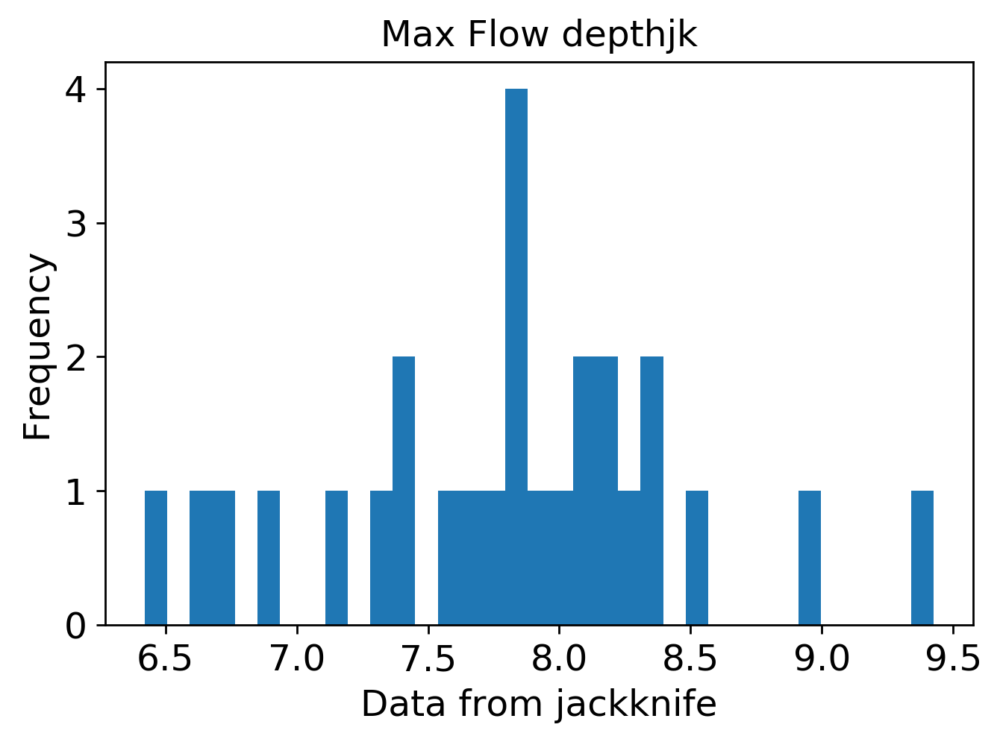

mean: 0.00525250300994161
jk_e: 0.00012450350464365936


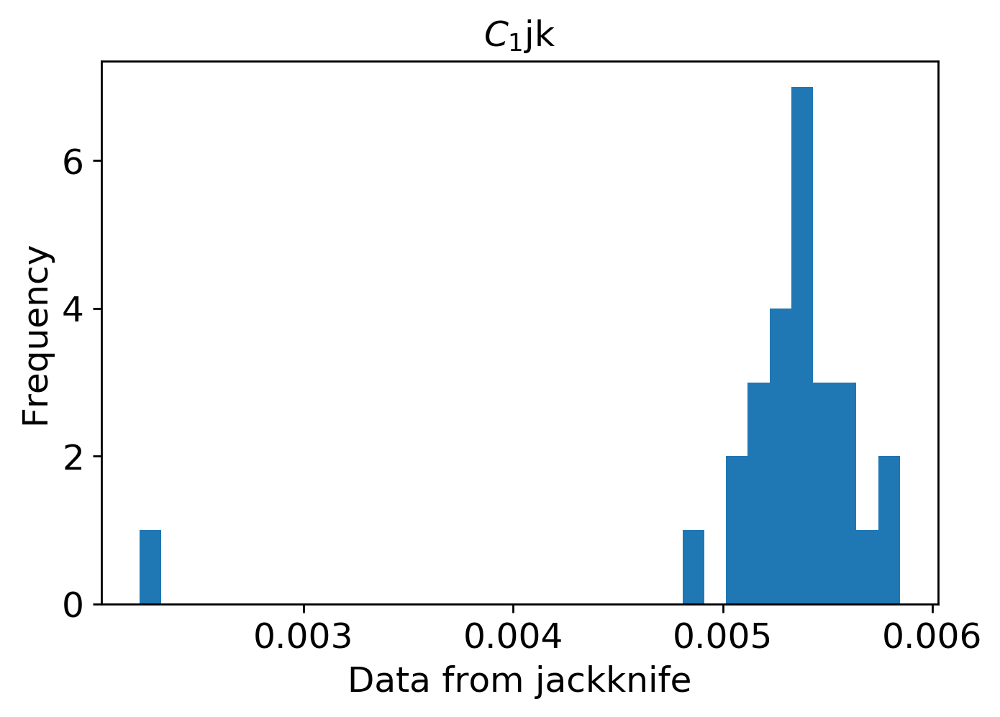

mean: 0.016458350566728633
jk_e: 0.00023461721303848137


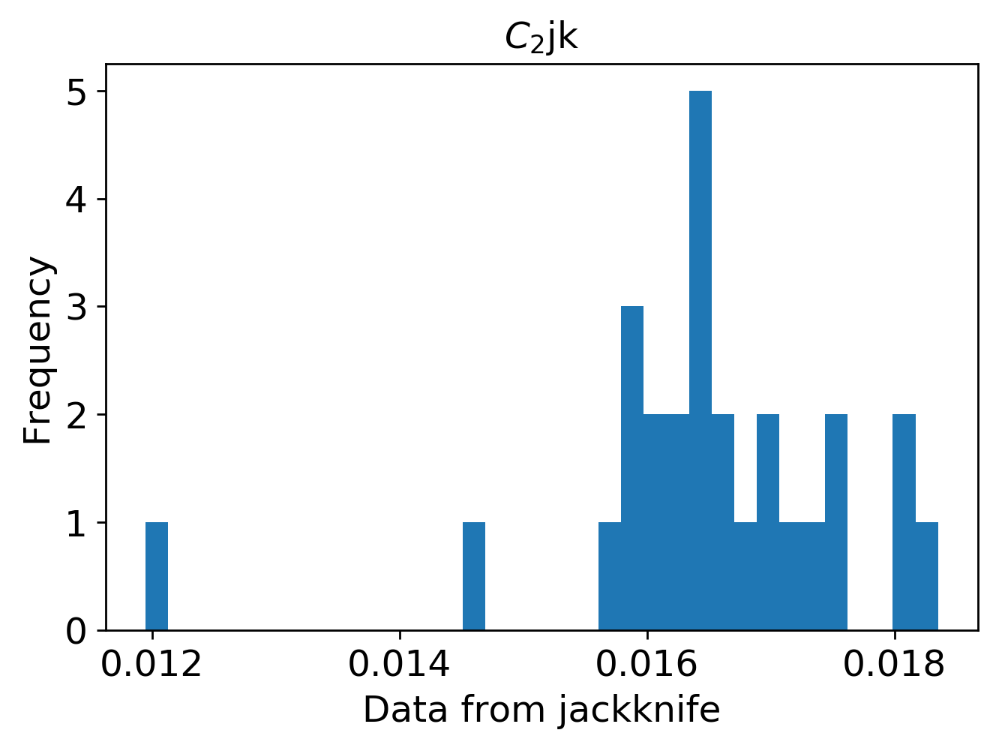

mean: 0.013752826604837294
jk_e: 0.0003204615074685057


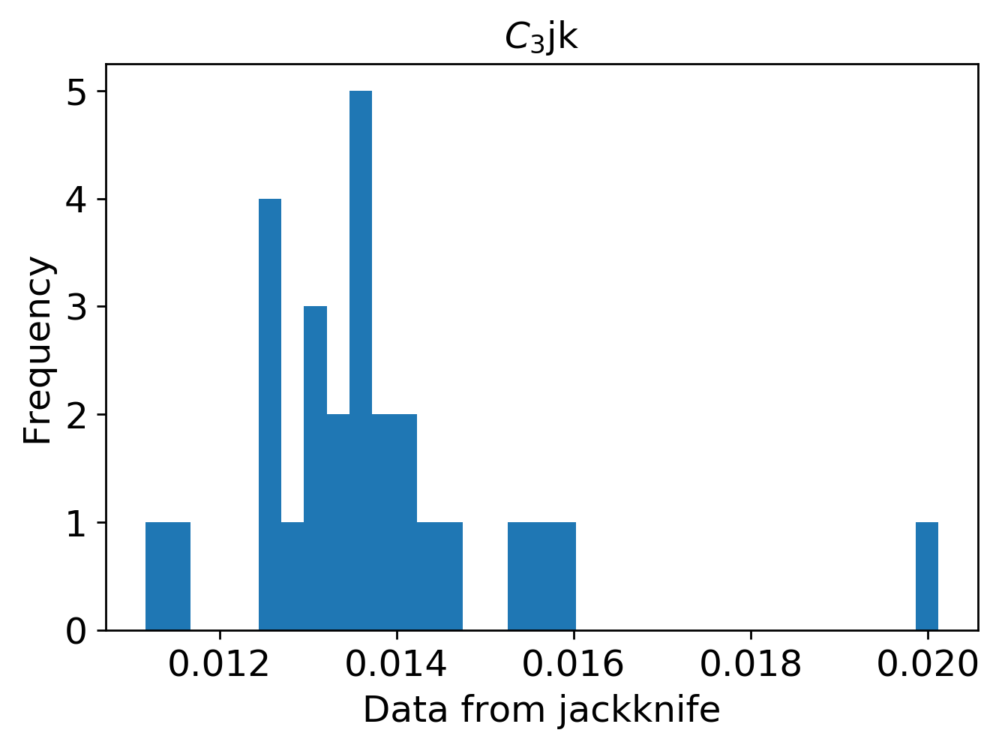

mean: 0.0007754015370712464
jk_e: 4.034026034186287e-05


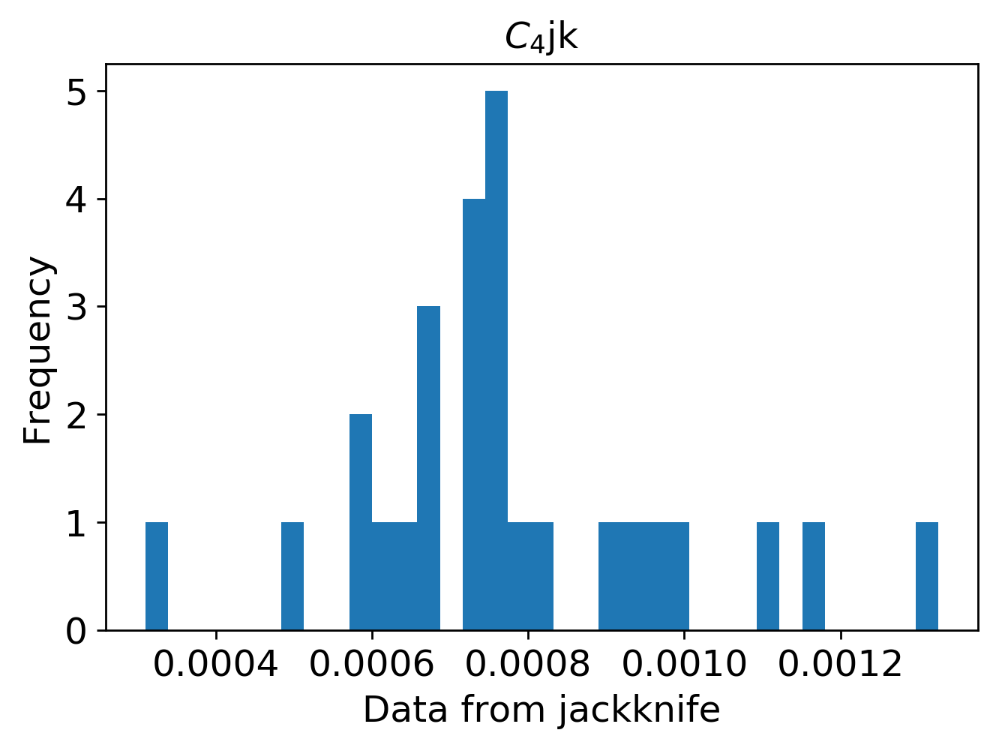

mean: 0.00012073962588989232
jk_e: 1.5123556818198196e-05


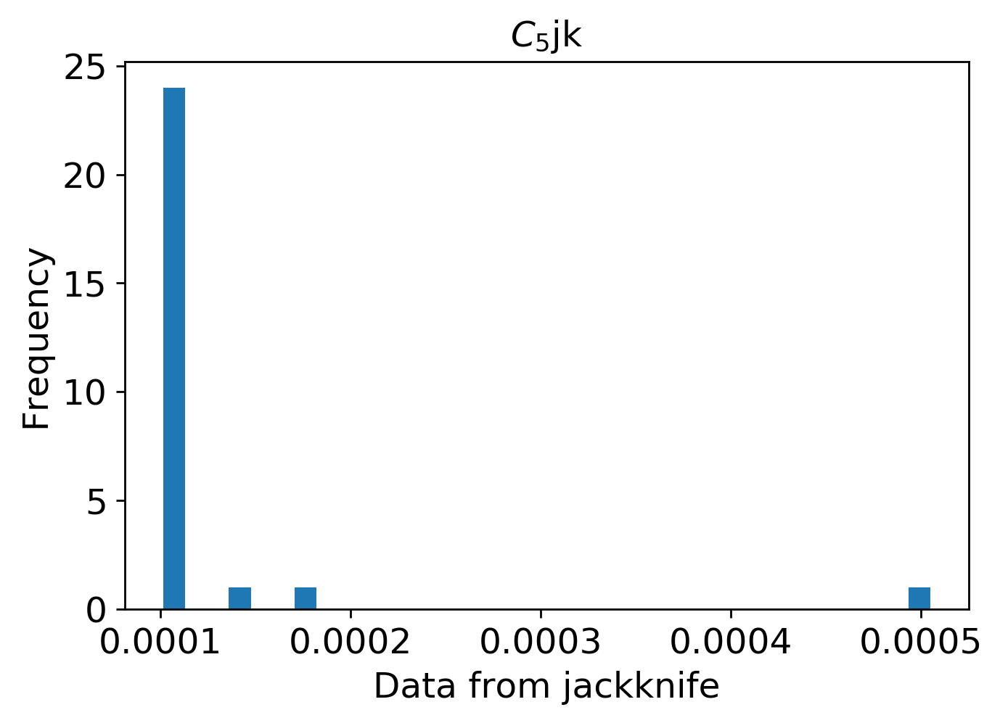

mean: 0.00018707589885471777
jk_e: 1.9084140548610926e-05


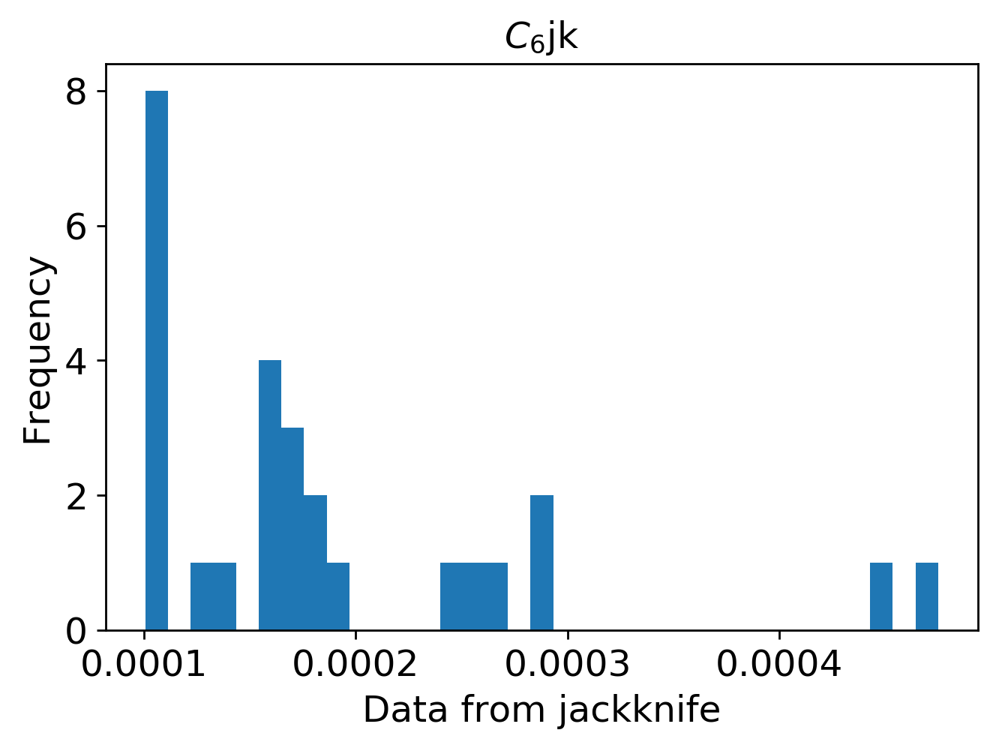

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2500/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2500/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi2500.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi2500.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi2500.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 3000

In [13]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi3000"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=3000)
        
        
    

Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 494us/step - loss: 0.0927 - mean_squared_error: 0.0927 - val_loss: 0.0710 - val_mean_squared_error: 0.0710
Epoch 2/2000
3600/3600 [==============================] - 1s 374us/step - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0570 - val_mean_squared_error: 0.0570
Epoch 3/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0558 - mean_squared_error: 0.0558 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 4/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0489 - mean_squared_error: 0.0489 - val_loss: 0.0422 - val_mean_squared_error: 0.0422
Epoch 5/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0434 - mean_squared_error: 0.0434 - val_loss: 0.0372 - val_mean_squared_error: 0.0372
Epoch 6/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0388 - mean_squared_error: 0.03

3600/3600 [==============================] - 1s 389us/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 98/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0064 - val_mean_squared_error: 0.0064
Epoch 99/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0069 - val_mean_squared_error: 0.0069
Epoch 100/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 101/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 102/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0057 - val_mean_squared_error: 0.00

3600/3600 [==============================] - 1s 382us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 194/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 195/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 196/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 197/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 198/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0042 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 388us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 290/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 291/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 292/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 293/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 294/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0036 - val_mean_squared_error: 0.

Epoch 385/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 386/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 387/2000
3600/3600 [==============================] - 2s 420us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 388/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 389/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 390/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0033 - val_mean_sq

3600/3600 [==============================] - 1s 396us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 482/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 483/2000
3600/3600 [==============================] - 1s 414us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 484/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 485/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 486/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0023 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 375us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 578/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 579/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 580/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 581/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 582/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0023 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 364us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 674/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 675/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 676/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 677/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 678/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 372us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 770/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 771/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 772/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 773/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 774/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 396us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 866/2000
3600/3600 [==============================] - 2s 423us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 867/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 868/2000
3600/3600 [==============================] - 1s 413us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 869/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 870/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0017 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 394us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 962/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 963/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 964/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 965/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 966/2000
3600/3600 [==============================] - 1s 405us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 386us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1058/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1059/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1060/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1061/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1062/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_erro

3600/3600 [==============================] - 1s 387us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1106/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1107/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1108/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1109/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1110/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_erro

3600/3600 [==============================] - 1s 369us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1154/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1155/2000
3600/3600 [==============================] - 1s 404us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1156/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1157/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1158/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 396us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1202/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1203/2000
3600/3600 [==============================] - 1s 405us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1204/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1205/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1206/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 400us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1250/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1251/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1252/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1253/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1254/2000
3600/3600 [==============================] - 2s 425us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 385us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1298/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1299/2000
3600/3600 [==============================] - 1s 414us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1300/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1301/2000
3600/3600 [==============================] - 2s 419us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1302/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 397us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1346/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1347/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1348/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1349/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1350/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 383us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1394/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1395/2000
3600/3600 [==============================] - 1s 415us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1396/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1397/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1398/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 375us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1442/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1443/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1444/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1445/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1446/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 363us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1490/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1491/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1492/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1493/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1494/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 408us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1538/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1539/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1540/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1541/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1542/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 394us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1586/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1587/2000
3600/3600 [==============================] - 1s 397us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1588/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1589/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1590/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 373us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1634/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1635/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1636/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1637/2000
3600/3600 [==============================] - 1s 413us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1638/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 386us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1682/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1683/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1684/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1685/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1686/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 371us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1730/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1731/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1732/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1733/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1734/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 373us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1778/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1779/2000
3600/3600 [==============================] - 1s 397us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1780/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1781/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1782/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 381us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1826/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1827/2000
3600/3600 [==============================] - 1s 412us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1828/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1829/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1830/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 384us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1874/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1875/2000
3600/3600 [==============================] - 1s 397us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1876/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 1877/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1878/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 392us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1922/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1923/2000
3600/3600 [==============================] - 1s 374us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1924/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1925/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1926/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 391us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1970/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1971/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1972/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1973/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1974/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_erro

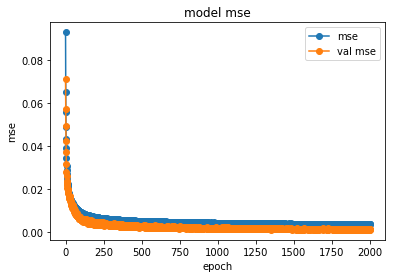

save the model


In [14]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi3000/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi3000/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




(500, 9)


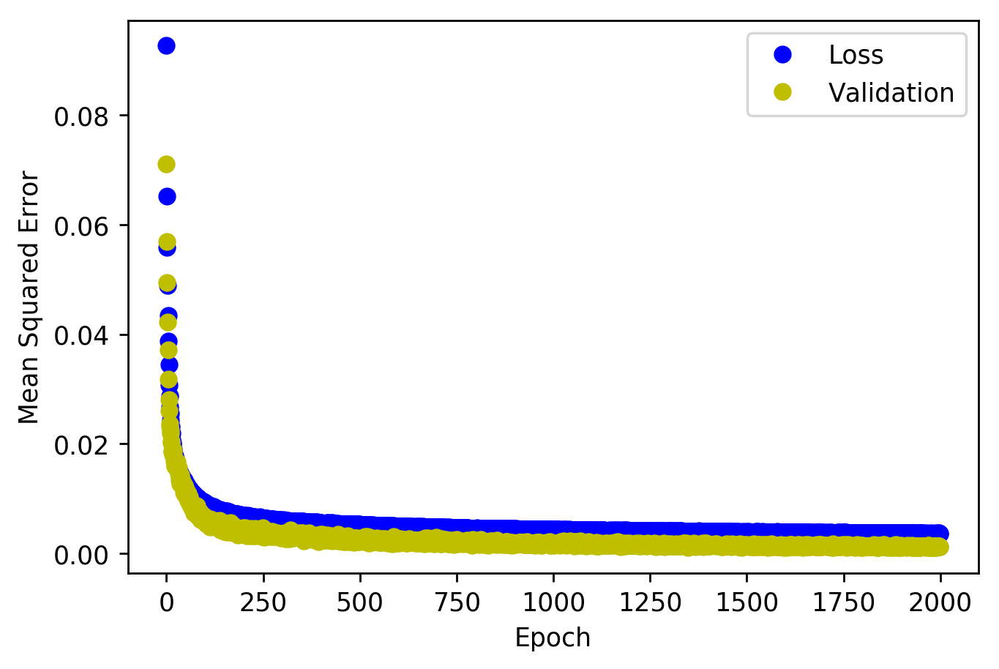

<Figure size 432x288 with 0 Axes>

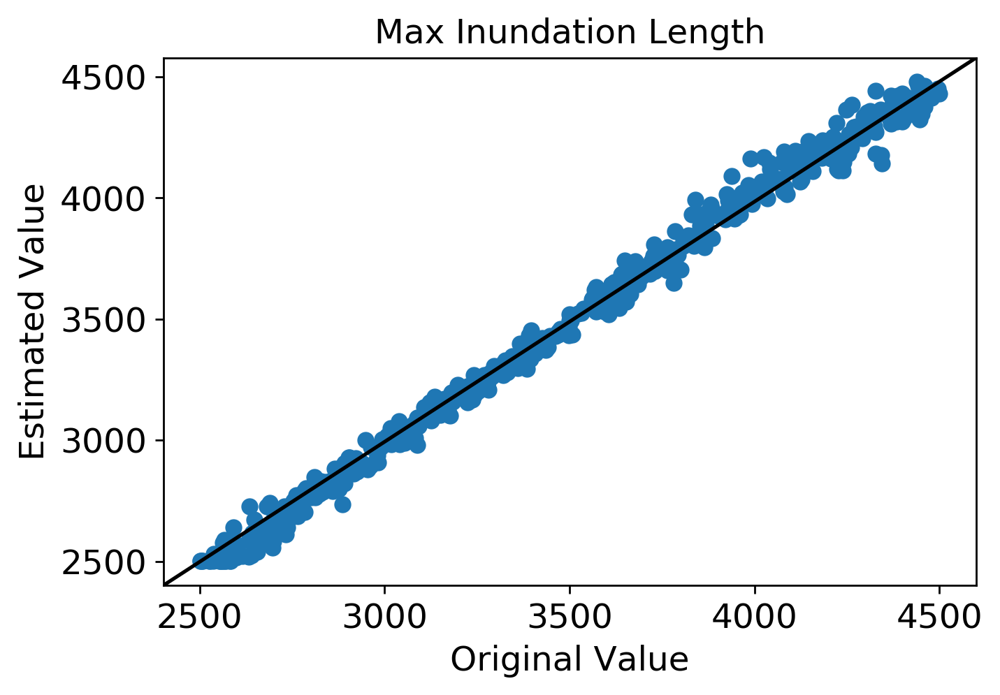

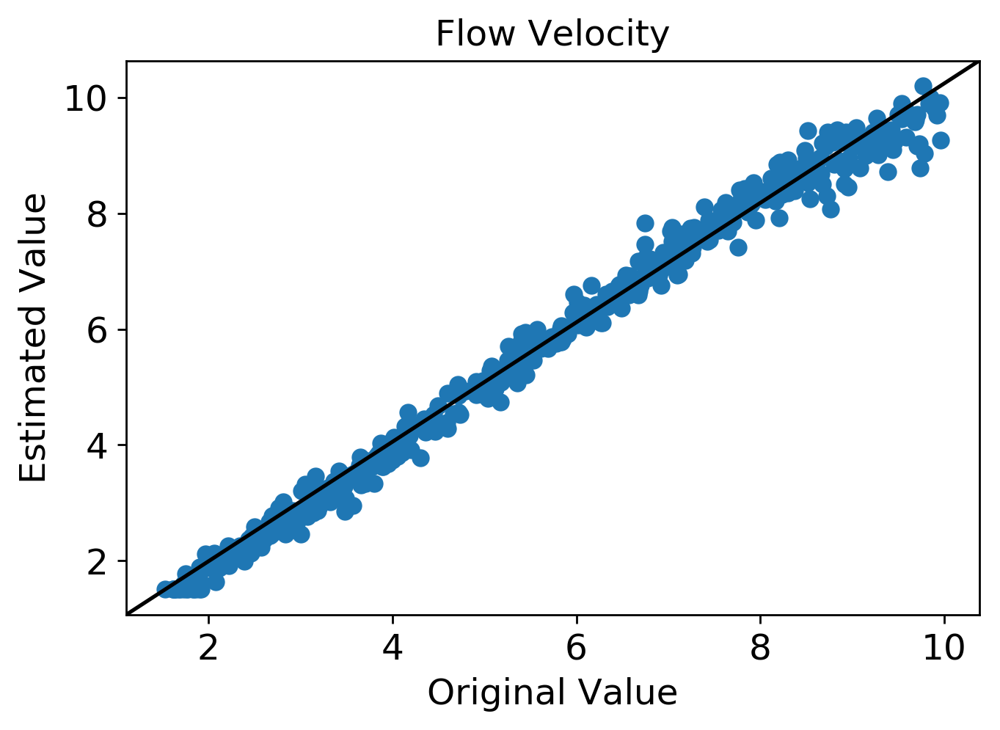

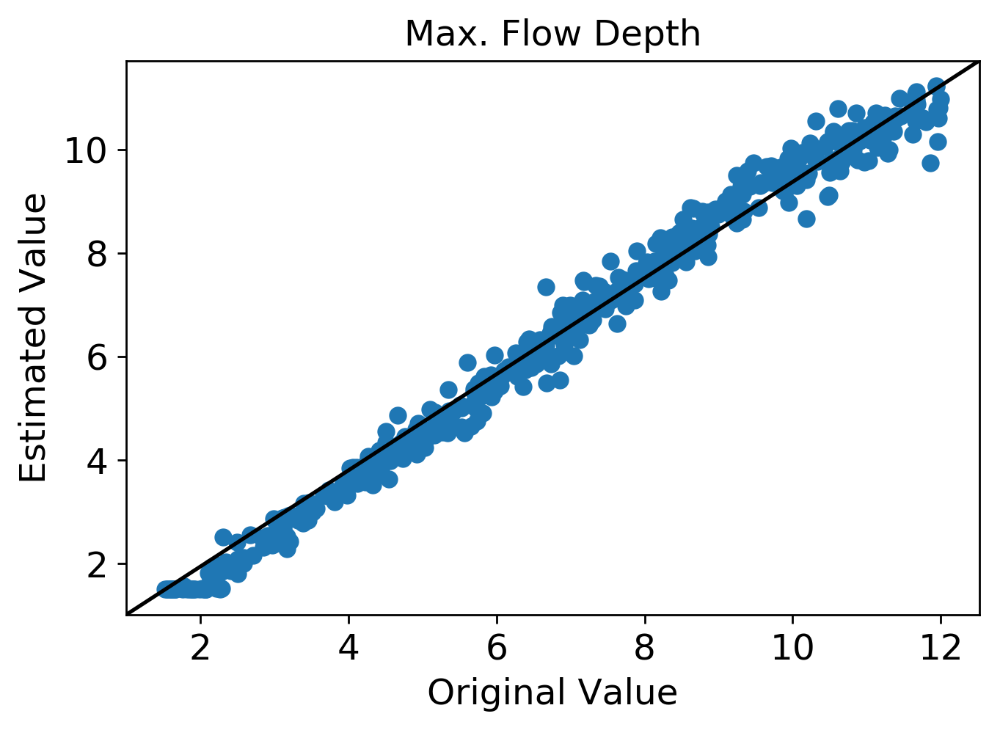

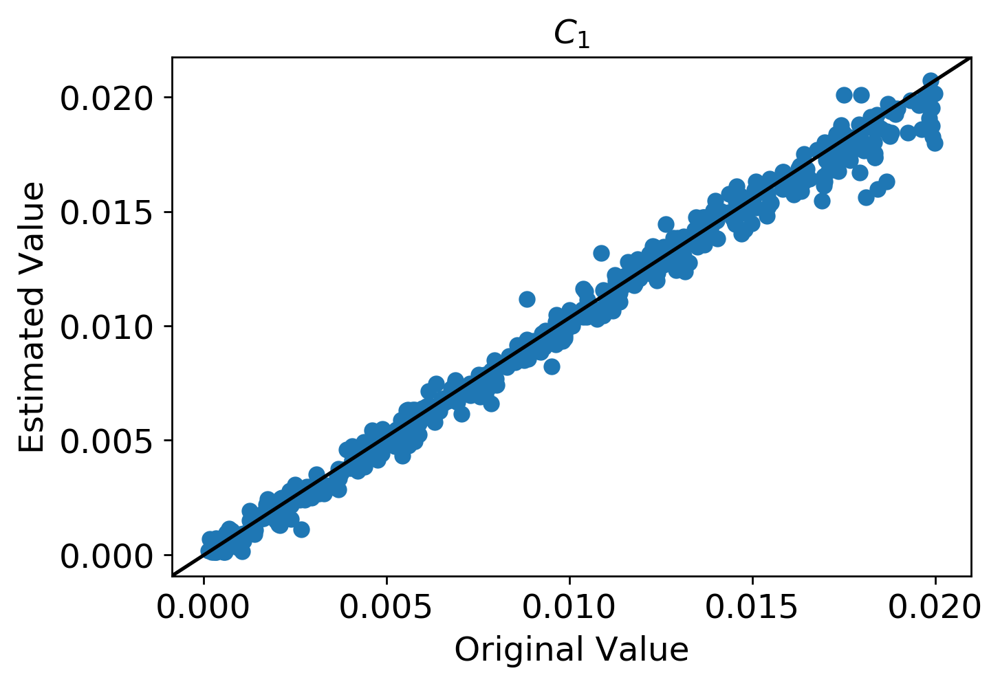

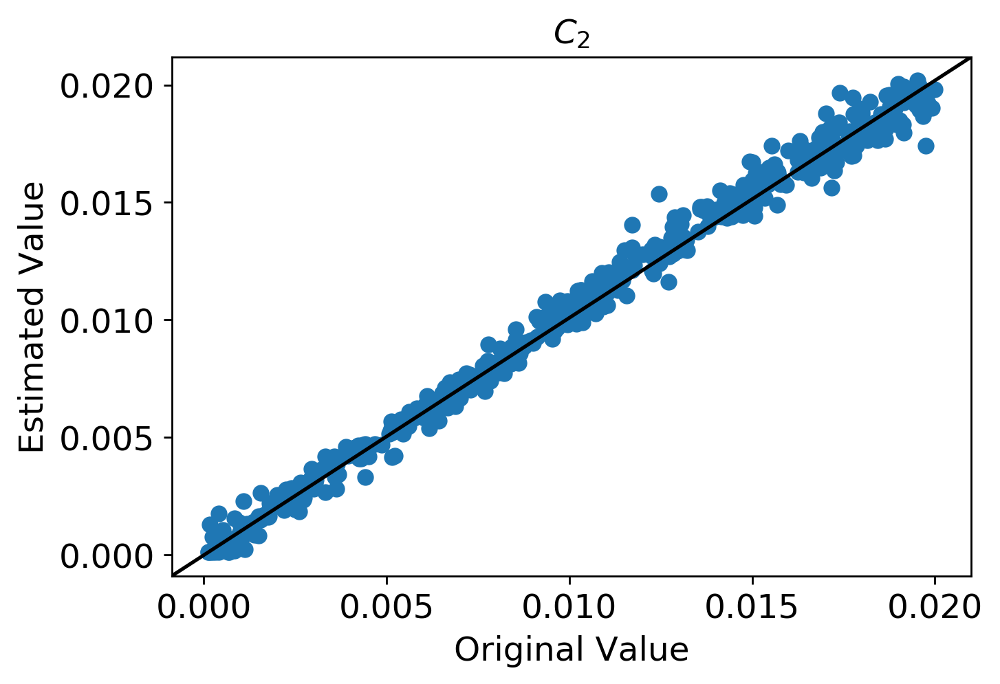

...

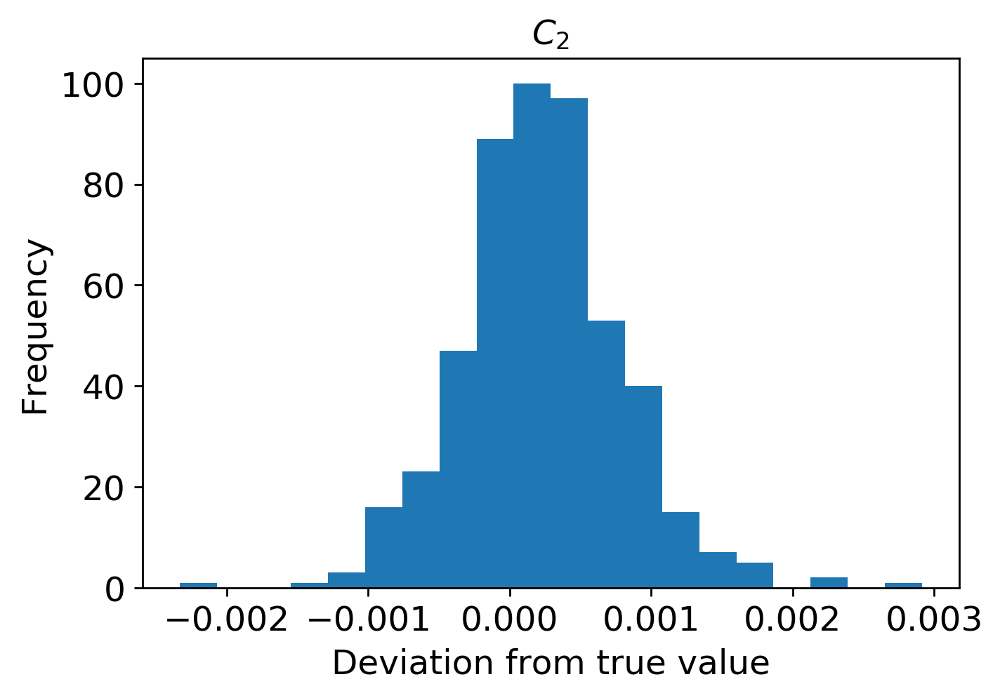

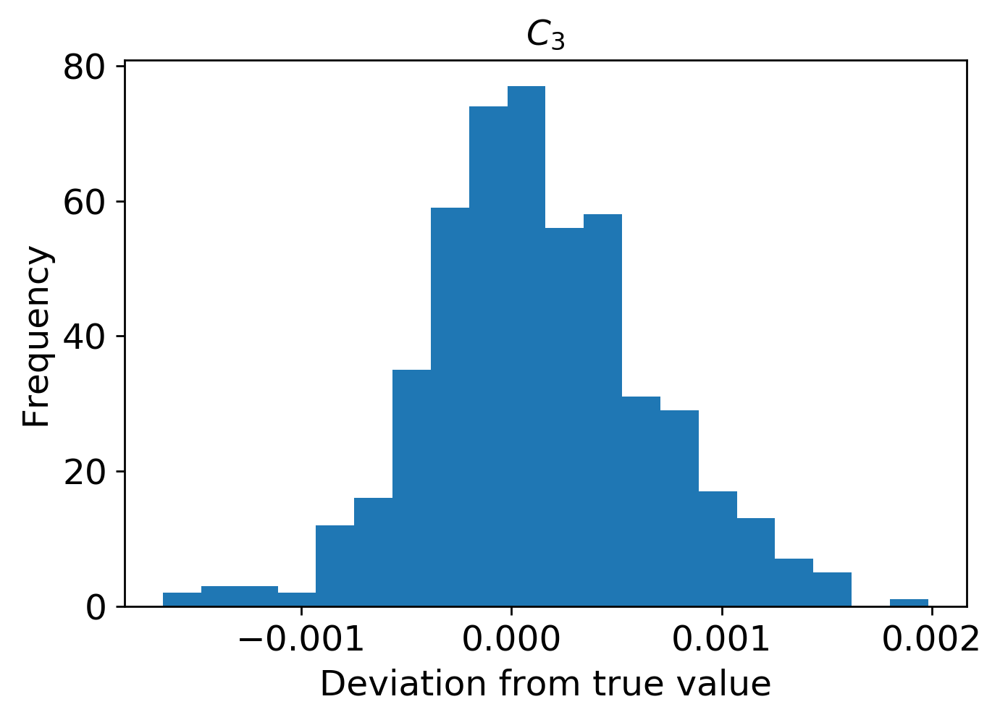

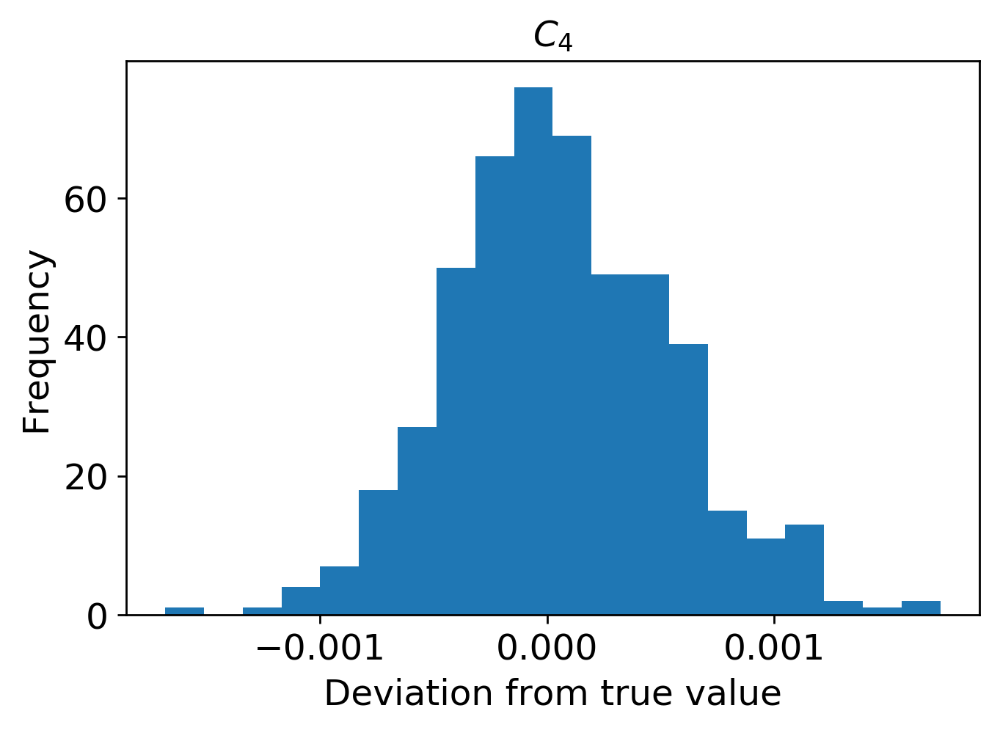

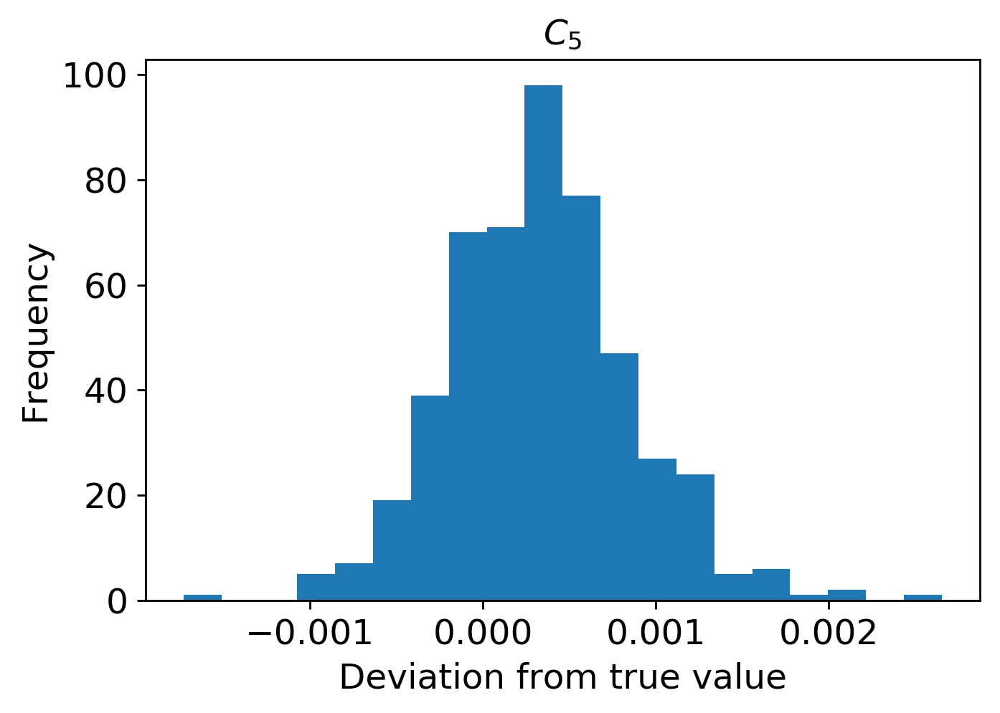

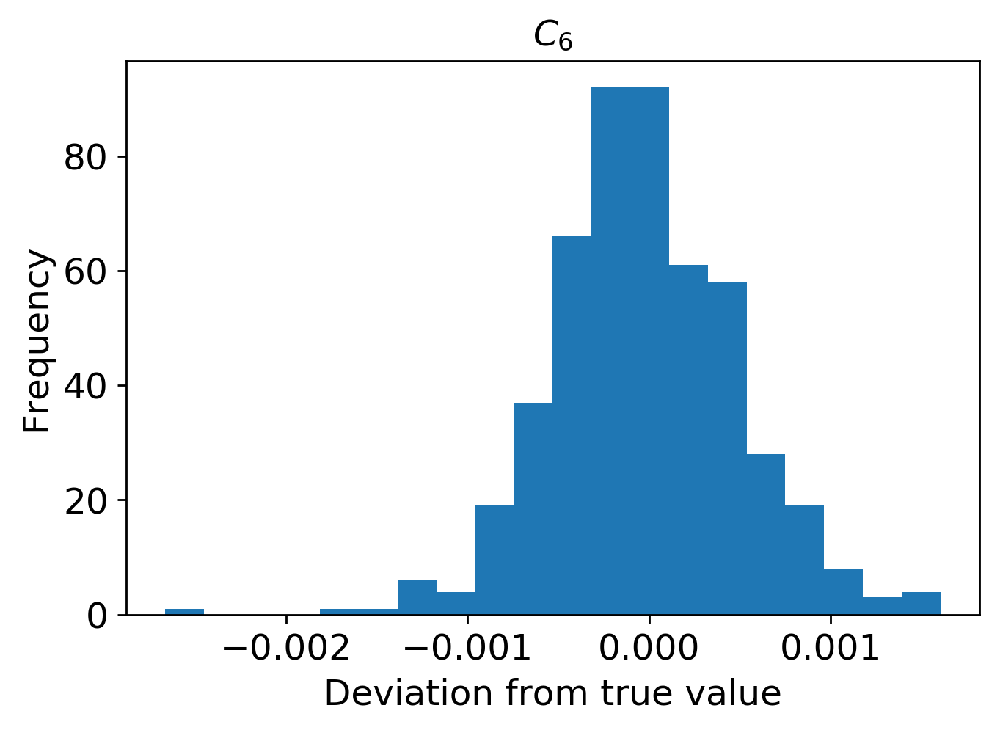

In [15]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi3000/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi3000/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

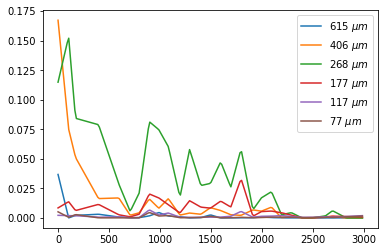

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi3000/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi3000/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='linear',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi3000.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



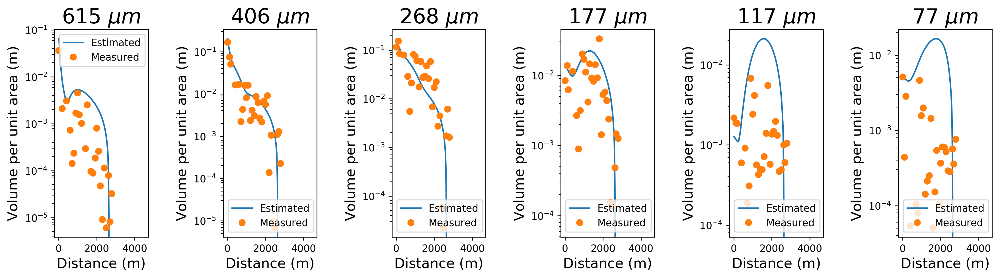

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi3000.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi3000.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi3000.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi3000.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi3000.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi3000.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi3000.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi3000.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


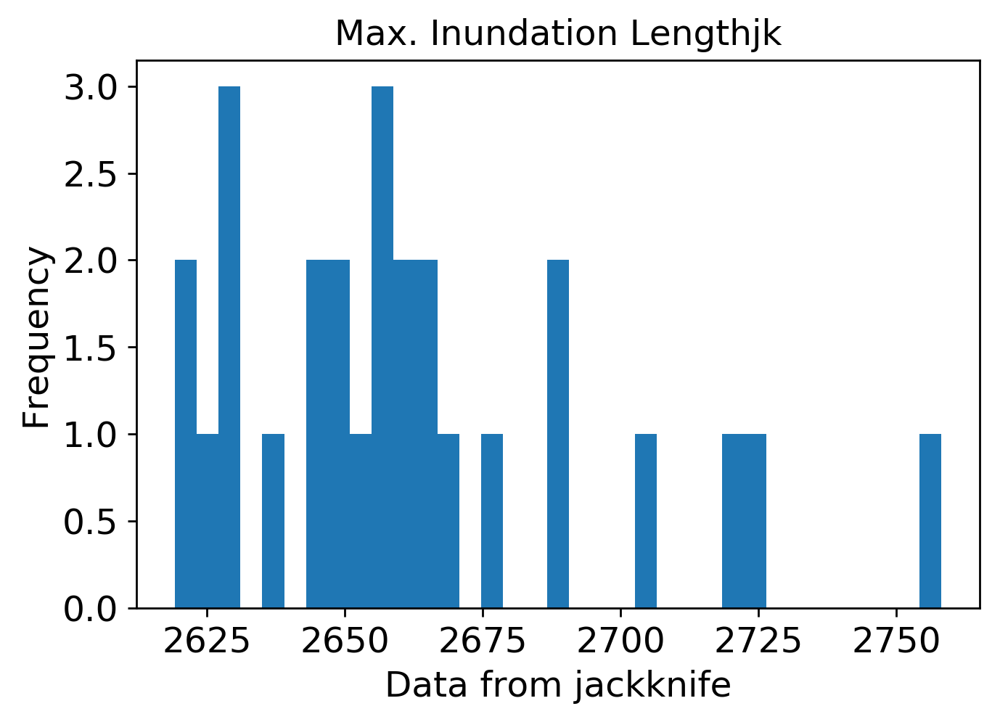

mean: 4.508060590547676
jk_e: 0.06221603263193793


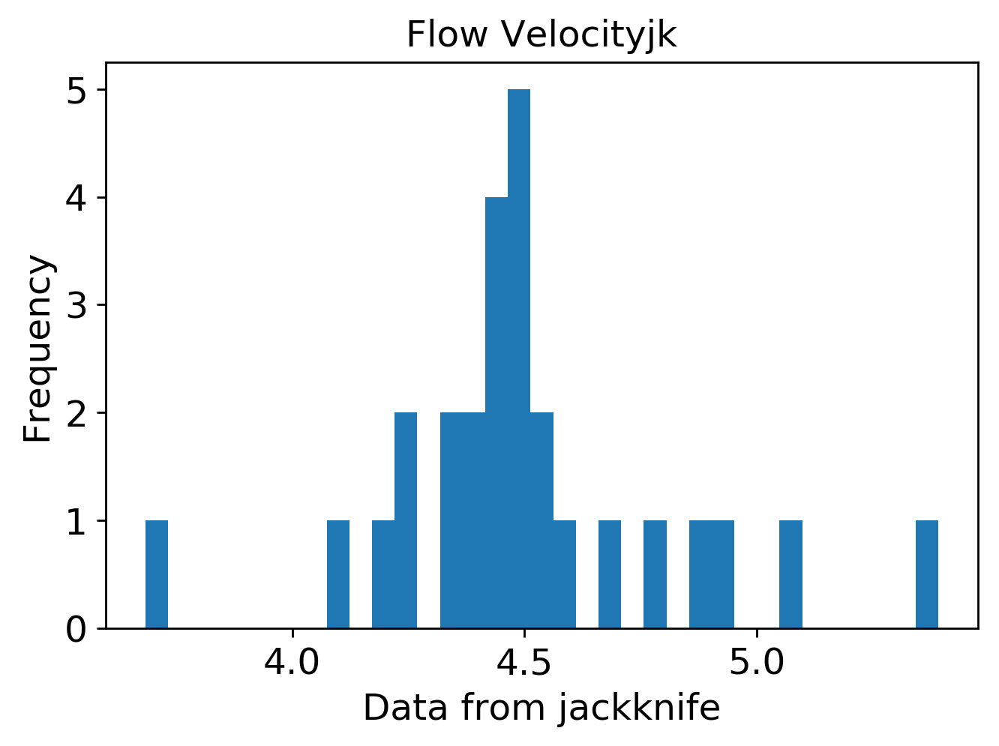

mean: 7.573823990322124
jk_e: 0.1407466778961747


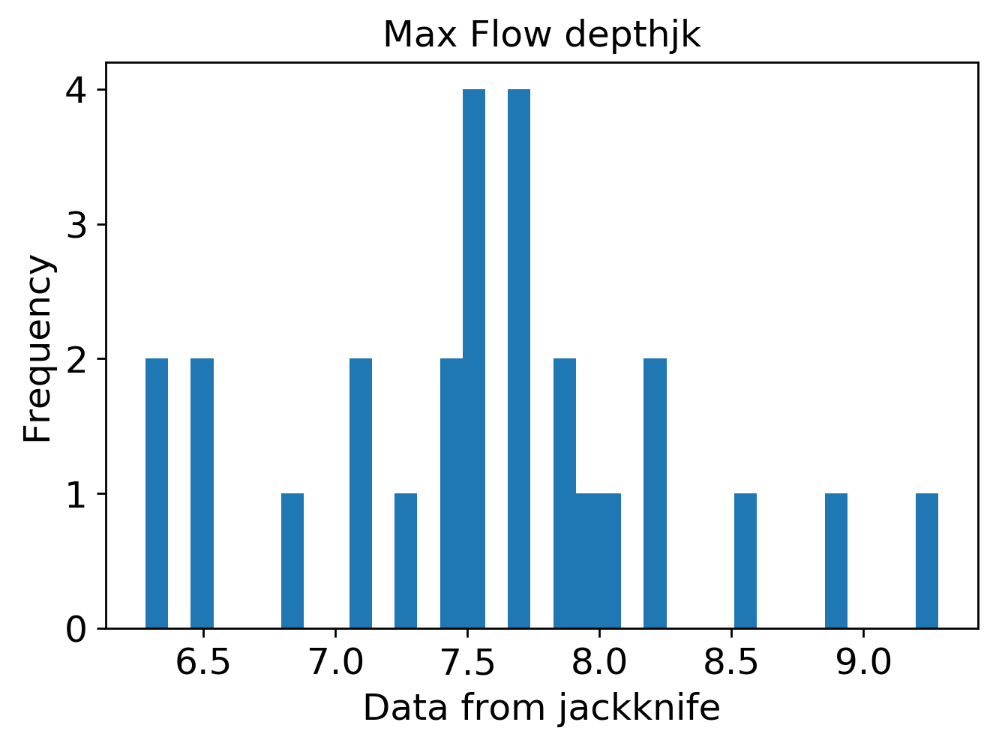

mean: 0.005819477756949309
jk_e: 0.00012864132420748551


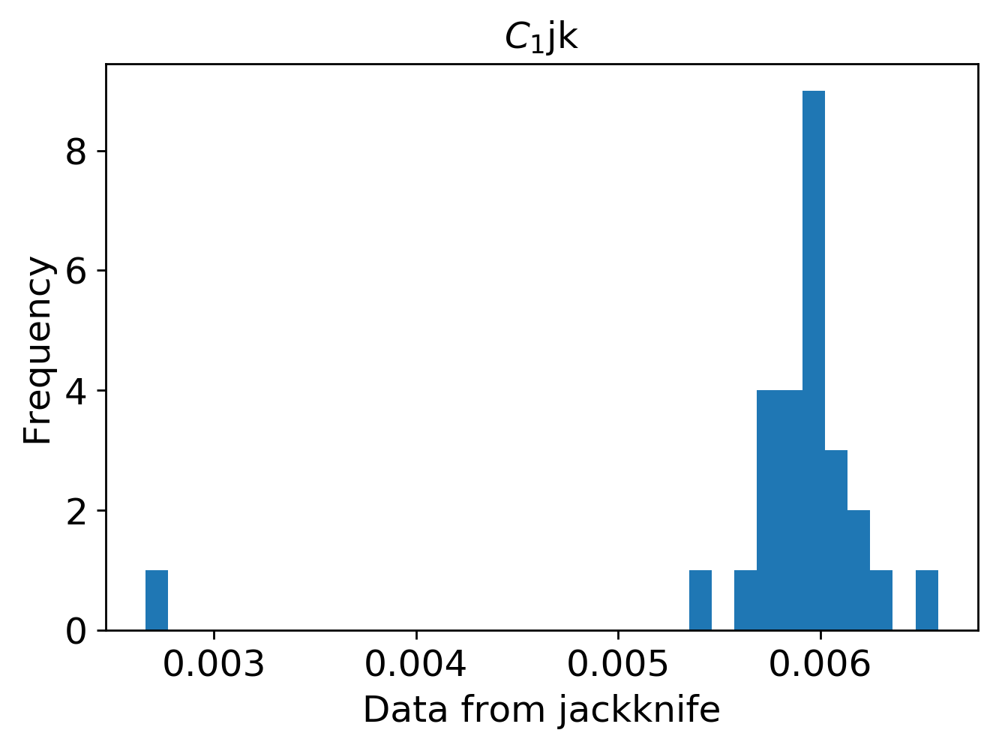

mean: 0.01754869237599208
jk_e: 0.0002464733156700854


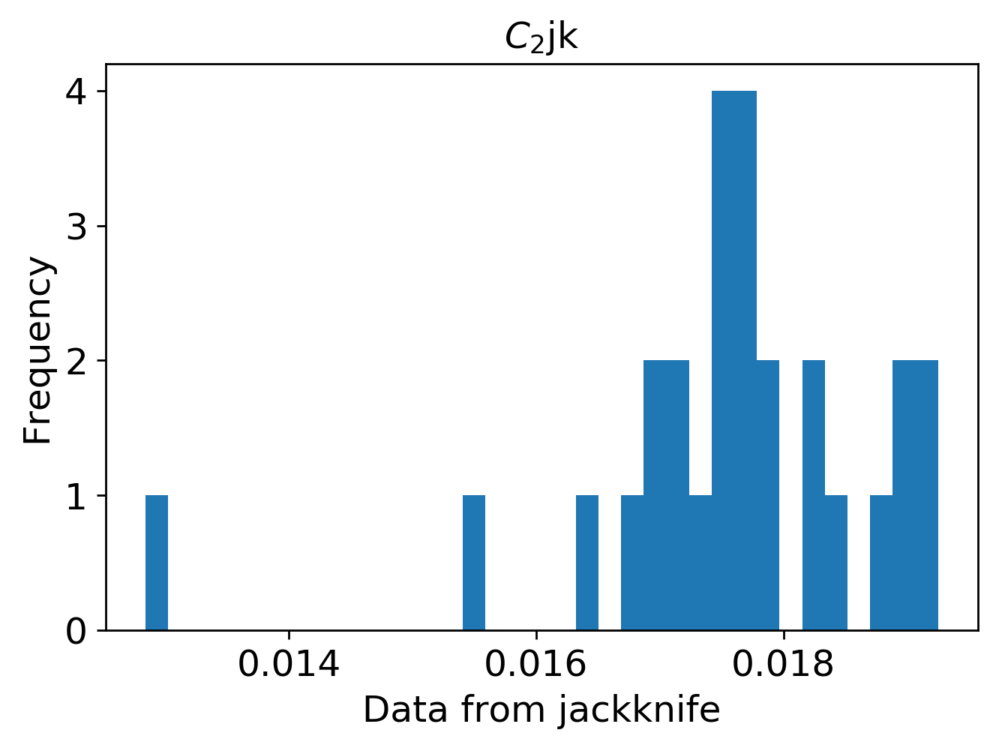

mean: 0.014395502059763188
jk_e: 0.0002987250064343152


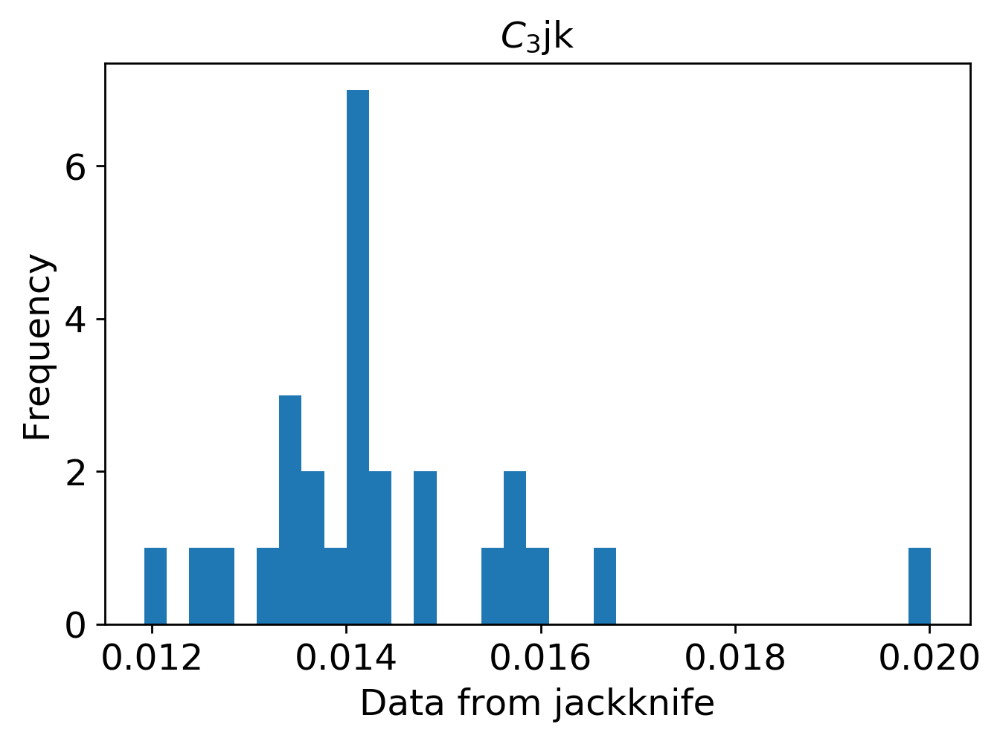

mean: 0.001199777367650561
jk_e: 3.154630688069397e-05


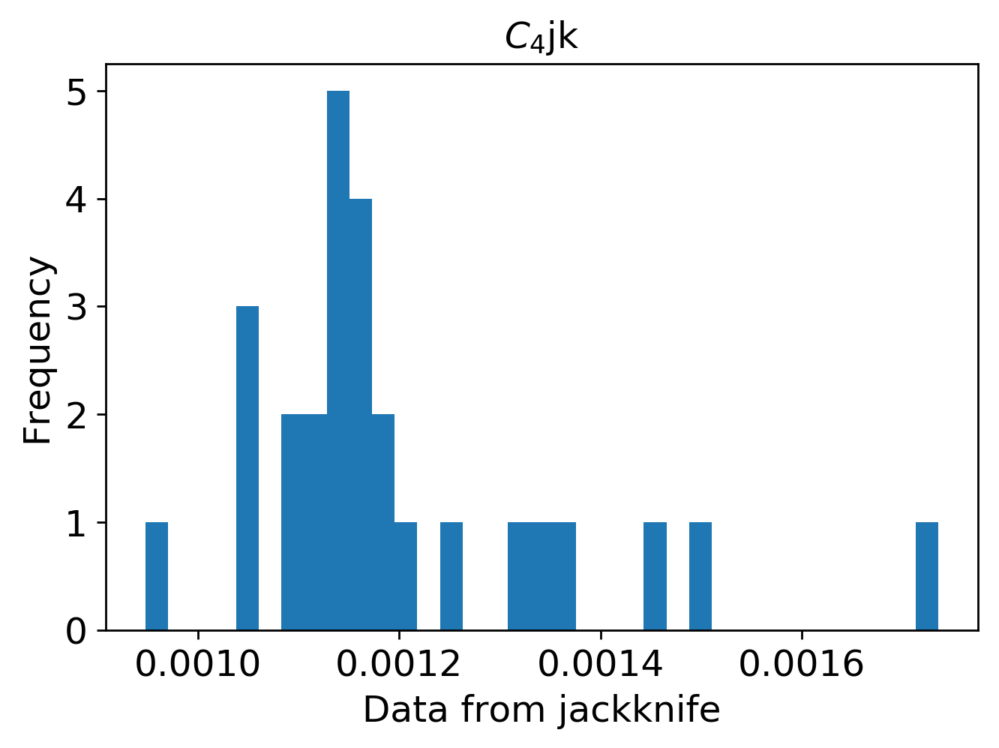

mean: 0.00010136096021857652
jk_e: 0.0


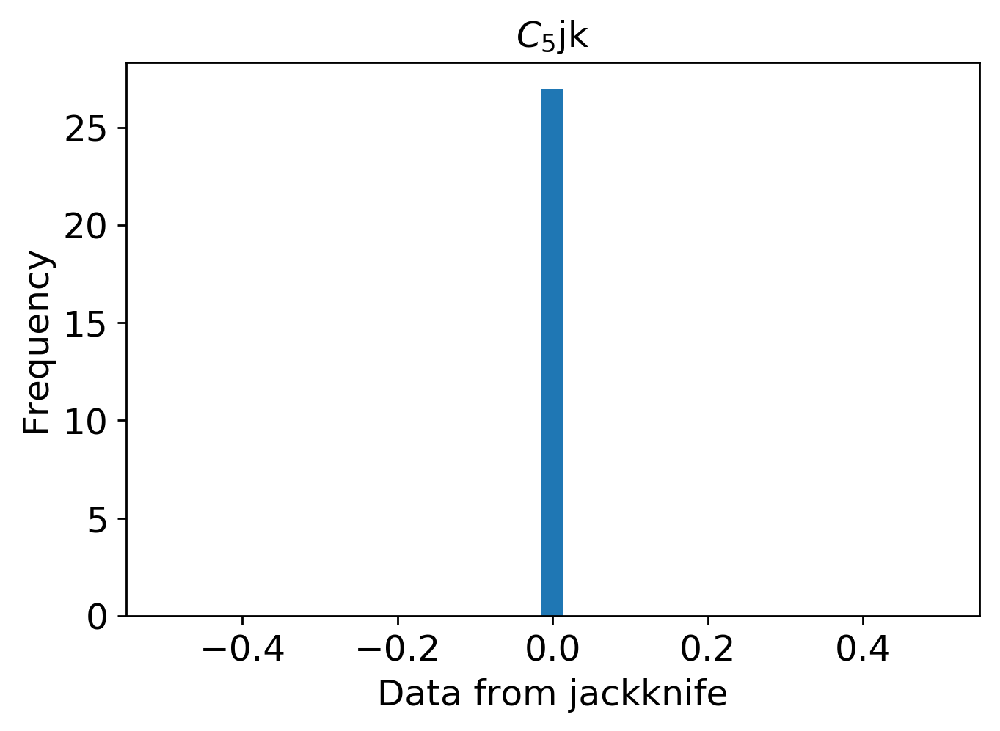

mean: 0.00040989205287197126
jk_e: 2.22981753061511e-05


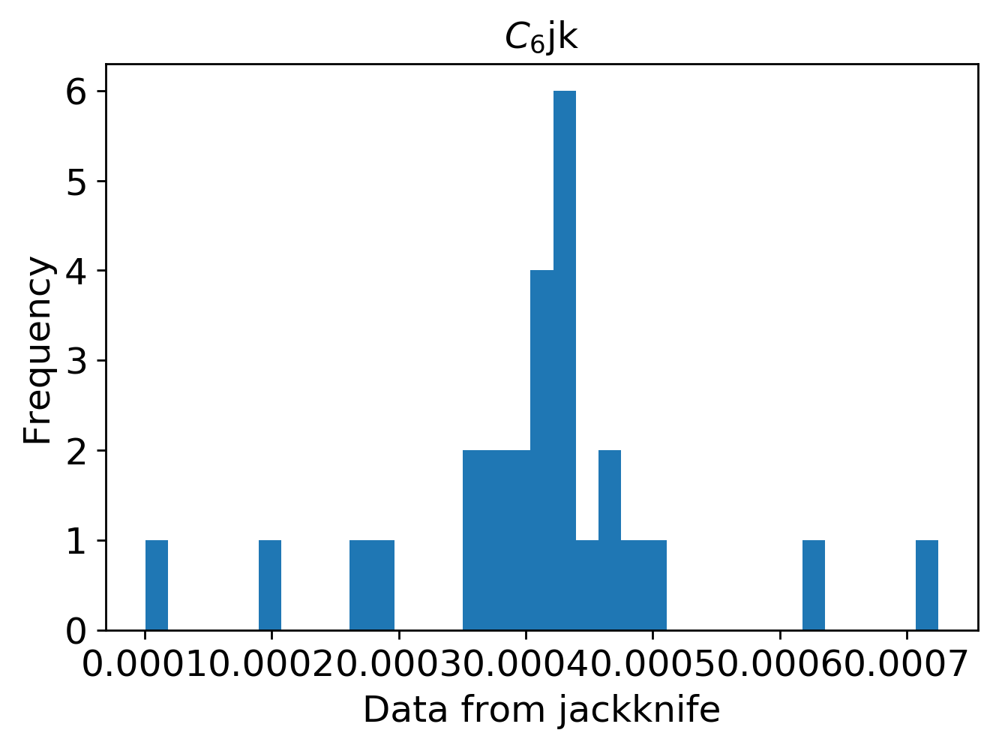

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi3000/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi3000/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi3000.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi3000.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi3000.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 3500

In [19]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi3500"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=3500)
        
        
    

Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 508us/step - loss: 0.0949 - mean_squared_error: 0.0949 - val_loss: 0.0688 - val_mean_squared_error: 0.0688
Epoch 2/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0645 - mean_squared_error: 0.0645 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 3/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0554 - mean_squared_error: 0.0554 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 4/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0480 - mean_squared_error: 0.0480 - val_loss: 0.0403 - val_mean_squared_error: 0.0403
Epoch 5/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0425 - mean_squared_error: 0.0425 - val_loss: 0.0353 - val_mean_squared_error: 0.0353
Epoch 6/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0375 - mean_squared_error: 0.03

3600/3600 [==============================] - 1s 403us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 98/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 99/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 100/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 101/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 102/2000
3600/3600 [==============================] - 1s 413us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0060 - val_mean_squared_error: 0.00

3600/3600 [==============================] - 1s 388us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 194/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 195/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 196/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 197/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 198/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0036 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 380us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 290/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 291/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 292/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 293/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 294/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0031 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 397us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 386/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 387/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 388/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 389/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 390/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0025 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 394us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 482/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 483/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 484/2000
3600/3600 [==============================] - 1s 416us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 485/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 486/2000
3600/3600 [==============================] - 1s 416us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0023 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 375us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 578/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 579/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 580/2000
3600/3600 [==============================] - 1s 409us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 581/2000
3600/3600 [==============================] - 2s 420us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 582/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 394us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 674/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 675/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 676/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 677/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 678/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 407us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 770/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 771/2000
3600/3600 [==============================] - 2s 426us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 772/2000
3600/3600 [==============================] - 2s 427us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 773/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 774/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 400us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 866/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 867/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 868/2000
3600/3600 [==============================] - 2s 425us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 869/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 870/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 400us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 962/2000
3600/3600 [==============================] - 2s 425us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 963/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 964/2000
3600/3600 [==============================] - 2s 422us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 965/2000
3600/3600 [==============================] - 2s 425us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 966/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 403us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1058/2000
3600/3600 [==============================] - 1s 409us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1059/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1060/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1061/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1062/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 386us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1106/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1107/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1108/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1109/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1110/2000
3600/3600 [==============================] - 1s 409us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 2s 420us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1154/2000
3600/3600 [==============================] - 1s 374us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1155/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1156/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1157/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1158/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 375us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1202/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1203/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1204/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1205/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1206/2000
3600/3600 [==============================] - 1s 412us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 403us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1250/2000
3600/3600 [==============================] - 1s 409us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1251/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1252/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1253/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1254/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 398us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1298/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1299/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1300/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1301/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1302/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 369us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1346/2000
3600/3600 [==============================] - 1s 417us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1347/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1348/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1349/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1350/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 390us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1394/2000
3600/3600 [==============================] - 1s 409us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1395/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1396/2000
3600/3600 [==============================] - 1s 397us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1397/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1398/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 414us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1442/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1443/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1444/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1445/2000
3600/3600 [==============================] - 1s 405us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1446/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 2s 446us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1490/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1491/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1492/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1493/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1494/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 400us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1538/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1539/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1540/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1541/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1542/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 377us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1586/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1587/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1588/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1589/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1590/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 407us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1634/2000
3600/3600 [==============================] - 1s 414us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1635/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1636/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1637/2000
3600/3600 [==============================] - 2s 420us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1638/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 390us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1682/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 1683/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1684/2000
3600/3600 [==============================] - 1s 397us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1685/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1686/2000
3600/3600 [==============================] - 1s 414us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_erro

3600/3600 [==============================] - 1s 381us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 1730/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1731/2000
3600/3600 [==============================] - 2s 421us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1732/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1733/2000
3600/3600 [==============================] - 1s 413us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1734/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 2s 419us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1778/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1779/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1780/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1781/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1782/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 408us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1826/2000
3600/3600 [==============================] - 2s 417us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1827/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1828/2000
3600/3600 [==============================] - 1s 412us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1829/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1830/2000
3600/3600 [==============================] - 1s 412us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_erro

Epoch 1873/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1874/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1875/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1876/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1877/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1878/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_m

Epoch 1921/2000
3600/3600 [==============================] - 2s 422us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1922/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1923/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1924/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1925/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1926/2000
3600/3600 [==============================] - 1s 413us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0011 - val_m

Epoch 1969/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1970/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1971/2000
3600/3600 [==============================] - 1s 405us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1972/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1973/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1974/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_m

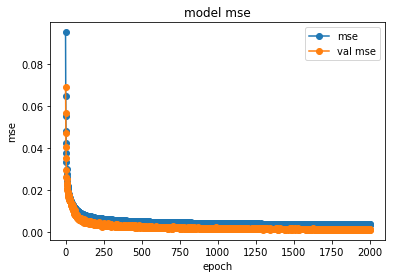

save the model


In [20]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi3500/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi3500/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




(500, 9)


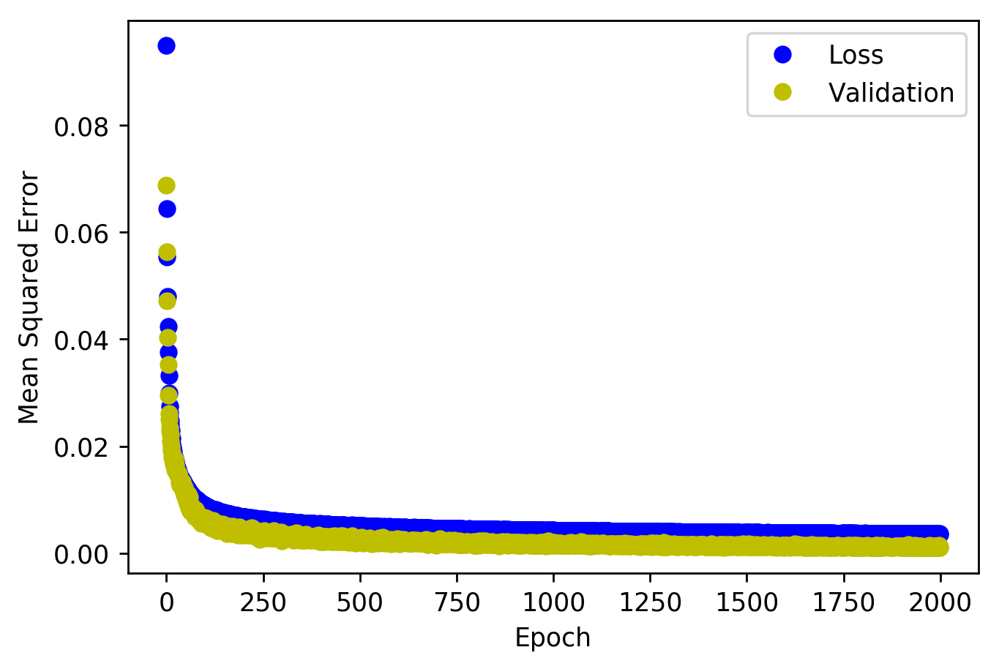

<Figure size 432x288 with 0 Axes>

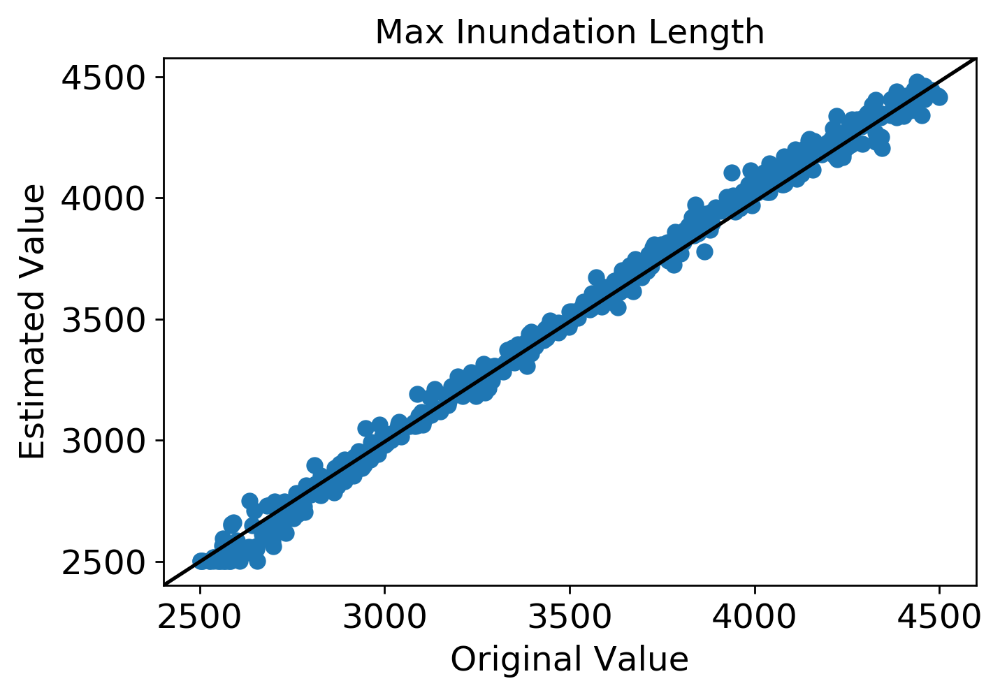

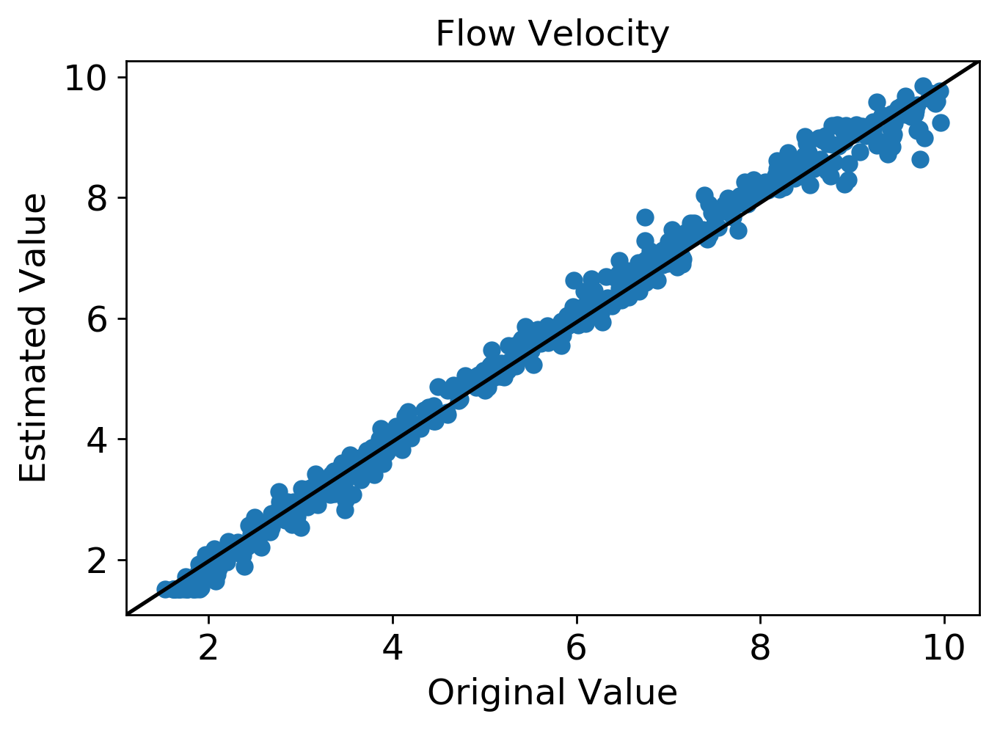

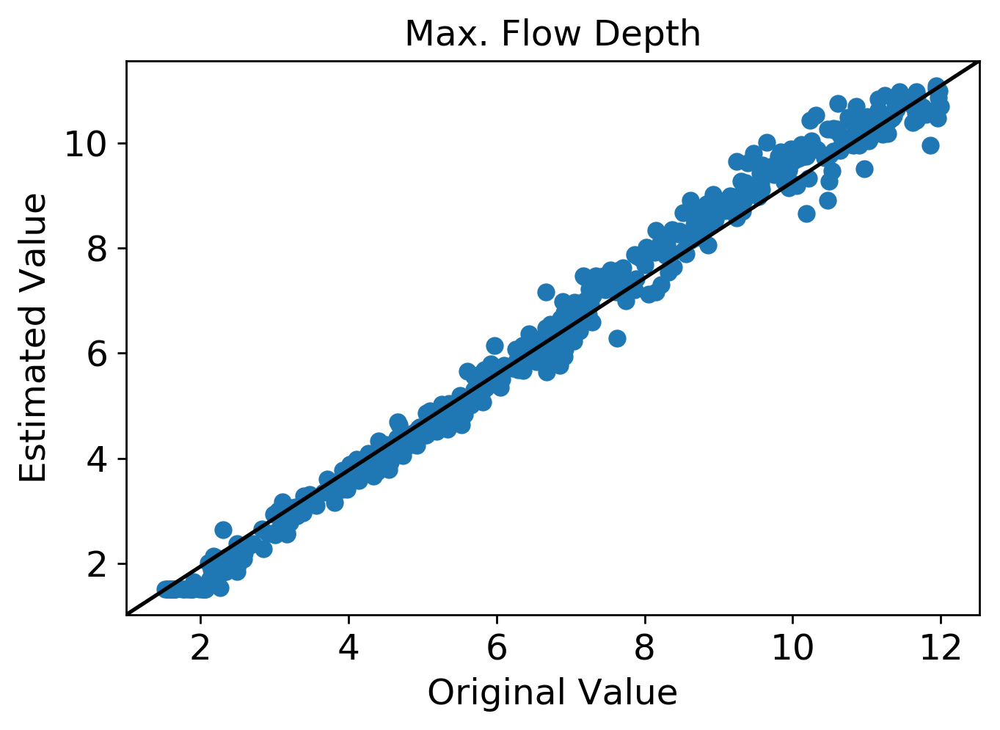

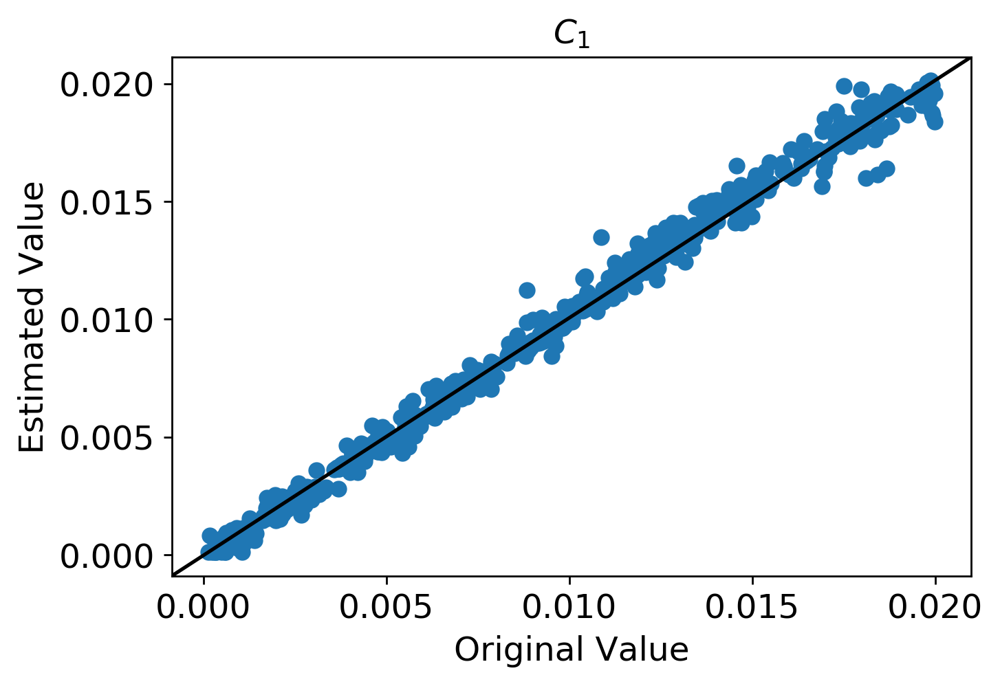

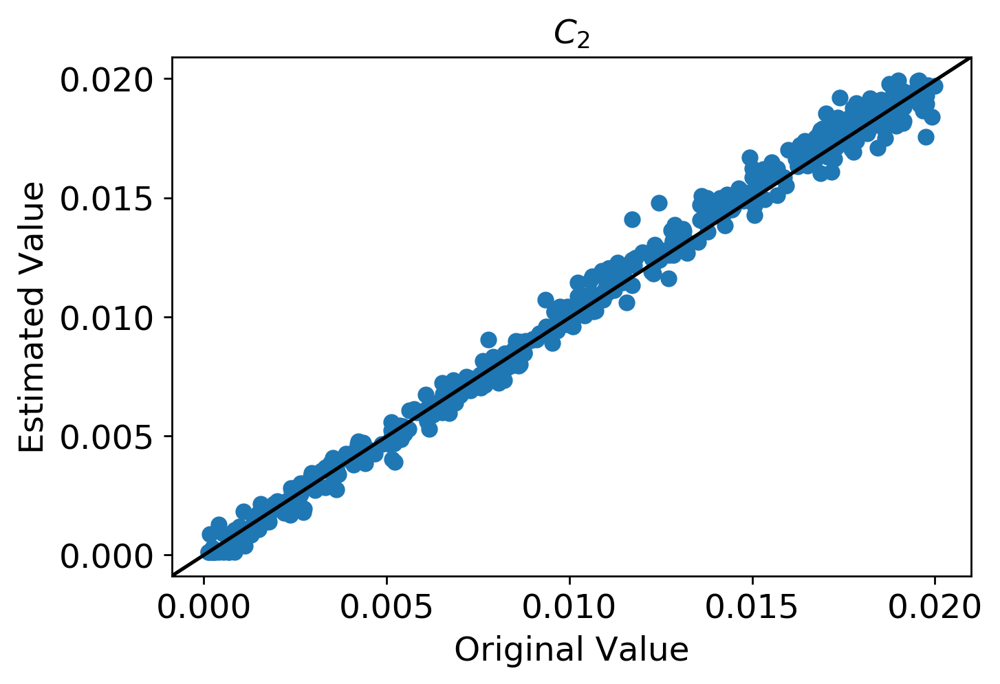

...

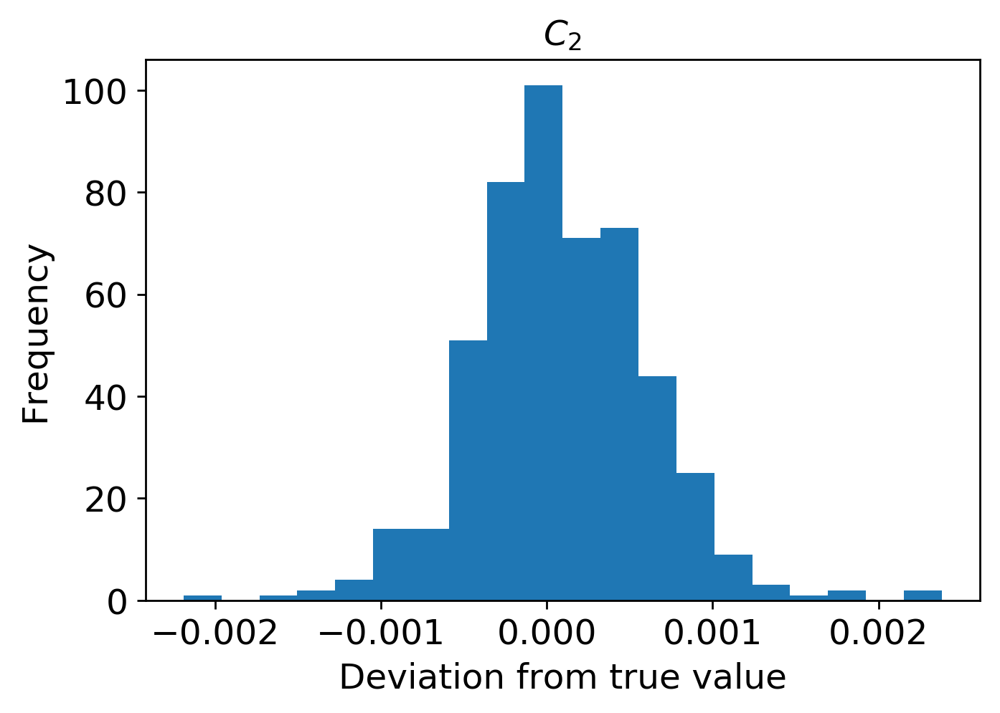

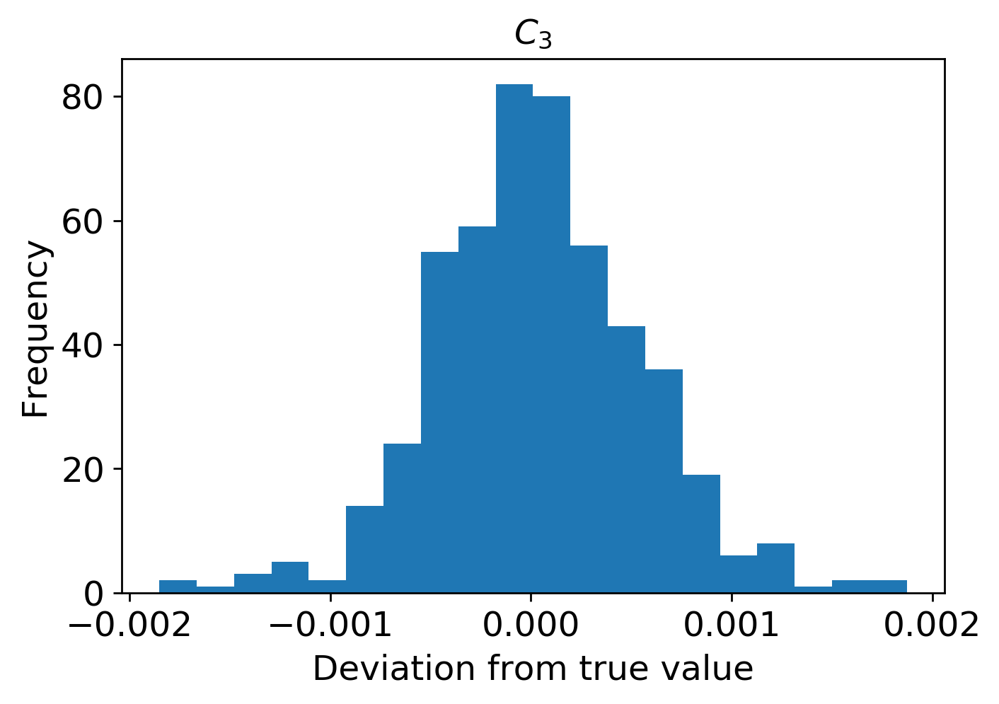

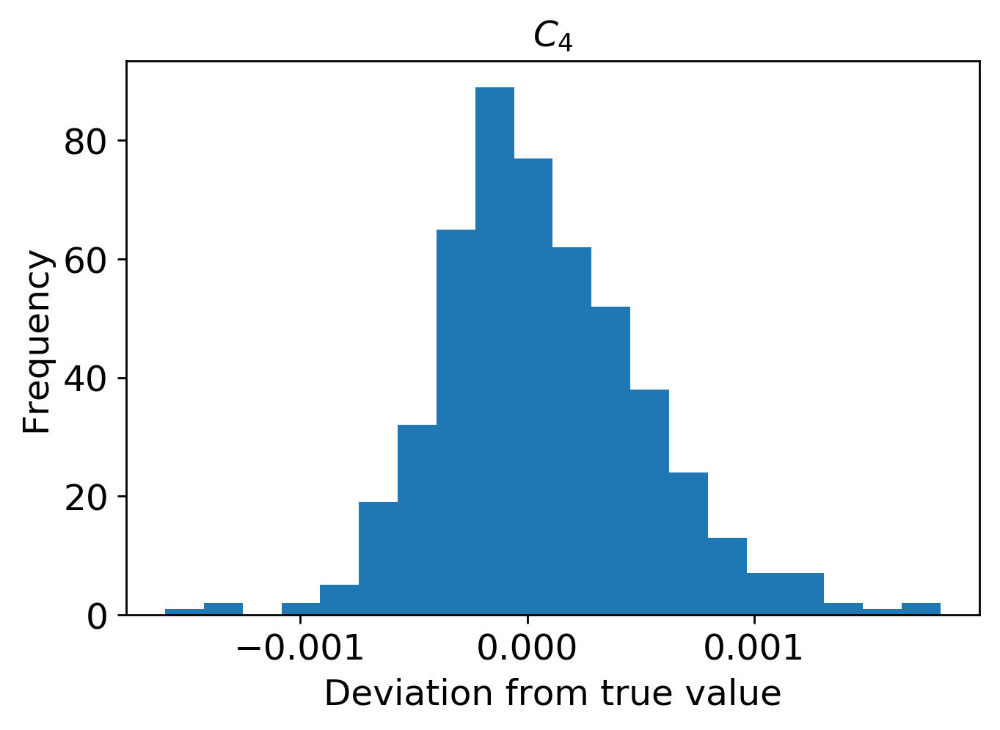

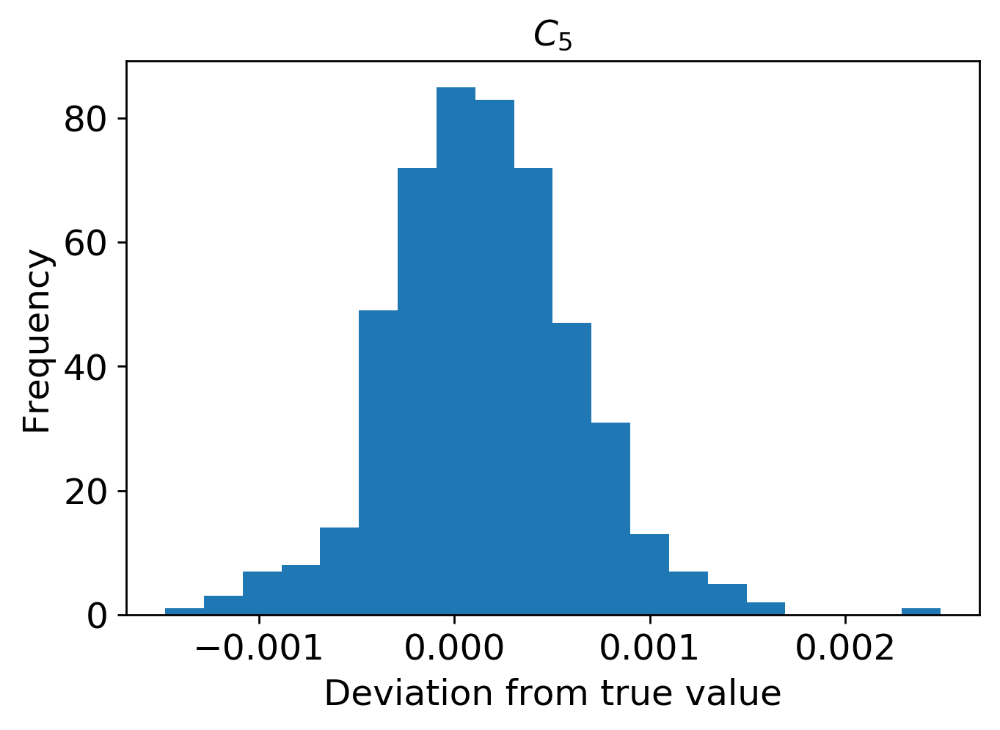

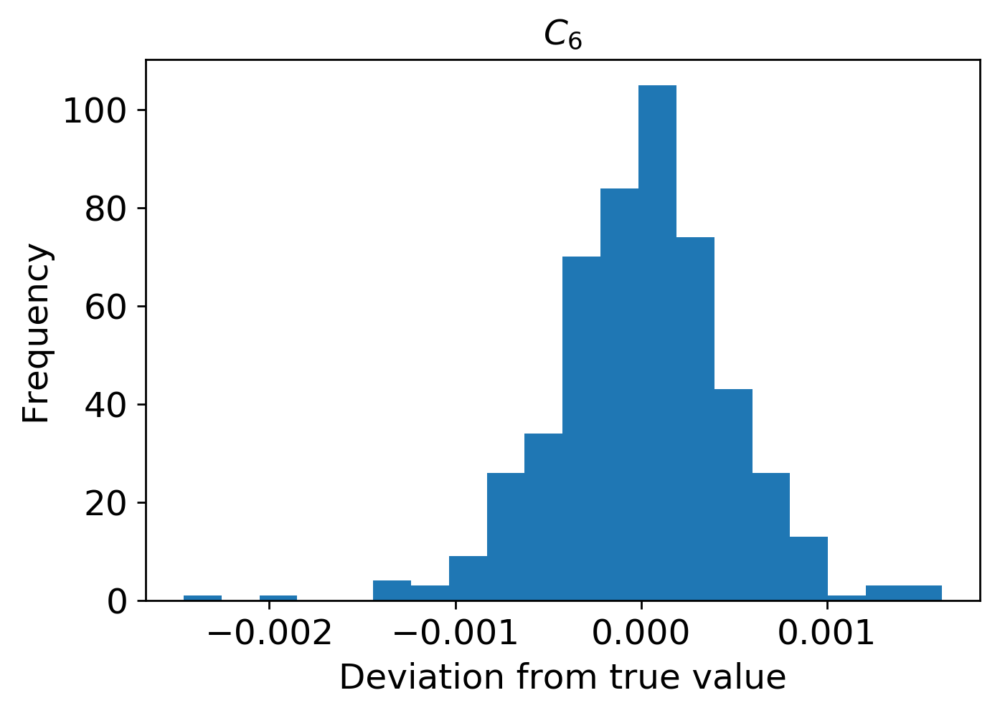

In [21]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi3500/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi3500/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

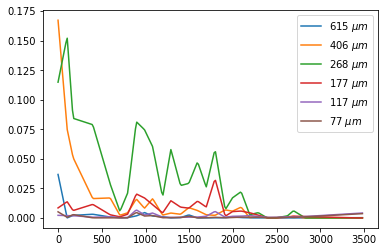

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi3500/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi3500/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='gaussian',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi3500.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



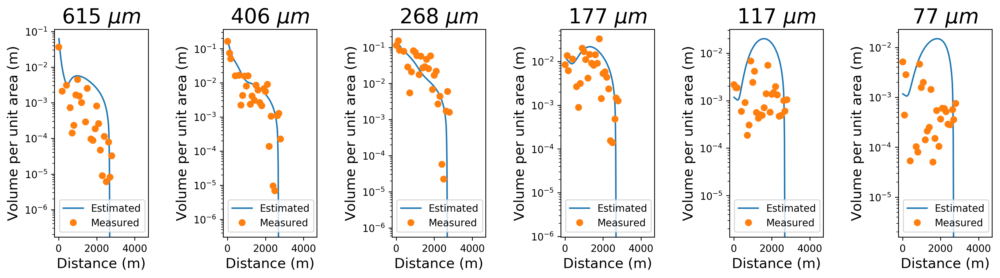

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3500.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi3500.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi3500.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi3500.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi3500.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi3500.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi3500.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi3500.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi3500.eps")
plt.show()

Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

(1, 9)
[[2.73212909e+03 5.06719867e+00 6.40055771e+00 6.15875555e-03
  1.92972810e-02 1.68325653e-02 1.21664488e-03 1.01360960e-04
  1.00773694e-04]]
       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.37253

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


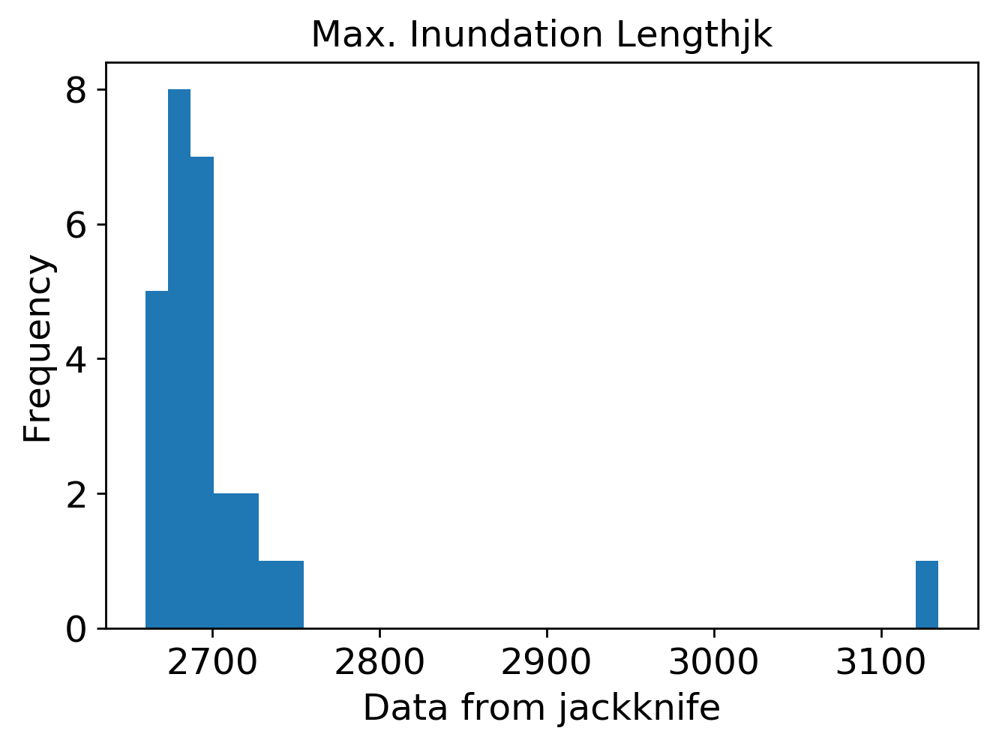

mean: 4.961433230179624
jk_e: 0.0729098387600563


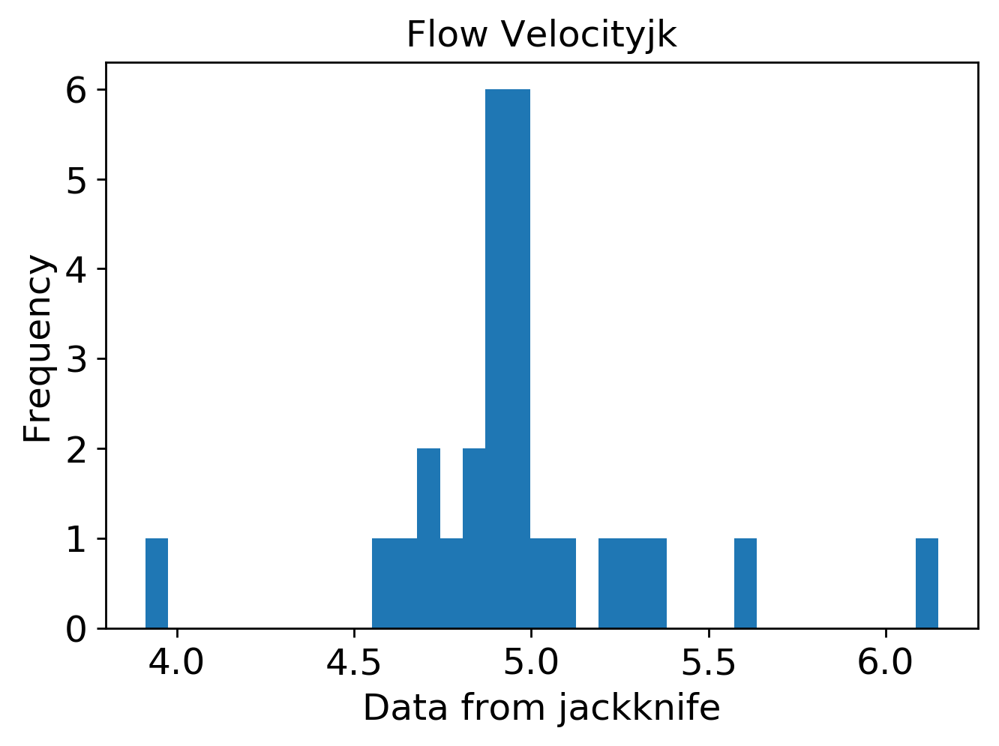

mean: 6.931590711673742
jk_e: 0.16721584243937085


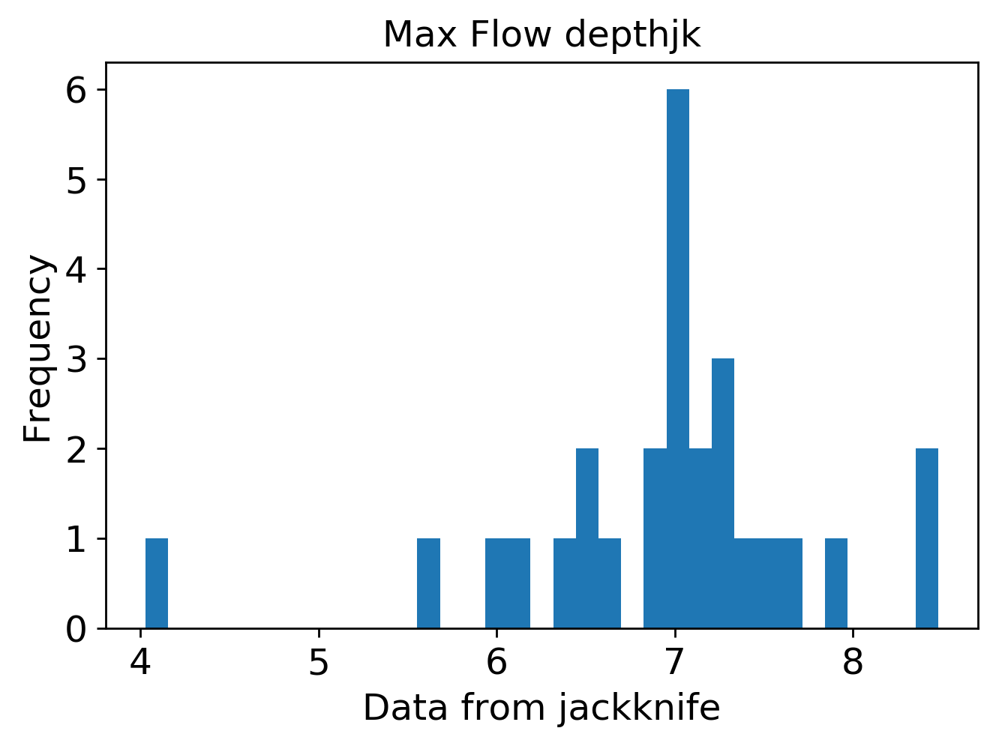

mean: 0.006097539675157835
jk_e: 0.00014333548960443522


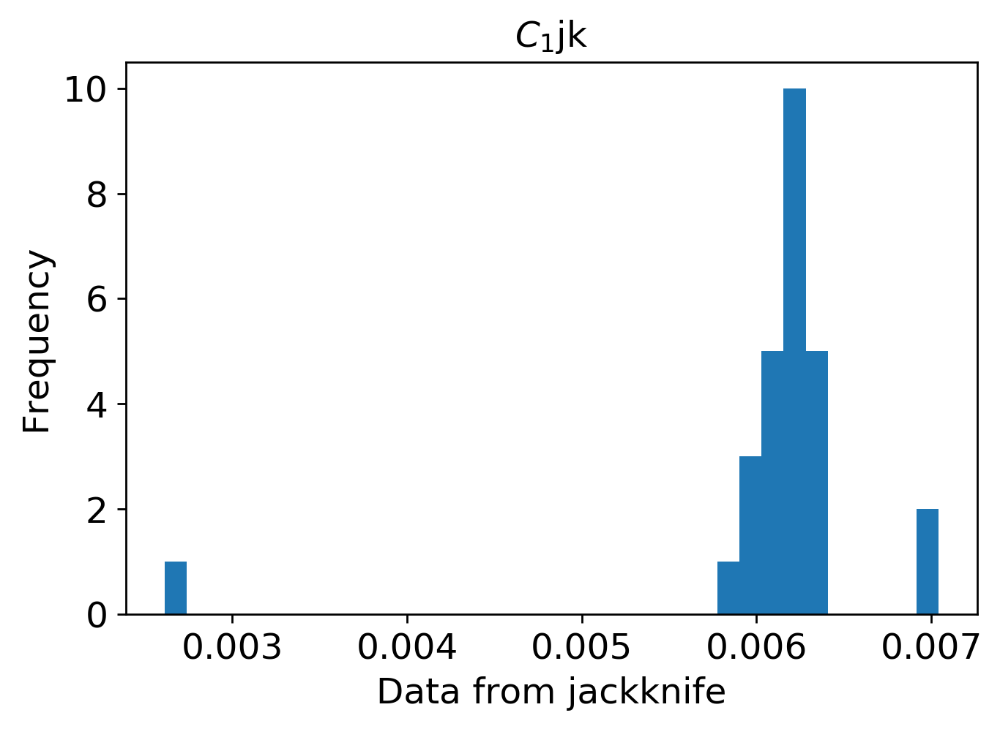

mean: 0.018438473018426698
jk_e: 0.00030936956293354953


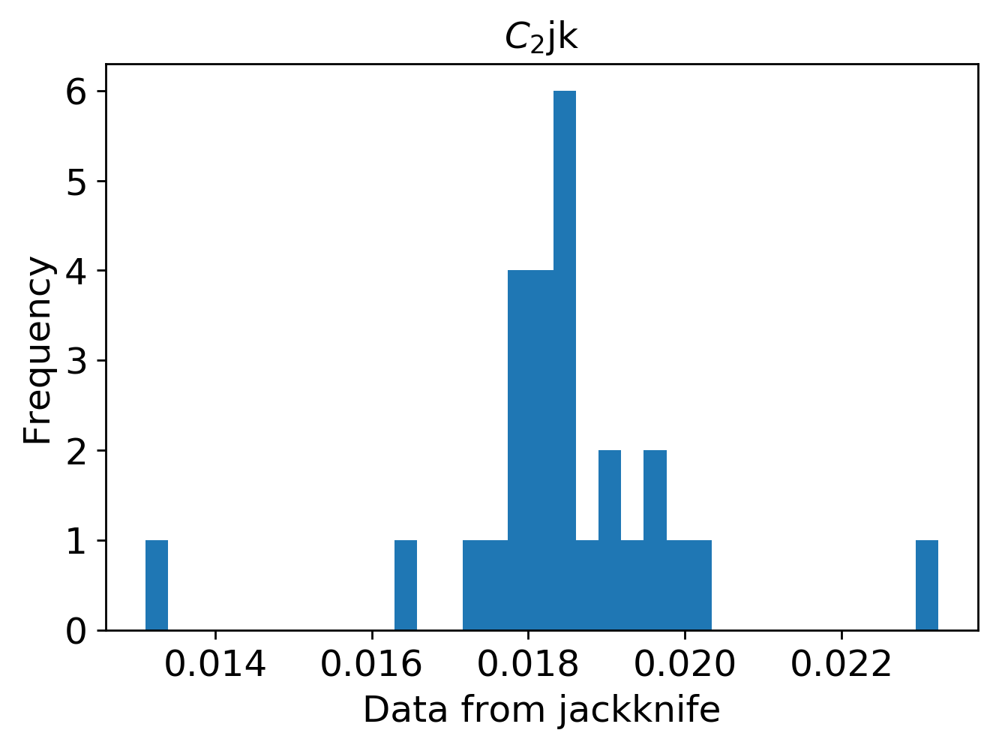

mean: 0.01594368542377634
jk_e: 0.00032807806599860864


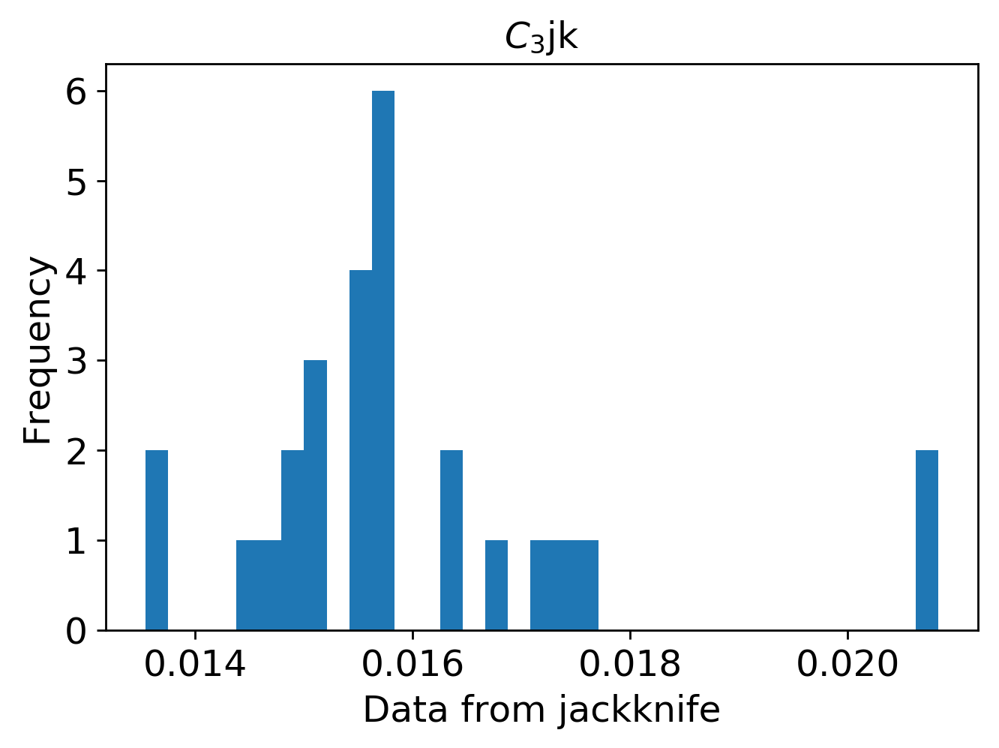

mean: 0.0011221118707438
jk_e: 3.540638989402596e-05


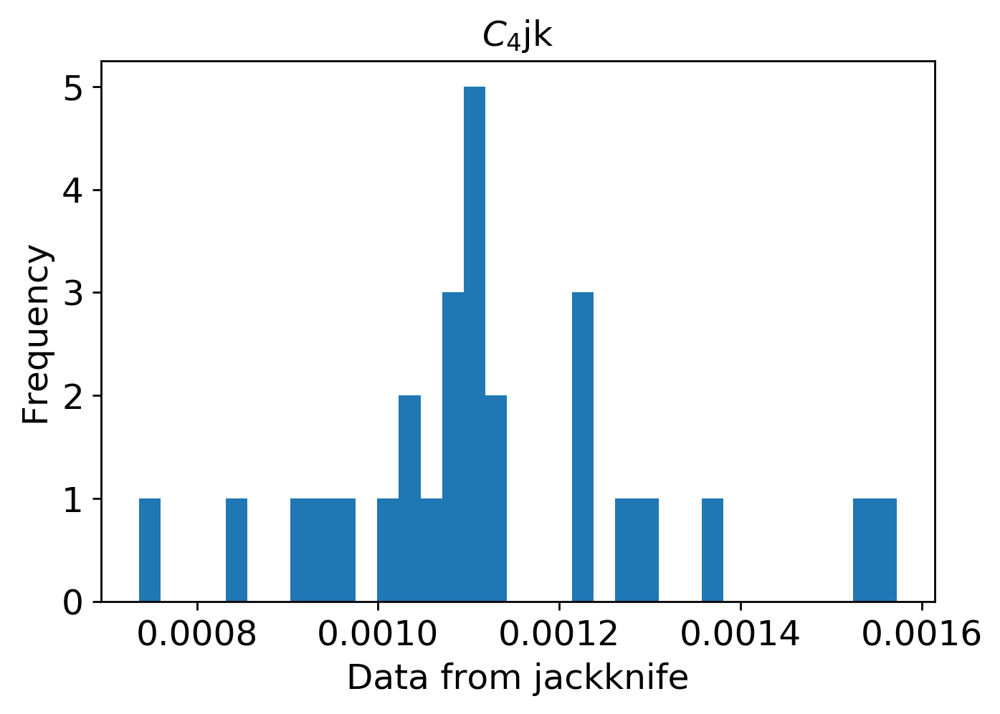

mean: 0.0001545849921135167
jk_e: 4.36865523084919e-05


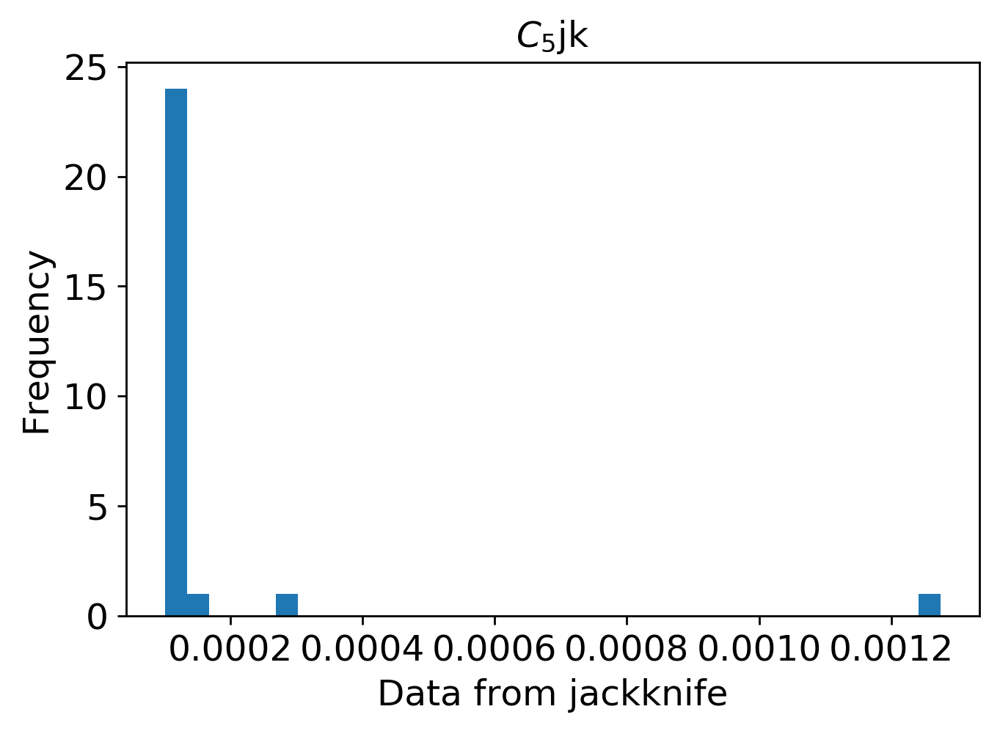

mean: 0.00011536151949344493
jk_e: 1.23148586323837e-05


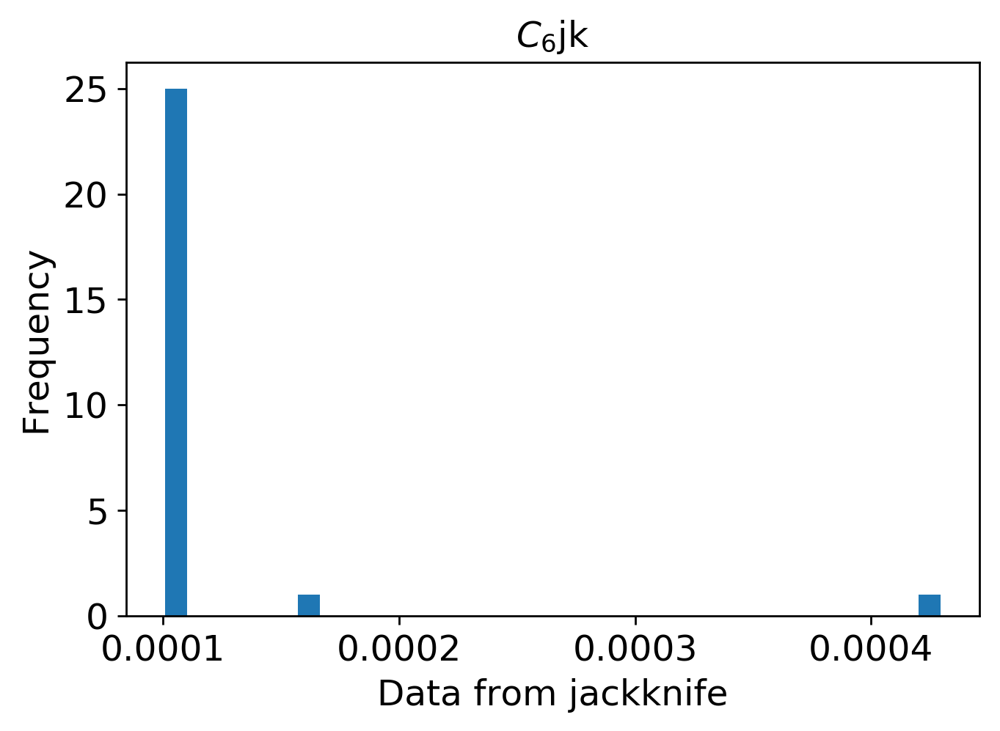

In [1]:
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi3500/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi3500/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi3500.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi3500.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi3500.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()

# ROI 4000

In [25]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi4000"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=4000)
        
        
    

Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 522us/step - loss: 0.0971 - mean_squared_error: 0.0971 - val_loss: 0.0711 - val_mean_squared_error: 0.0711
Epoch 2/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 3/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0556 - mean_squared_error: 0.0556 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 4/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0491 - mean_squared_error: 0.0491 - val_loss: 0.0417 - val_mean_squared_error: 0.0417
Epoch 5/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0428 - mean_squared_error: 0.0428 - val_loss: 0.0366 - val_mean_squared_error: 0.0366
Epoch 6/2000
3600/3600 [==============================] - 1s 414us/step - loss: 0.0377 - mean_squared_error: 0.03

3600/3600 [==============================] - 1s 405us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 98/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 99/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0064 - val_mean_squared_error: 0.0064
Epoch 100/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 101/2000
3600/3600 [==============================] - 1s 409us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 102/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0062 - val_mean_squared_error: 0.00

3600/3600 [==============================] - 2s 420us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 194/2000
3600/3600 [==============================] - 2s 422us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 195/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 196/2000
3600/3600 [==============================] - 2s 422us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 197/2000
3600/3600 [==============================] - 1s 413us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 198/2000
3600/3600 [==============================] - 1s 405us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0042 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 378us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 290/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 291/2000
3600/3600 [==============================] - 1s 397us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 292/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 293/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 294/2000
3600/3600 [==============================] - 2s 427us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0031 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 407us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 386/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 387/2000
3600/3600 [==============================] - 1s 411us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 388/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 389/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 390/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0027 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 410us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 482/2000
3600/3600 [==============================] - 2s 419us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 483/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 484/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 485/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 486/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0025 - val_mean_squared_error: 0.

Epoch 577/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 578/2000
3600/3600 [==============================] - 1s 404us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 579/2000
3600/3600 [==============================] - 1s 416us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 580/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 581/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 582/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_sq

3600/3600 [==============================] - 1s 389us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 674/2000
3600/3600 [==============================] - 2s 441us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 675/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 676/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 677/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 678/2000
3600/3600 [==============================] - 1s 409us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 400us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 770/2000
3600/3600 [==============================] - 1s 413us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 771/2000
3600/3600 [==============================] - 1s 413us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 772/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 773/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 774/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0017 - val_mean_squared_error: 0.

3600/3600 [==============================] - 2s 430us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 866/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 867/2000
3600/3600 [==============================] - 1s 412us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 868/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 869/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 870/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0015 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 416us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 962/2000
3600/3600 [==============================] - 1s 409us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 963/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 964/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 965/2000
3600/3600 [==============================] - 1s 411us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 966/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 400us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1058/2000
3600/3600 [==============================] - 1s 417us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1059/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1060/2000
3600/3600 [==============================] - 2s 423us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1061/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1062/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 400us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1106/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1107/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1108/2000
3600/3600 [==============================] - 1s 415us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1109/2000
3600/3600 [==============================] - 1s 404us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1110/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 406us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1154/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1155/2000
3600/3600 [==============================] - 1s 405us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1156/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1157/2000
3600/3600 [==============================] - 1s 415us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1158/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 405us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1202/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1203/2000
3600/3600 [==============================] - 1s 411us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1204/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1205/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1206/2000
3600/3600 [==============================] - 1s 401us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 407us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1250/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1251/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1252/2000
3600/3600 [==============================] - 1s 392us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1253/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1254/2000
3600/3600 [==============================] - 1s 387us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 391us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1298/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1299/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1300/2000
3600/3600 [==============================] - 2s 419us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1301/2000
3600/3600 [==============================] - 2s 421us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1302/2000
3600/3600 [==============================] - 1s 397us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 400us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1346/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1347/2000
3600/3600 [==============================] - 1s 397us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1348/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1349/2000
3600/3600 [==============================] - 2s 431us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1350/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 413us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1394/2000
3600/3600 [==============================] - 1s 413us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1395/2000
3600/3600 [==============================] - 1s 416us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1396/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1397/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1398/2000
3600/3600 [==============================] - 1s 414us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 395us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1442/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1443/2000
3600/3600 [==============================] - 1s 402us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1444/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1445/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1446/2000
3600/3600 [==============================] - 2s 418us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 366us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1490/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1491/2000
3600/3600 [==============================] - 2s 417us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1492/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1493/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1494/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 407us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1538/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1539/2000
3600/3600 [==============================] - 1s 385us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1540/2000
3600/3600 [==============================] - 1s 404us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1541/2000
3600/3600 [==============================] - 1s 412us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1542/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_erro

3600/3600 [==============================] - 1s 400us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1586/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1587/2000
3600/3600 [==============================] - 1s 397us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1588/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1589/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1590/2000
3600/3600 [==============================] - 2s 421us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 393us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1634/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1635/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1636/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1637/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1638/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 400us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1682/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1683/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1684/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1685/2000
3600/3600 [==============================] - 1s 411us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1686/2000
3600/3600 [==============================] - 2s 438us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 394us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1730/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1731/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1732/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1733/2000
3600/3600 [==============================] - 1s 394us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1734/2000
3600/3600 [==============================] - 2s 431us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 412us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1778/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 1779/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1780/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1781/2000
3600/3600 [==============================] - 1s 399us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1782/2000
3600/3600 [==============================] - 1s 411us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_erro

Epoch 1825/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1826/2000
3600/3600 [==============================] - 1s 409us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1827/2000
3600/3600 [==============================] - 1s 406us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1828/2000
3600/3600 [==============================] - 1s 374us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1829/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1830/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_m

Epoch 1873/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1874/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1875/2000
3600/3600 [==============================] - 1s 414us/step - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1876/2000
3600/3600 [==============================] - 1s 400us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1877/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1878/2000
3600/3600 [==============================] - 1s 398us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_m

Epoch 1921/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 1922/2000
3600/3600 [==============================] - 1s 407us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1923/2000
3600/3600 [==============================] - 1s 403us/step - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1924/2000
3600/3600 [==============================] - 2s 420us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1925/2000
3600/3600 [==============================] - 2s 417us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1926/2000
3600/3600 [==============================] - 1s 416us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_m

Epoch 1969/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1970/2000
3600/3600 [==============================] - 1s 410us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1971/2000
3600/3600 [==============================] - 1s 404us/step - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1972/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1973/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1974/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.0011 - val_m

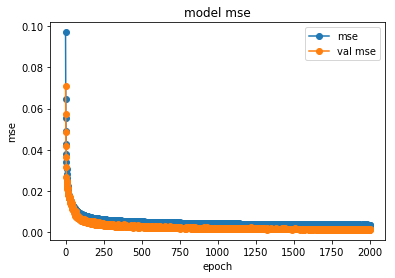

save the model


In [26]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi4000/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi4000/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




(500, 9)


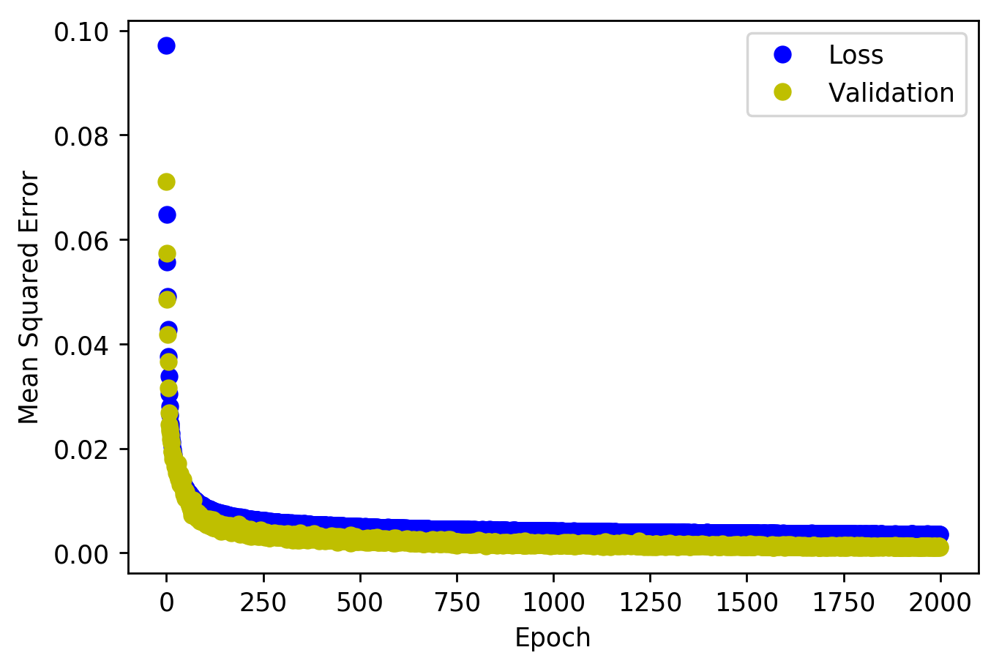

<Figure size 432x288 with 0 Axes>

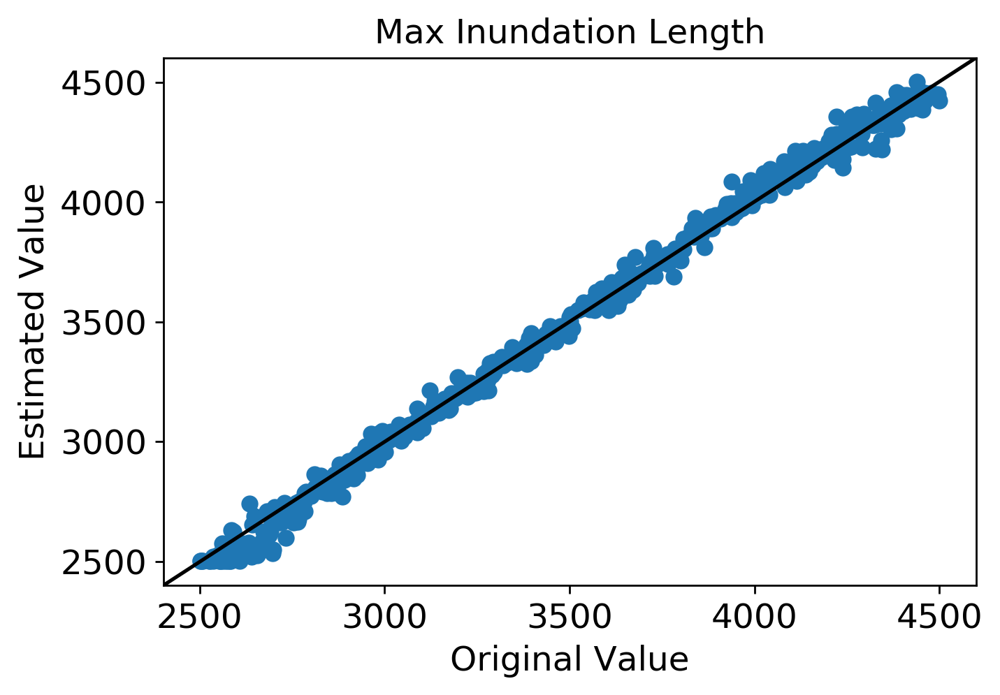

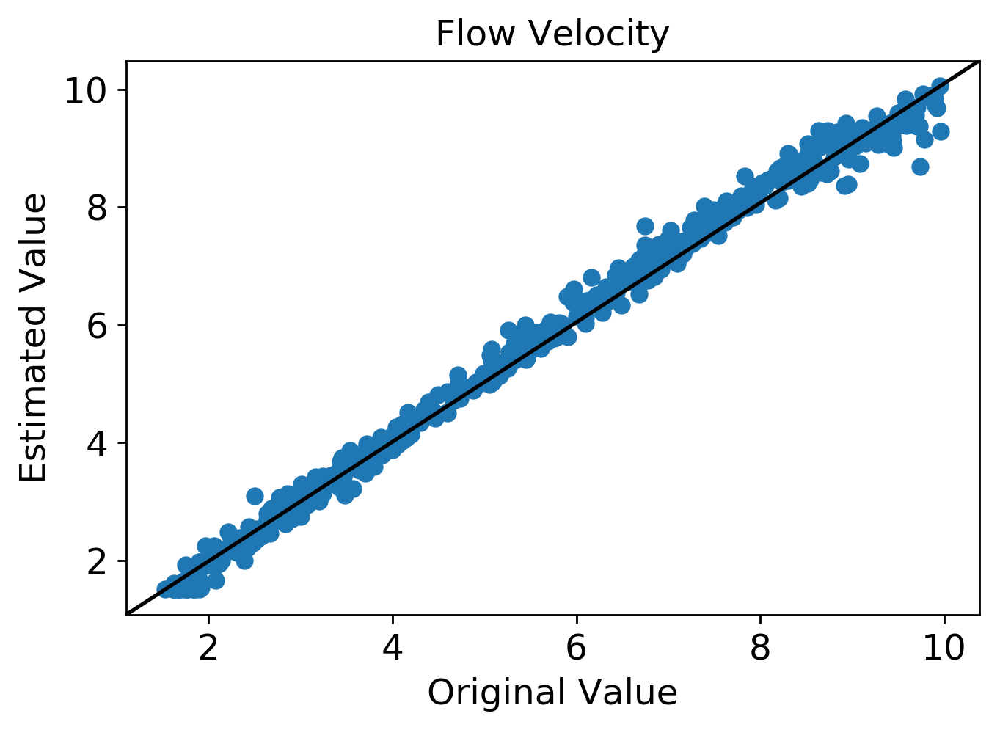

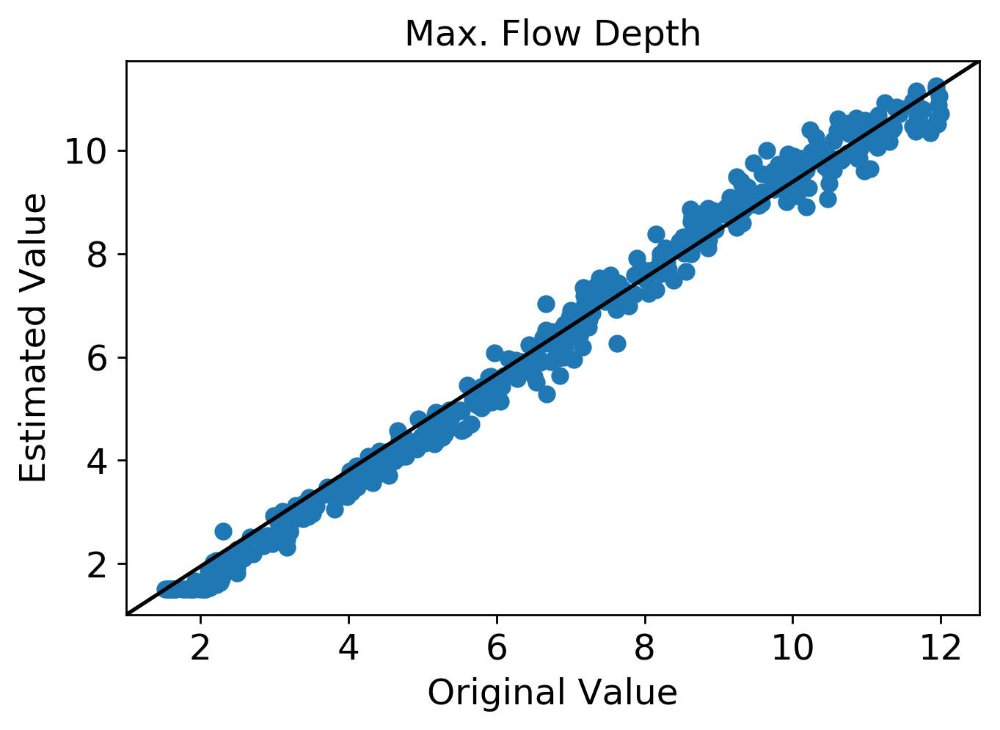

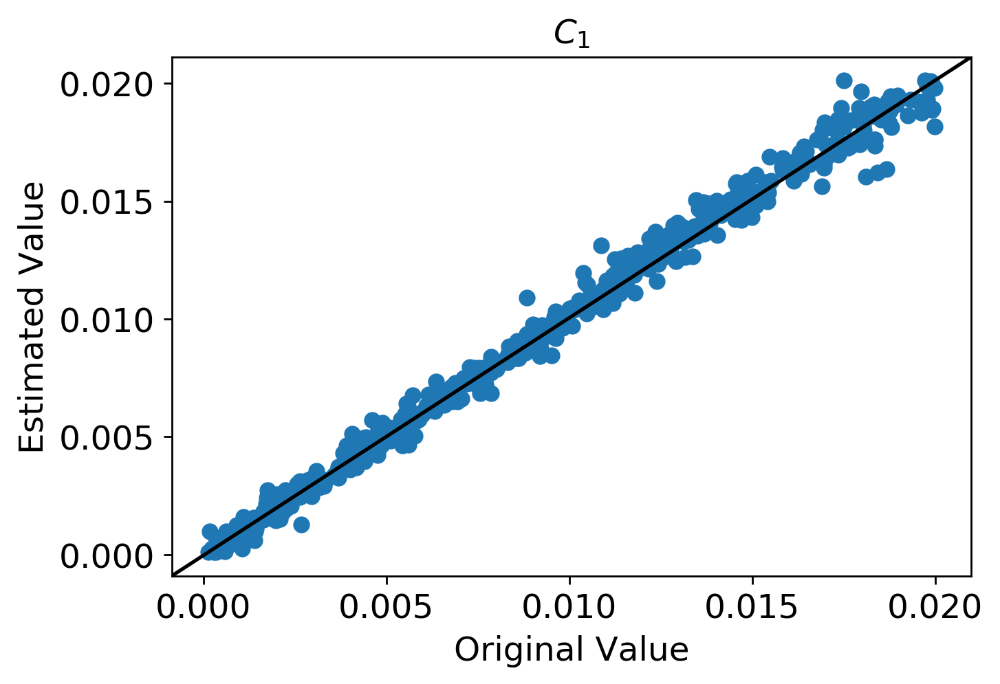

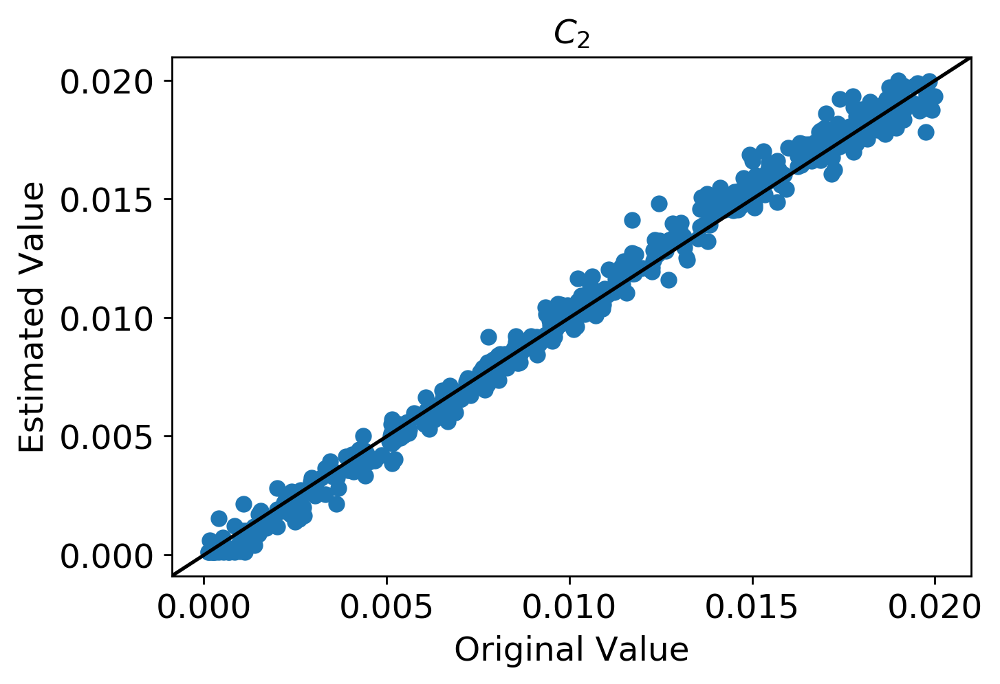

...

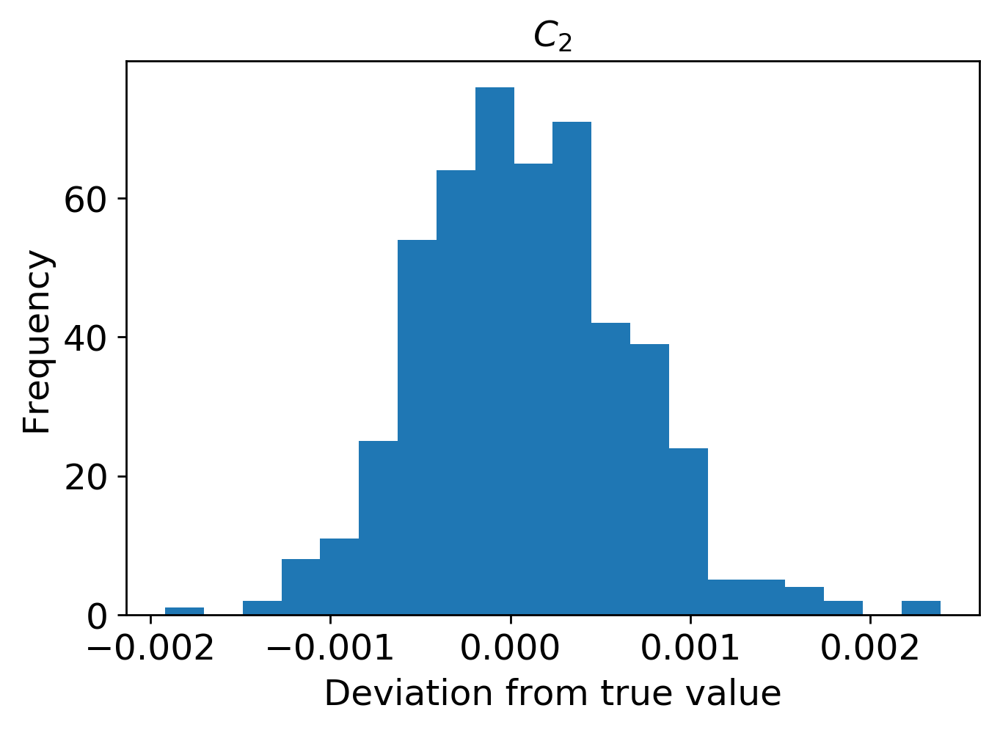

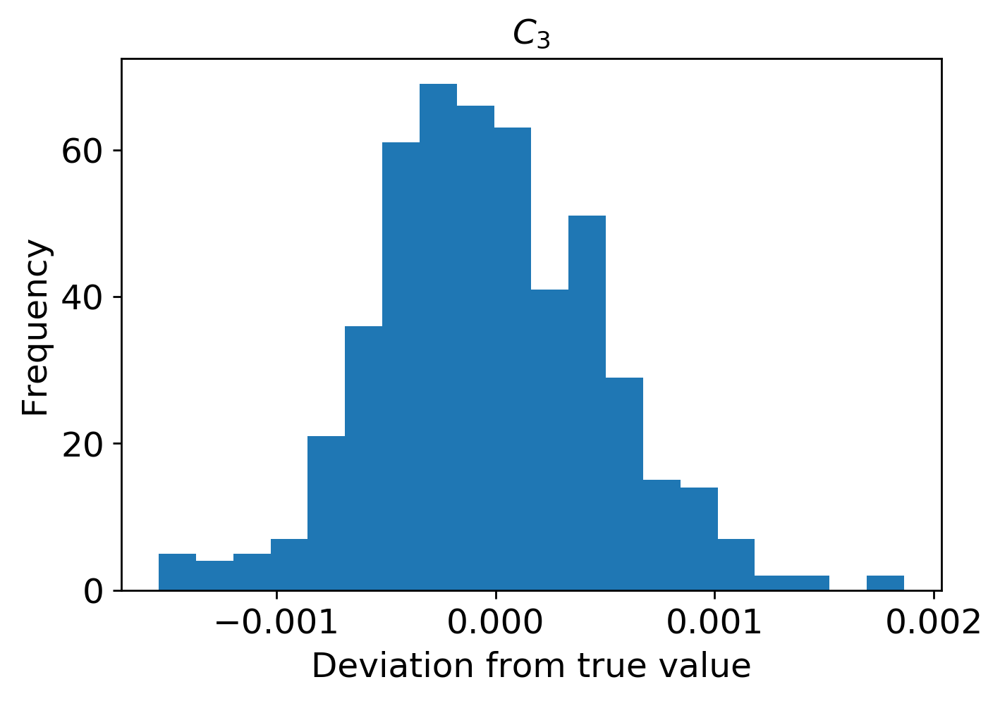

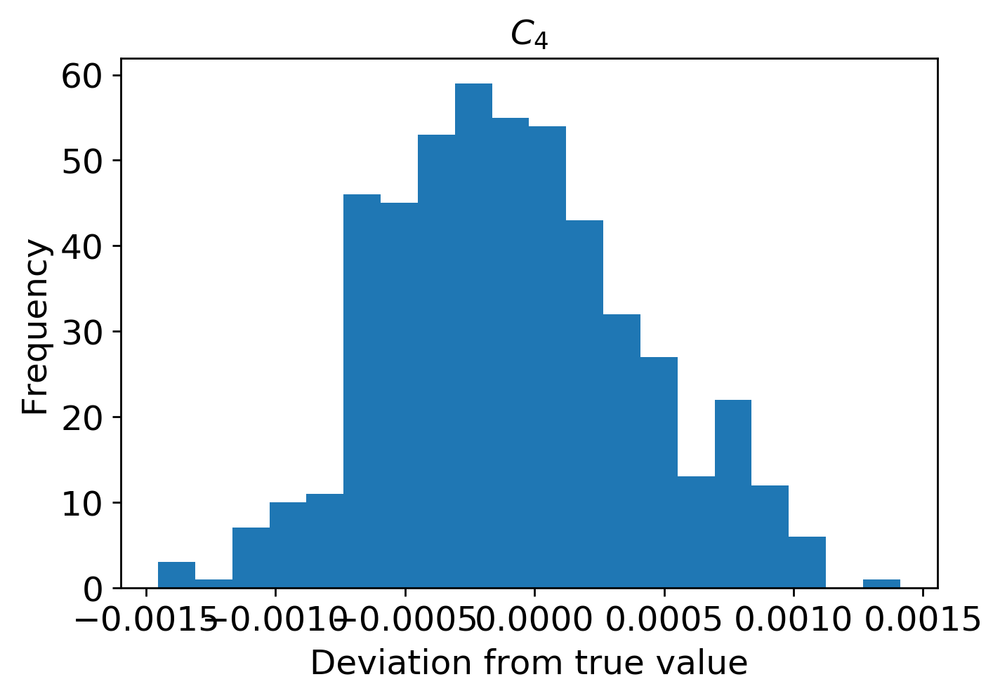

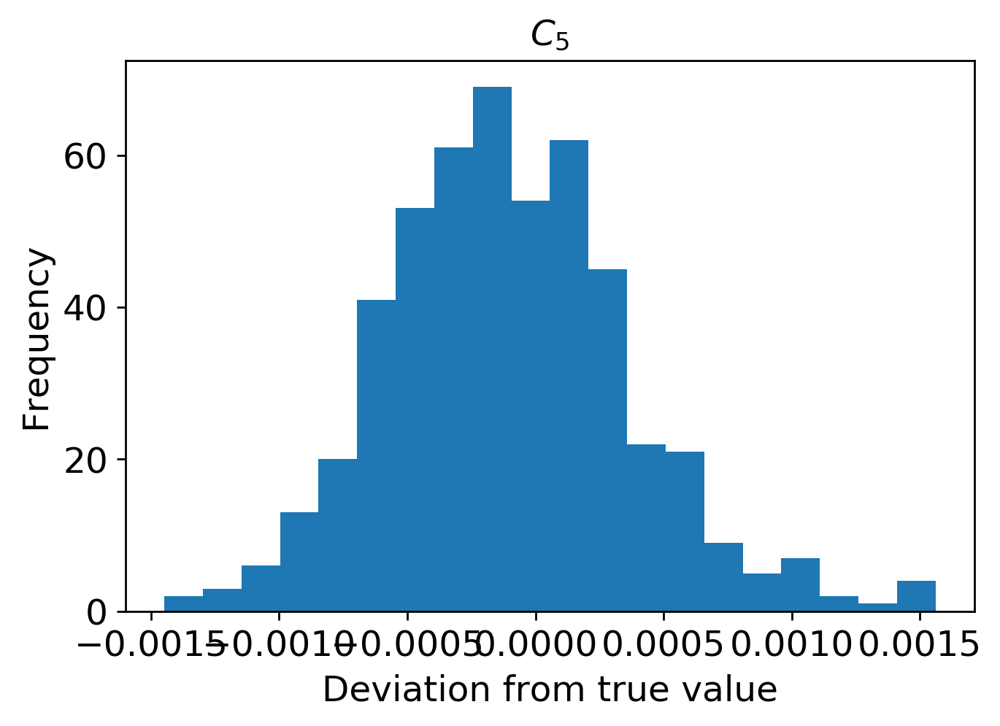

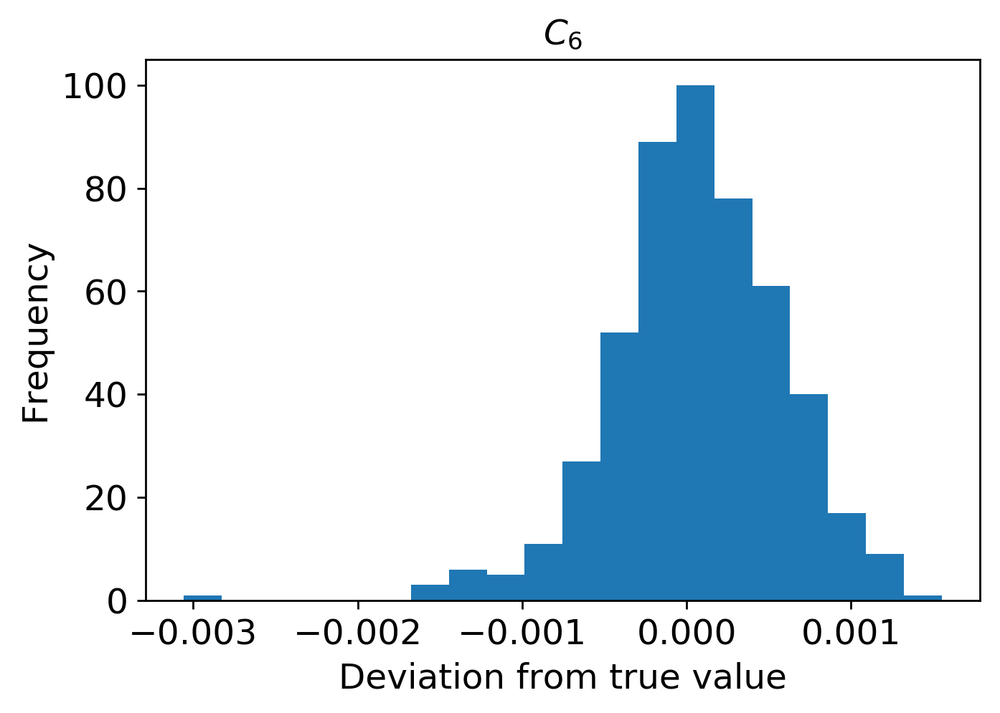

In [27]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi4000/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi4000/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

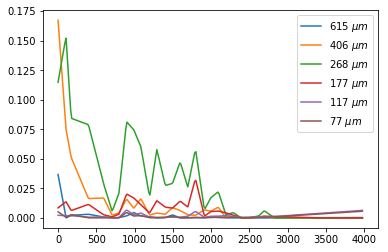

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi4000/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi4000/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='gaussian',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi4000.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



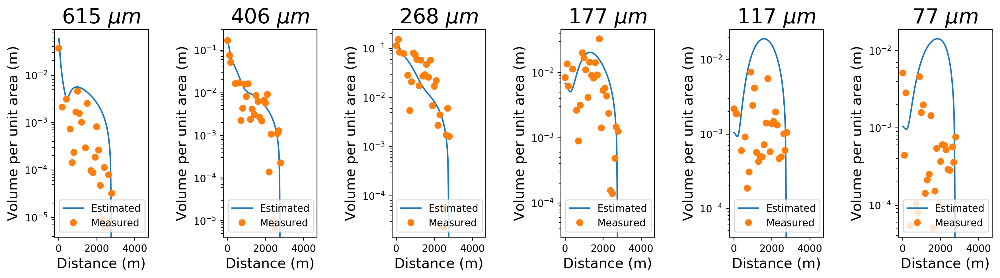

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi4000.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi4000.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi4000.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi4000.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi4000.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi4000.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi4000.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi4000.eps")
plt.show()

Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


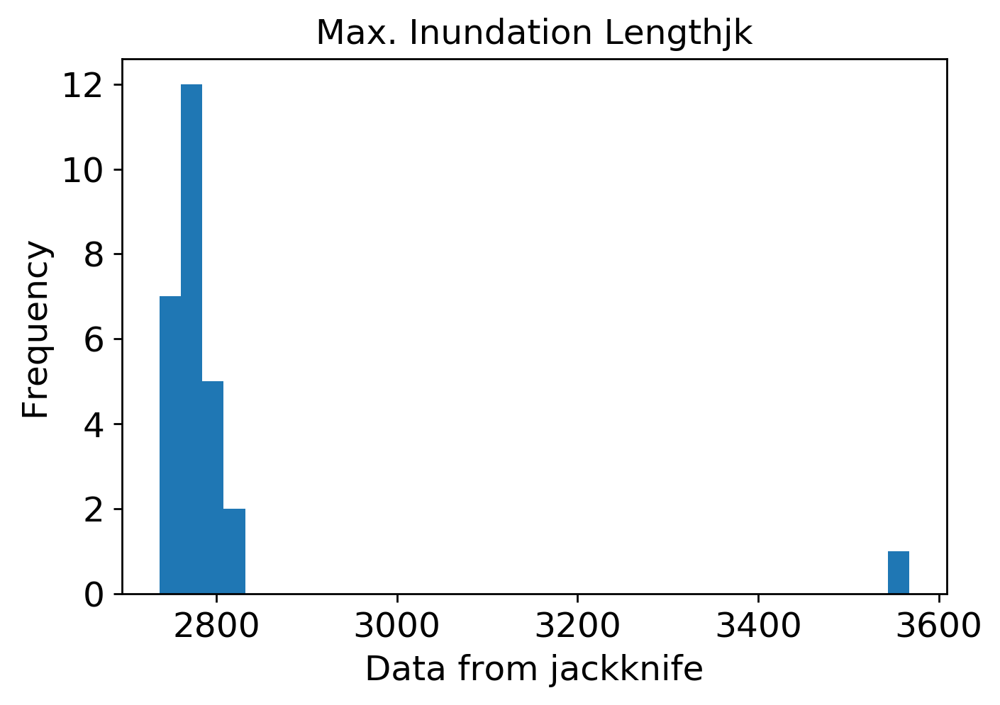

mean: 5.203397778943186
jk_e: 0.09785675504992701


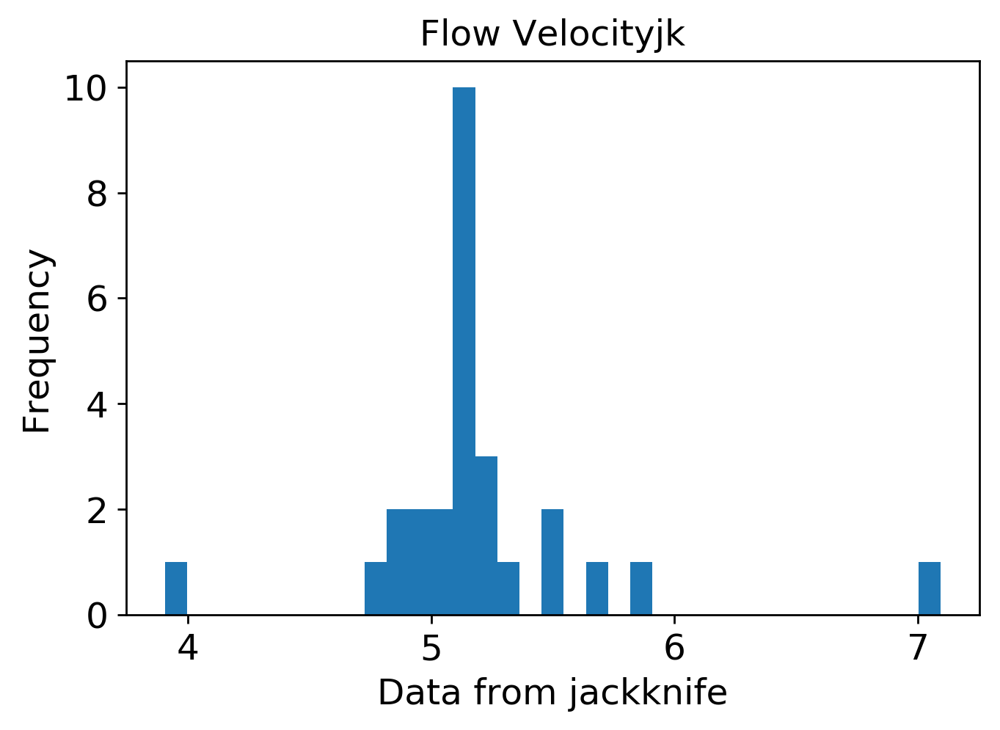

mean: 6.202182894603141
jk_e: 0.14803621267911932


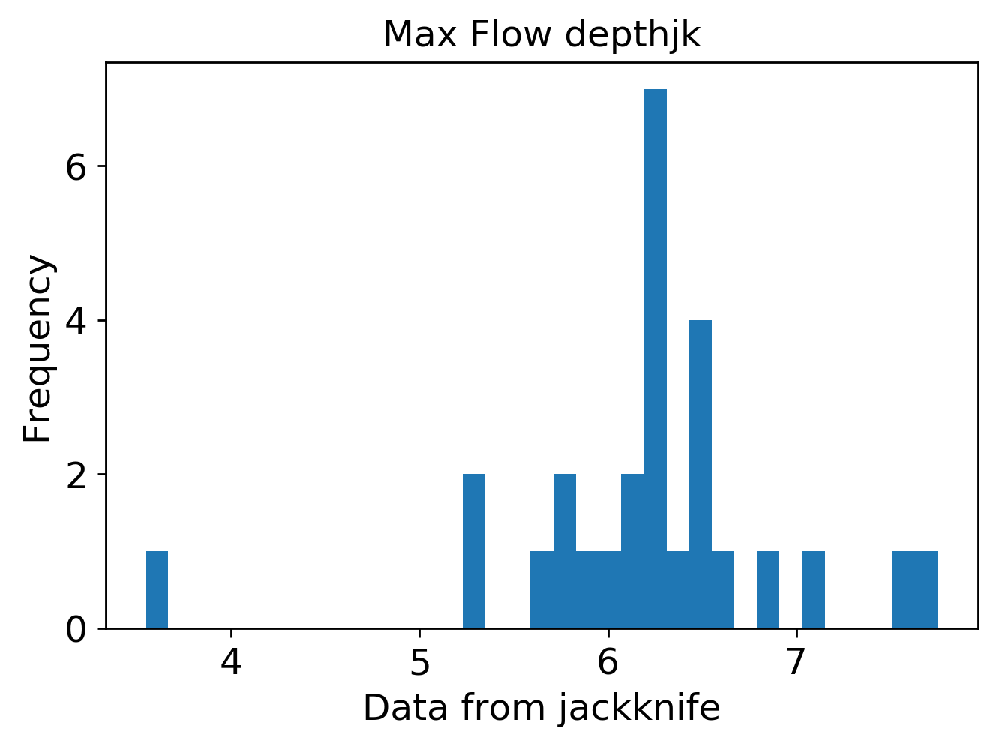

mean: 0.006324136197115053
jk_e: 0.000163783842458382


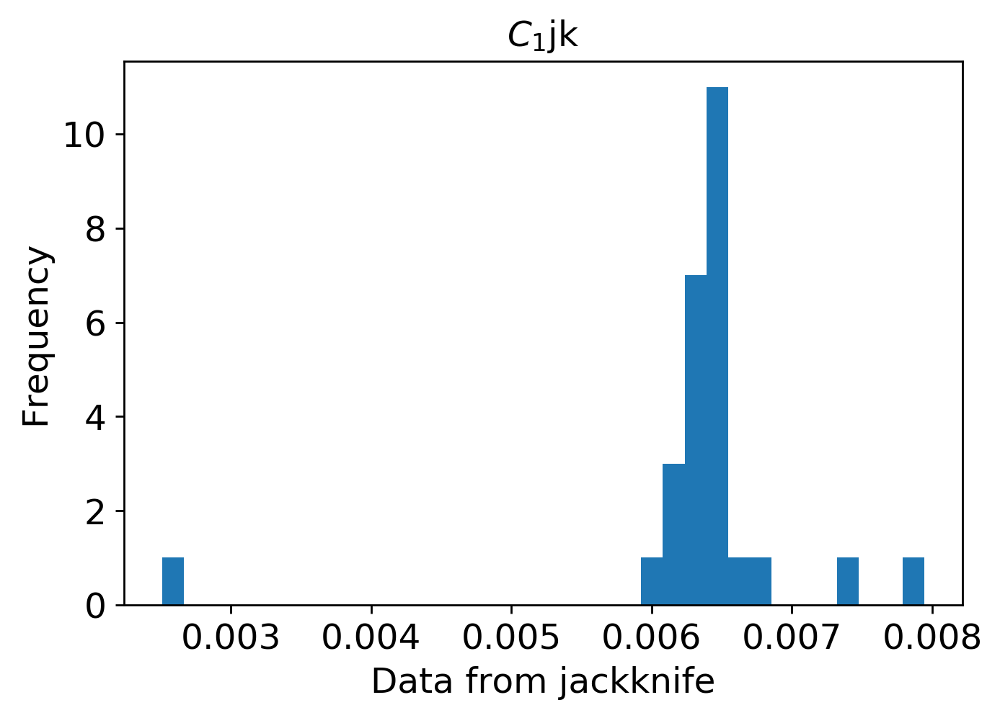

mean: 0.01925047459771814
jk_e: 0.0003419609166645373


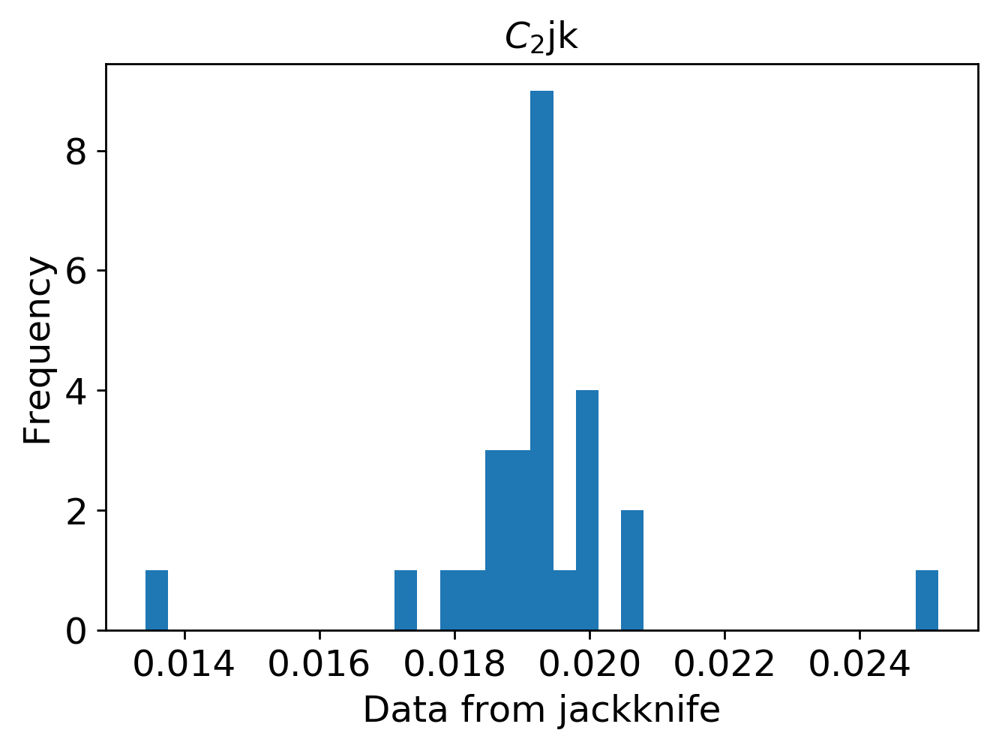

mean: 0.016350711911434154
jk_e: 0.00038417832524203626


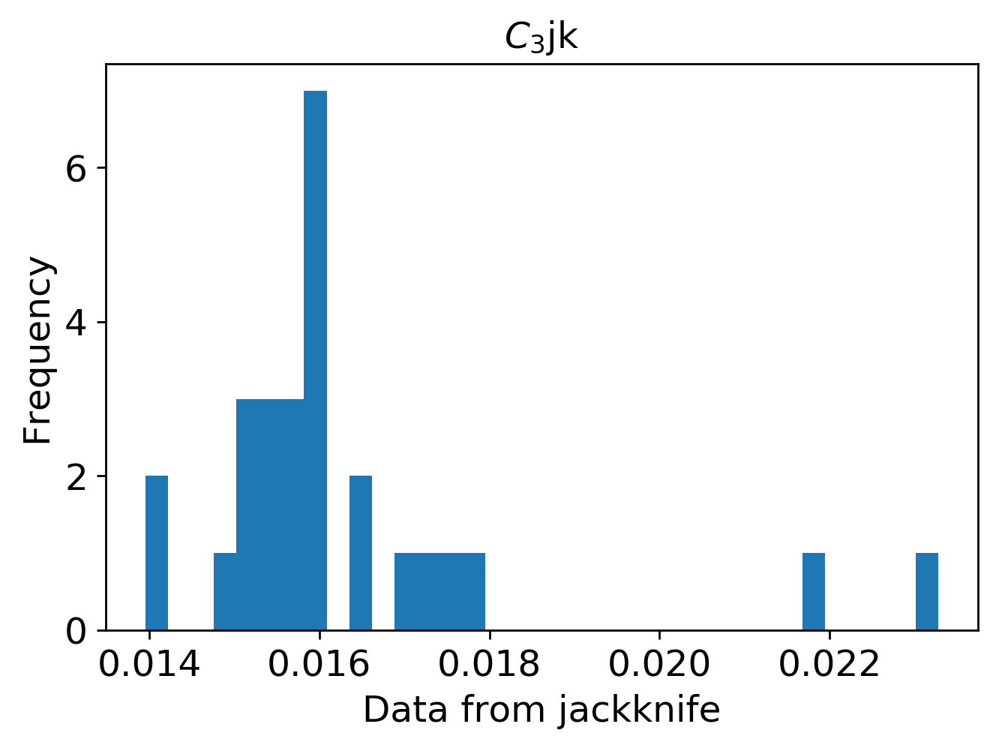

mean: 0.0007655288702823242
jk_e: 6.943686131893712e-05


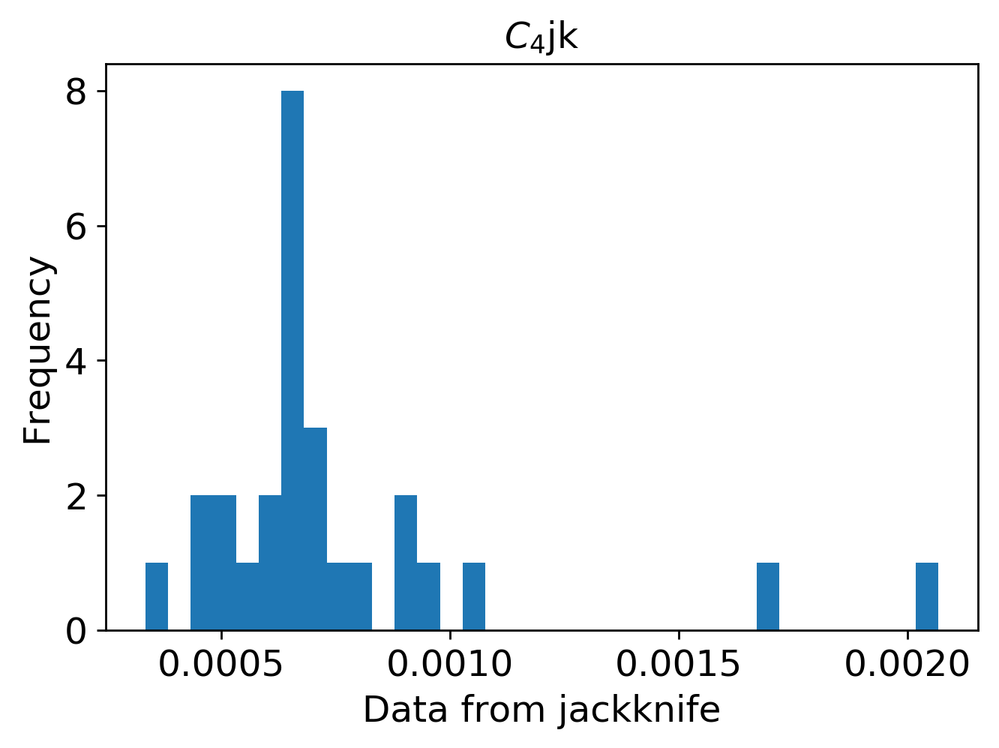

mean: 0.000225502855687054
jk_e: 8.655752228070706e-05


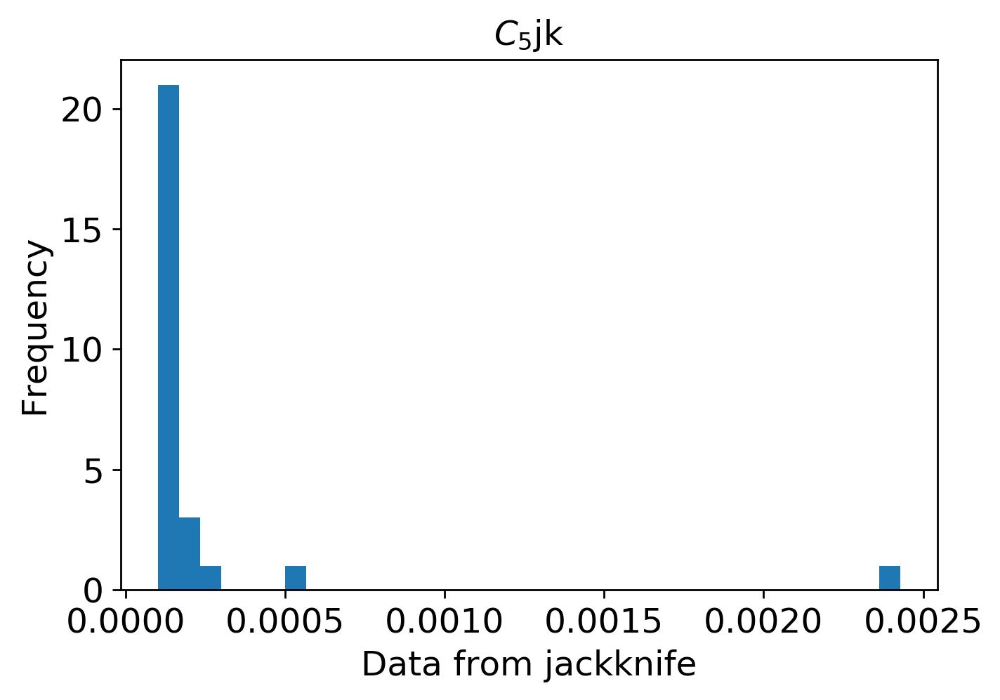

mean: 0.00016370008560802395
jk_e: 6.292639178743771e-05


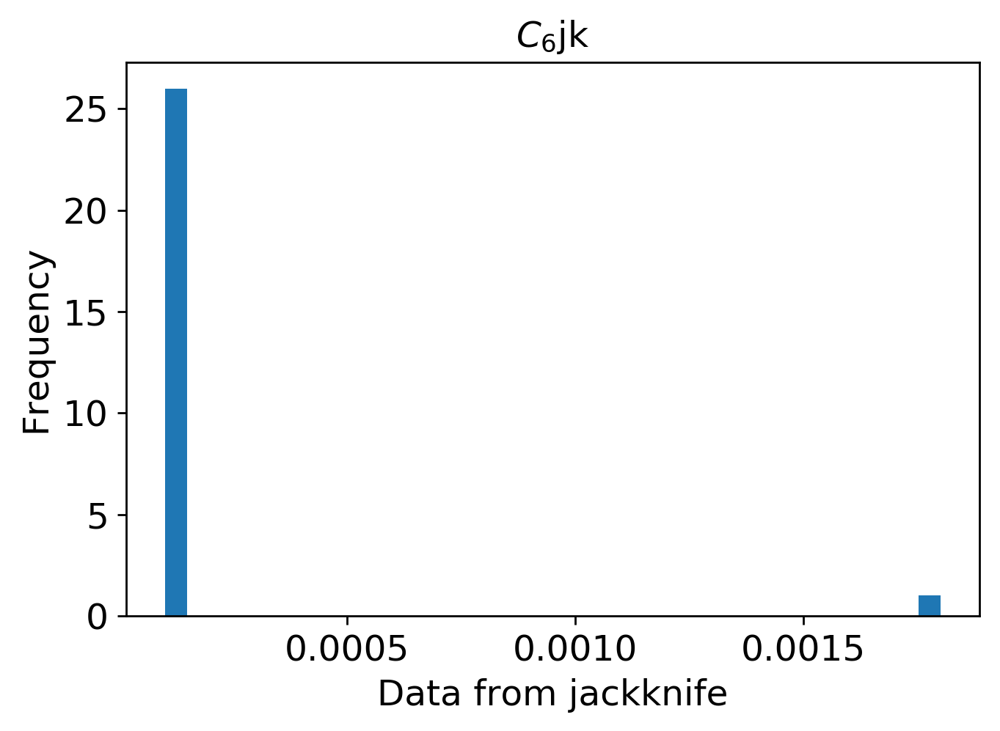

In [1]:
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi4000/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi4000/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi4000.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi4000.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi4000.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()